In [1]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import Rbeast as rb
from sklearn.linear_model import LinearRegression
import pandas as pd
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import geopandas as gpd
import pandas as pd
from shapely.ops import unary_union
from scipy.spatial import cKDTree
from sklearn.linear_model import LinearRegression
from scipy.signal import savgol_filter, medfilt
from pathlib import Path
from aislens.utils import write_crs
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objs as go

/var/folders/6z/tqg0lf9108s22svs6qbs4d_80131yc/T/ipykernel_88619/3843211320.py:10: UserWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas will still use PyGEOS by default for now. To force to use and test Shapely 2.0, you have to set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In a future release, GeoPandas will switch to using Shapely by default. If you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Shapely 2.0 (https://shapely.readthedocs.io/en/latest/migration_pygeos.html).
  import geopandas as gpd


In [2]:
def clip_data(total_data, basin):
    from shapely.geometry import mapping
    return total_data.rio.clip(icems.loc[[basin],'geometry'].apply(mapping), icems.crs)


def calculate_draft_threshold_and_predict(obs23_melt_tm, obs23_draft_tm, icems, clip_data, 
                                        n_bins=50, min_points_per_bin=5, 
                                        plot_individual=True, save_plots=False, save_dir=None):
    """
    Calculate draft threshold using BEAST changepoint detection and apply piecewise linear model.
    
    Parameters:
    -----------
    obs23_melt_tm : xarray.DataArray
        Time-mean melt rate data
    obs23_draft_tm : xarray.DataArray  
        Time-mean draft data
    icems : geopandas.GeoDataFrame
        Ice shelf geometries
    clip_data : function
        Function to clip data to ice shelf boundaries
    n_bins : int
        Number of bins for draft binning (default: 50)
    min_points_per_bin : int
        Minimum points required per bin (default: 5)
    plot_individual : bool
        Whether to plot individual ice shelf results (default: True)
    save_plots : bool
        Whether to save plots (default: False)
    save_dir : str
        Directory to save plots (default: None)
    
    Returns:
    --------
    results_dict : dict
        Dictionary containing results for each ice shelf
    """
    
    def find_changepoint_threshold(draft_vals, melt_vals, n_bins=50, min_points_per_bin=5):
        """Find draft threshold using BEAST changepoint detection on binned data."""
        # Remove NaN values
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        if np.sum(mask) < 20:
            return np.nan, np.nan, np.nan, np.nan
        
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Sort by draft
        sort_idx = np.argsort(draft_clean)
        draft_sorted = draft_clean[sort_idx]
        melt_sorted = melt_clean[sort_idx]
        
        # Bin the data
        bins = np.linspace(draft_sorted.min(), draft_sorted.max(), n_bins + 1)
        bin_indices = np.digitize(draft_sorted, bins) - 1
        
        # Calculate binned statistics
        binned_melt = []
        binned_draft = []
        valid_bins = []
        
        for i in range(n_bins):
            bin_mask = bin_indices == i
            if np.sum(bin_mask) >= min_points_per_bin:
                binned_melt.append(np.mean(melt_sorted[bin_mask]))
                binned_draft.append(np.mean(draft_sorted[bin_mask]))
                valid_bins.append(i)
        
        if len(binned_melt) < 10:
            return np.nan, np.nan, np.nan, np.nan
        
        binned_melt = np.array(binned_melt)
        binned_draft = np.array(binned_draft)
        
        # Run BEAST on binned melt data
        try:
            result = rb.beast(binned_melt)
            cp_indices = result.get('cp', [])
            
            if cp_indices is not None and len(cp_indices) > 0:
                # Take the first (most significant) changepoint
                if hasattr(cp_indices, '__iter__') and not isinstance(cp_indices, str):
                    cp_idx = int(cp_indices[0])
                else:
                    cp_idx = int(cp_indices)
                
                # Ensure index is within bounds
                if 0 <= cp_idx < len(binned_draft):
                    threshold_draft = binned_draft[cp_idx]
                else:
                    # Fall back to median if changepoint is out of bounds
                    threshold_draft = np.median(binned_draft)
            else:
                # No changepoint found, use median draft
                threshold_draft = np.median(binned_draft)
                
        except Exception as e:
            print(f"BEAST failed: {e}, using median draft as threshold")
            threshold_draft = np.median(binned_draft)
        
        return threshold_draft, binned_draft, binned_melt, (draft_clean, melt_clean)
    
    def fit_piecewise_model(draft_vals, melt_vals, threshold):
        """Fit piecewise linear model with threshold."""
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Points deeper than threshold (for linear regression)
        deep_mask = draft_clean >= threshold
        
        if np.sum(deep_mask) < 5:
            # Not enough deep points, use all data
            slope = 0
            intercept = np.nanmean(melt_clean)
        else:
            # Fit linear regression to deep points only
            X_deep = draft_clean[deep_mask].reshape(-1, 1)
            y_deep = melt_clean[deep_mask]
            
            reg = LinearRegression()
            reg.fit(X_deep, y_deep)
            slope = reg.coef_[0]
            intercept = reg.intercept_
        
        return slope, intercept

    def predict_piecewise(draft_vals, threshold, slope, intercept):
        """Predict melt using piecewise model."""
        predicted = np.full_like(draft_vals, np.nan)
        valid_mask = ~np.isnan(draft_vals)
        
        # Shallow points: use intercept
        shallow_mask = valid_mask & (draft_vals < threshold)
        predicted[shallow_mask] = intercept
        
        # Deep points: use linear relationship
        deep_mask = valid_mask & (draft_vals >= threshold)
        predicted[deep_mask] = slope * draft_vals[deep_mask] + intercept
        
        return predicted
    
    # Main processing loop
    shelf_names = list(icems.name.values)
    results_dict = {}
    
    for i, shelf_name in enumerate(shelf_names):
        print(f"Processing {shelf_name}...")
        
        try:
            # Clip data to ice shelf
            mlt = clip_data(obs23_melt_tm, i)
            drf = clip_data(obs23_draft_tm, i)
            
            # Flatten arrays
            melt_vals = mlt.values.flatten()
            draft_vals = drf.values.flatten()
            
            # Find changepoint threshold
            threshold, binned_draft, binned_melt, (draft_clean, melt_clean) = find_changepoint_threshold(
                draft_vals, melt_vals, n_bins, min_points_per_bin)
            
            if np.isnan(threshold):
                print(f"Skipping {shelf_name}: insufficient data")
                continue
            
            # Fit piecewise model
            slope, intercept = fit_piecewise_model(draft_vals, melt_vals, threshold)
            
            # Make predictions
            predicted_melt = predict_piecewise(draft_vals, threshold, slope, intercept)
            
            # Store results
            results_dict[shelf_name] = {
                'threshold': threshold,
                'slope': slope,
                'intercept': intercept,
                'draft_vals': draft_clean,
                'melt_vals': melt_clean,
                'predicted_melt': predict_piecewise(draft_clean, threshold, slope, intercept),
                'binned_draft': binned_draft,
                'binned_melt': binned_melt
            }
            
            # Plot individual results
            if plot_individual:
                fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
                
                # Plot 1: Binned data with threshold
                ax1.scatter(binned_draft, binned_melt, c='blue', s=30, alpha=0.7, label='Binned data')
                ax1.axvline(threshold, color='red', linestyle='--', linewidth=2, 
                           label=f'Threshold: {threshold:.1f}m')
                ax1.set_xlabel('Draft (m)')
                ax1.set_ylabel('Melt Rate (m/yr)')
                ax1.set_title(f'{shelf_name}: Binned Data & Threshold')
                ax1.legend()
                ax1.grid(True, alpha=0.3)
                
                # Plot 2: Original data vs predictions
                # Subsample for plotting if too many points
                n_plot = min(3000, len(draft_clean))
                if len(draft_clean) > n_plot:
                    plot_idx = np.random.choice(len(draft_clean), n_plot, replace=False)
                    plot_draft = draft_clean[plot_idx]
                    plot_melt = melt_clean[plot_idx]
                    plot_pred = results_dict[shelf_name]['predicted_melt'][plot_idx]
                else:
                    plot_draft = draft_clean
                    plot_melt = melt_clean
                    plot_pred = results_dict[shelf_name]['predicted_melt']
                
                ax2.scatter(plot_draft, plot_melt, c='black', s=8, alpha=0.6, label='Observed')
                ax2.scatter(plot_draft, plot_pred, c='red', s=8, alpha=0.8, label='Predicted')
                ax2.axvline(threshold, color='red', linestyle='--', linewidth=2, alpha=0.7)
                ax2.set_xlabel('Draft (m)')
                ax2.set_ylabel('Melt Rate (m/yr)')
                ax2.set_title(f'{shelf_name}: Observed vs Predicted')
                ax2.legend()
                ax2.grid(True, alpha=0.3)
                
                plt.tight_layout()
                
                if save_plots and save_dir:
                    plt.savefig(f"{save_dir}/piecewise_model_{shelf_name}.png", dpi=150, bbox_inches='tight')
                
                plt.show()
                
        except Exception as e:
            print(f"Error processing {shelf_name}: {e}")
            continue
    
    return results_dict

In [ ]:
import ruptures as rpt

def find_changepoint_threshold_ruptures(draft_vals, melt_vals, n_bins=50, min_points_per_bin=5, method='pelt'):
    """Find draft threshold using ruptures changepoint detection."""
    # Bin data as before
    mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
    if np.sum(mask) < 20:
        return np.nan, np.nan, np.nan, np.nan
    
    draft_clean = draft_vals[mask]
    melt_clean = melt_vals[mask]
    sort_idx = np.argsort(draft_clean)
    draft_sorted = draft_clean[sort_idx]
    melt_sorted = melt_clean[sort_idx]
    
    bins = np.linspace(draft_sorted.min(), draft_sorted.max(), n_bins + 1)
    bin_indices = np.digitize(draft_sorted, bins) - 1
    
    binned_melt = []
    binned_draft = []
    
    for i in range(n_bins):
        bin_mask = bin_indices == i
        if np.sum(bin_mask) >= min_points_per_bin:
            binned_melt.append(np.mean(melt_sorted[bin_mask]))
            binned_draft.append(np.mean(draft_sorted[bin_mask]))
    
    if len(binned_melt) < 10:
        return np.nan, np.nan, np.nan, np.nan
    
    binned_melt = np.array(binned_melt)
    binned_draft = np.array(binned_draft)
    
    # Use ruptures for changepoint detection
    try:
        if method == 'pelt':
            algo = rpt.Pelt(model="rbf").fit(binned_melt.reshape(-1, 1))
            result = algo.predict(pen=1.0)  # Adjust penalty as needed
        elif method == 'binseg':
            algo = rpt.Binseg(model="l2").fit(binned_melt.reshape(-1, 1))
            result = algo.predict(n_bkps=1)  # Find 1 breakpoint
        elif method == 'window':
            algo = rpt.Window(width=5, model="l2").fit(binned_melt.reshape(-1, 1))
            result = algo.predict(n_bkps=1)
        
        if len(result) > 1:  # ruptures returns end points, so take first changepoint
            cp_idx = result[0] - 1  # Convert to 0-based index
            if 0 <= cp_idx < len(binned_draft):
                threshold_draft = binned_draft[cp_idx]
            else:
                threshold_draft = np.median(binned_draft)
        else:
            threshold_draft = np.median(binned_draft)
            
    except Exception as e:
        print(f"ruptures failed: {e}, using median")
        threshold_draft = np.median(binned_draft)
    
    return threshold_draft, binned_draft, binned_melt, (draft_clean, melt_clean)

In [ ]:
import ruptures as rpt

def calculate_draft_threshold_and_predict_ruptures(obs23_melt_tm, obs23_draft_tm, icems, clip_data, 
                                                 n_bins=50, min_points_per_bin=5, 
                                                 ruptures_method='pelt', ruptures_penalty=1.0,
                                                 plot_individual=True, save_plots=False, save_dir=None):
    """
    Calculate draft threshold using ruptures changepoint detection and apply piecewise linear model.
    
    Parameters:
    -----------
    obs23_melt_tm : xarray.DataArray
        Time-mean melt rate data
    obs23_draft_tm : xarray.DataArray  
        Time-mean draft data
    icems : geopandas.GeoDataFrame
        Ice shelf geometries
    clip_data : function
        Function to clip data to ice shelf boundaries
    n_bins : int
        Number of bins for draft binning (default: 50)
    min_points_per_bin : int
        Minimum points required per bin (default: 5)
    ruptures_method : str
        Ruptures method: 'pelt', 'binseg', or 'window' (default: 'pelt')
    ruptures_penalty : float
        Penalty parameter for ruptures (default: 1.0)
    plot_individual : bool
        Whether to plot individual ice shelf results (default: True)
    save_plots : bool
        Whether to save plots (default: False)
    save_dir : str
        Directory to save plots (default: None)
    
    Returns:
    --------
    results_dict : dict
        Dictionary containing results for each ice shelf
    """
    
    def find_changepoint_threshold_ruptures(draft_vals, melt_vals, n_bins=50, min_points_per_bin=5, 
                                           method='pelt', penalty=1.0):
        """Find draft threshold using ruptures changepoint detection."""
        # Remove NaN values
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        if np.sum(mask) < 20:
            return np.nan, np.nan, np.nan, np.nan
        
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Sort by draft
        sort_idx = np.argsort(draft_clean)
        draft_sorted = draft_clean[sort_idx]
        melt_sorted = melt_clean[sort_idx]
        
        # Bin the data
        bins = np.linspace(draft_sorted.min(), draft_sorted.max(), n_bins + 1)
        bin_indices = np.digitize(draft_sorted, bins) - 1
        
        # Calculate binned statistics
        binned_melt = []
        binned_draft = []
        
        for i in range(n_bins):
            bin_mask = bin_indices == i
            if np.sum(bin_mask) >= min_points_per_bin:
                binned_melt.append(np.mean(melt_sorted[bin_mask]))
                binned_draft.append(np.mean(draft_sorted[bin_mask]))
        
        if len(binned_melt) < 10:
            return np.nan, np.nan, np.nan, np.nan
        
        binned_melt = np.array(binned_melt)
        binned_draft = np.array(binned_draft)
        
        # Use ruptures for changepoint detection
        try:
            if method == 'pelt':
                algo = rpt.Pelt(model="rbf", min_size=2).fit(binned_melt.reshape(-1, 1))
                result = algo.predict(pen=penalty)
            elif method == 'binseg':
                algo = rpt.Binseg(model="l2", min_size=2).fit(binned_melt.reshape(-1, 1))
                result = algo.predict(n_bkps=1)
            elif method == 'window':
                algo = rpt.Window(width=5, model="l2").fit(binned_melt.reshape(-1, 1))
                result = algo.predict(n_bkps=1)
            else:
                raise ValueError(f"Unknown method: {method}")
            
            if len(result) > 1:  # ruptures returns end points, so take first changepoint
                cp_idx = result[0] - 1  # Convert to 0-based index
                if 0 <= cp_idx < len(binned_draft):
                    threshold_draft = binned_draft[cp_idx]
                else:
                    threshold_draft = np.median(binned_draft)
            else:
                threshold_draft = np.median(binned_draft)
                
        except Exception as e:
            print(f"ruptures failed: {e}, using median")
            threshold_draft = np.median(binned_draft)
        
        return threshold_draft, binned_draft, binned_melt, (draft_clean, melt_clean)
    
    def fit_piecewise_model(draft_vals, melt_vals, threshold):
        """Fit piecewise linear model with threshold."""
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Points deeper than threshold (for linear regression)
        deep_mask = draft_clean >= threshold
        
        if np.sum(deep_mask) < 5:
            # Not enough deep points, use all data for slope estimation
            X_all = draft_clean.reshape(-1, 1)
            y_all = melt_clean
            reg = LinearRegression()
            reg.fit(X_all, y_all)
            slope = reg.coef_[0]
            intercept = reg.intercept_
        else:
            # Fit linear regression to deep points only
            X_deep = draft_clean[deep_mask].reshape(-1, 1)
            y_deep = melt_clean[deep_mask]
            
            reg = LinearRegression()
            reg.fit(X_deep, y_deep)
            slope = reg.coef_[0]
            intercept = reg.intercept_
        
        return slope, intercept
    
    def predict_piecewise(draft_vals, threshold, slope, intercept):
        """Predict melt using piecewise model."""
        predicted = np.full_like(draft_vals, np.nan)
        valid_mask = ~np.isnan(draft_vals)
        
        # Shallow points (above/shallower than threshold): use intercept value
        shallow_mask = valid_mask & (draft_vals < threshold)
        predicted[shallow_mask] = intercept
        
        # Deep points (at or deeper than threshold): use linear relationship
        deep_mask = valid_mask & (draft_vals >= threshold)
        predicted[deep_mask] = slope * draft_vals[deep_mask] + intercept
        
        return predicted
    
    # Main processing loop
    shelf_names = list(icems.name.values)
    results_dict = {}
    
    for i, shelf_name in enumerate(shelf_names):
        print(f"Processing {shelf_name}...")
        
        try:
            # Clip data to ice shelf
            mlt = clip_data(obs23_melt_tm, i)
            drf = clip_data(obs23_draft_tm, i)
            
            # Flatten arrays
            melt_vals = mlt.values.flatten()
            draft_vals = drf.values.flatten()
            
            # Find changepoint threshold using ruptures
            threshold, binned_draft, binned_melt, (draft_clean, melt_clean) = find_changepoint_threshold_ruptures(
                draft_vals, melt_vals, n_bins, min_points_per_bin, ruptures_method, ruptures_penalty)
            
            if np.isnan(threshold):
                print(f"Skipping {shelf_name}: insufficient data")
                continue
            
            # Fit piecewise model
            slope, intercept = fit_piecewise_model(draft_vals, melt_vals, threshold)
            
            # Make predictions
            predicted_melt = predict_piecewise(draft_clean, threshold, slope, intercept)
            
            # Store results
            results_dict[shelf_name] = {
                'threshold': threshold,
                'slope': slope,
                'intercept': intercept,
                'draft_vals': draft_clean,
                'melt_vals': melt_clean,
                'predicted_melt': predicted_melt,
                'binned_draft': binned_draft,
                'binned_melt': binned_melt
            }
            
            # Plot individual results
            if plot_individual:
                fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
                
                # Plot 1: Binned data with threshold and piecewise model
                # AXES SWAPPED: melt on x-axis, draft on y-axis
                ax1.scatter(binned_melt, binned_draft, c='blue', s=30, alpha=0.7, label='Binned data')
                ax1.axhline(threshold, color='red', linestyle='--', linewidth=2, 
                           label=f'Threshold: {threshold:.1f}m')
                
                # Add piecewise model line to binned plot
                # Create melt range for visualization
                melt_range = np.linspace(binned_melt.min(), binned_melt.max(), 100)
                draft_range = np.linspace(binned_draft.min(), binned_draft.max(), 100)
                model_pred = predict_piecewise(draft_range, threshold, slope, intercept)
                ax1.plot(model_pred, draft_range, 'r-', linewidth=2, alpha=0.8, label='Piecewise model')
                
                ax1.set_xlabel('Melt Rate (m/yr)')
                ax1.set_ylabel('Draft (m)')
                ax1.set_title(f'{shelf_name}: Binned Data & Changepoint')
                ax1.legend()
                ax1.grid(True, alpha=0.3)
                ax1.invert_yaxis()  # Reverse y-axis so shallow is at top
                
                # Plot 2: Original data vs predictions
                # Subsample for plotting if too many points
                n_plot = min(3000, len(draft_clean))
                if len(draft_clean) > n_plot:
                    plot_idx = np.random.choice(len(draft_clean), n_plot, replace=False)
                    plot_draft = draft_clean[plot_idx]
                    plot_melt = melt_clean[plot_idx]
                    plot_pred = predicted_melt[plot_idx]
                else:
                    plot_draft = draft_clean
                    plot_melt = melt_clean
                    plot_pred = predicted_melt
                
                # AXES SWAPPED: melt on x-axis, draft on y-axis
                ax2.scatter(plot_melt, plot_draft, c='black', s=4, alpha=0.4, label='Observed')
                ax2.scatter(plot_pred, plot_draft, c='red', s=4, alpha=0.6, label='Predicted')
                ax2.axhline(threshold, color='red', linestyle='--', linewidth=2, alpha=0.7, 
                           label=f'Threshold: {threshold:.1f}m')
                
                # Add model performance metrics
                mse = np.mean((plot_melt - plot_pred)**2)
                r2 = 1 - np.sum((plot_melt - plot_pred)**2) / np.sum((plot_melt - np.mean(plot_melt))**2)
                
                ax2.set_xlabel('Melt Rate (m/yr)')
                ax2.set_ylabel('Draft (m)')
                ax2.set_title(f'{shelf_name}: Observed vs Predicted\nMSE: {mse:.3f}, R²: {r2:.3f}')
                ax2.legend()
                ax2.grid(True, alpha=0.3)
                ax2.invert_yaxis()  # Reverse y-axis so shallow is at top
                
                plt.tight_layout()
                
                if save_plots and save_dir:
                    plt.savefig(f"{save_dir}/piecewise_model_{shelf_name}.png", dpi=150, bbox_inches='tight')
                
                plt.show()
                
        except Exception as e:
            print(f"Error processing {shelf_name}: {e}")
            continue
    
    return results_dict

# Enhanced summary function with additional metrics
def summarize_threshold_results_enhanced(results_dict):
    """Create enhanced summary statistics of threshold results."""
    summary_data = []
    
    for shelf_name, results in results_dict.items():
        # Calculate model performance metrics
        melt_obs = results['melt_vals']
        melt_pred = results['predicted_melt']
        
        # Remove NaN values for metrics calculation
        valid_mask = ~np.isnan(melt_obs) & ~np.isnan(melt_pred)
        if np.sum(valid_mask) > 0:
            obs_clean = melt_obs[valid_mask]
            pred_clean = melt_pred[valid_mask]
            
            mse = np.mean((obs_clean - pred_clean)**2)
            rmse = np.sqrt(mse)
            mae = np.mean(np.abs(obs_clean - pred_clean))
            r2 = 1 - np.sum((obs_clean - pred_clean)**2) / np.sum((obs_clean - np.mean(obs_clean))**2)
            
            # Calculate percentage of points above vs below threshold
            draft_vals = results['draft_vals']
            threshold = results['threshold']
            pct_above_threshold = np.sum(draft_vals >= threshold) / len(draft_vals) * 100
        else:
            mse = rmse = mae = r2 = np.nan
            pct_above_threshold = np.nan
        
        summary_data.append({
            'shelf': shelf_name,
            'threshold_draft': results['threshold'],
            'slope': results['slope'],
            'intercept': results['intercept'],
            'n_points': len(results['melt_vals']),
            'pct_above_threshold': pct_above_threshold,
            'mse': mse,
            'rmse': rmse,
            'mae': mae,
            'r2': r2
        })
    
    summary_df = pd.DataFrame(summary_data)
    return summary_df

# Run the analysis with ruptures
results_ruptures = calculate_draft_threshold_and_predict_ruptures(
    obs23_melt_tm, obs23_draft_tm, icems, clip_data,
    n_bins=50, 
    min_points_per_bin=5,
    ruptures_method='pelt',  # Options: 'pelt', 'binseg', 'window'
    ruptures_penalty=1.0,    # Adjust this to control sensitivity
    plot_individual=True,
    save_plots=False
)

# Get enhanced summary statistics
summary_enhanced = summarize_threshold_results_enhanced(results_ruptures)
print("Enhanced Summary of draft thresholds (using ruptures):")
print(summary_enhanced.round(3))

# Display top performing models
print("\nTop 5 shelves by R² score:")
print(summary_enhanced.nlargest(5, 'r2')[['shelf', 'threshold_draft', 'slope', 'r2']].round(3))

In [ ]:
import ruptures as rpt
from scipy.stats import pearsonr

def calculate_draft_threshold_and_predict_ruptures(obs23_melt_tm, obs23_draft_tm, icems, clip_data, 
                                                 n_bins=50, min_points_per_bin=5, 
                                                 ruptures_method='pelt', ruptures_penalty=1.0,
                                                 plot_individual=True, save_plots=False, save_dir=None,
                                                 min_r2_threshold=0.1, min_correlation=0.3):
    """
    Calculate draft threshold using ruptures changepoint detection and apply piecewise linear model.
    
    Parameters:
    -----------
    obs23_melt_tm : xarray.DataArray
        Time-mean melt rate data
    obs23_draft_tm : xarray.DataArray  
        Time-mean draft data
    icems : geopandas.GeoDataFrame
        Ice shelf geometries
    clip_data : function
        Function to clip data to ice shelf boundaries
    n_bins : int
        Number of bins for draft binning (default: 50)
    min_points_per_bin : int
        Minimum points required per bin (default: 5)
    ruptures_method : str
        Ruptures method: 'pelt', 'binseg', or 'window' (default: 'pelt')
    ruptures_penalty : float
        Penalty parameter for ruptures (default: 1.0)
    plot_individual : bool
        Whether to plot individual ice shelf results (default: True)
    save_plots : bool
        Whether to save plots (default: False)
    save_dir : str
        Directory to save plots (default: None)
    min_r2_threshold : float
        Minimum R² for considering the relationship meaningful (default: 0.1)
    min_correlation : float
        Minimum correlation for considering the relationship meaningful (default: 0.3)
    
    Returns:
    --------
    results_dict : dict
        Dictionary containing results for each ice shelf
    """
    
    def assess_data_quality(draft_vals, melt_vals, min_r2=0.1, min_corr=0.3):
        """Assess if the draft-melt relationship is meaningful or too noisy."""
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        if np.sum(mask) < 20:
            return False, 0.0, 0.0
        
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Calculate correlation
        try:
            correlation, p_value = pearsonr(draft_clean, melt_clean)
        except:
            correlation, p_value = 0.0, 1.0
        
        # Calculate R² from simple linear regression
        try:
            reg = LinearRegression()
            reg.fit(draft_clean.reshape(-1, 1), melt_clean)
            r2 = reg.score(draft_clean.reshape(-1, 1), melt_clean)
        except:
            r2 = 0.0
        
        # Check if relationship is meaningful
        is_meaningful = (abs(correlation) >= min_corr) and (r2 >= min_r2) and (p_value < 0.05)
        
        return is_meaningful, correlation, r2
    
    def find_changepoint_threshold_ruptures(draft_vals, melt_vals, n_bins=50, min_points_per_bin=5, 
                                           method='pelt', penalty=1.0):
        """Find draft threshold using ruptures changepoint detection."""
        # Remove NaN values
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        if np.sum(mask) < 20:
            return np.nan, np.nan, np.nan, np.nan
        
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Sort by draft
        sort_idx = np.argsort(draft_clean)
        draft_sorted = draft_clean[sort_idx]
        melt_sorted = melt_clean[sort_idx]
        
        # Bin the data
        bins = np.linspace(draft_sorted.min(), draft_sorted.max(), n_bins + 1)
        bin_indices = np.digitize(draft_sorted, bins) - 1
        
        # Calculate binned statistics
        binned_melt = []
        binned_draft = []
        
        for i in range(n_bins):
            bin_mask = bin_indices == i
            if np.sum(bin_mask) >= min_points_per_bin:
                binned_melt.append(np.mean(melt_sorted[bin_mask]))
                binned_draft.append(np.mean(draft_sorted[bin_mask]))
        
        if len(binned_melt) < 10:
            return np.nan, np.nan, np.nan, np.nan
        
        binned_melt = np.array(binned_melt)
        binned_draft = np.array(binned_draft)
        
        # Use ruptures for changepoint detection
        try:
            if method == 'pelt':
                algo = rpt.Pelt(model="rbf", min_size=2).fit(binned_melt.reshape(-1, 1))
                result = algo.predict(pen=penalty)
            elif method == 'binseg':
                algo = rpt.Binseg(model="l2", min_size=2).fit(binned_melt.reshape(-1, 1))
                result = algo.predict(n_bkps=1)
            elif method == 'window':
                algo = rpt.Window(width=5, model="l2").fit(binned_melt.reshape(-1, 1))
                result = algo.predict(n_bkps=1)
            else:
                raise ValueError(f"Unknown method: {method}")
            
            if len(result) > 1:  # ruptures returns end points, so take first changepoint
                cp_idx = result[0] - 1  # Convert to 0-based index
                if 0 <= cp_idx < len(binned_draft):
                    threshold_draft = binned_draft[cp_idx]
                else:
                    threshold_draft = np.median(binned_draft)
            else:
                threshold_draft = np.median(binned_draft)
                
        except Exception as e:
            print(f"ruptures failed: {e}, using median")
            threshold_draft = np.median(binned_draft)
        
        return threshold_draft, binned_draft, binned_melt, (draft_clean, melt_clean)
    
    def fit_piecewise_model(draft_vals, melt_vals, threshold):
        """Fit piecewise linear model with separate intercepts for shallow and deep regions."""
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Points deeper than threshold (for linear regression)
        deep_mask = draft_clean >= threshold
        shallow_mask = draft_clean < threshold
        
        # Calculate shallow intercept (mean of shallow points)
        if np.sum(shallow_mask) >= 5:
            shallow_intercept = np.mean(melt_clean[shallow_mask])
        else:
            shallow_intercept = np.mean(melt_clean)  # Fallback to overall mean
        
        # Fit linear regression to deep points
        if np.sum(deep_mask) >= 5:
            X_deep = draft_clean[deep_mask].reshape(-1, 1)
            y_deep = melt_clean[deep_mask]
            
            reg = LinearRegression()
            reg.fit(X_deep, y_deep)
            slope = reg.coef_[0]
            deep_intercept = reg.intercept_  # This is the y-intercept of the deep linear fit
        else:
            # Not enough deep points, use all data
            X_all = draft_clean.reshape(-1, 1)
            y_all = melt_clean
            reg = LinearRegression()
            reg.fit(X_all, y_all)
            slope = reg.coef_[0]
            deep_intercept = reg.intercept_
            
        return slope, shallow_intercept, deep_intercept
    
    def predict_piecewise(draft_vals, threshold, slope, shallow_intercept, deep_intercept):
        """Predict melt using piecewise model with separate intercepts."""
        predicted = np.full_like(draft_vals, np.nan)
        valid_mask = ~np.isnan(draft_vals)
        
        # Shallow points: use shallow intercept (constant value)
        shallow_mask = valid_mask & (draft_vals < threshold)
        predicted[shallow_mask] = shallow_intercept
        
        # Deep points: use linear relationship with deep intercept
        deep_mask = valid_mask & (draft_vals >= threshold)
        predicted[deep_mask] = slope * draft_vals[deep_mask] + deep_intercept
        
        return predicted
    
    # Main processing loop
    shelf_names = list(icems.name.values)
    results_dict = {}
    
    for i, shelf_name in enumerate(shelf_names):
        print(f"Processing {shelf_name}...")
        
        try:
            # Clip data to ice shelf
            mlt = clip_data(obs23_melt_tm, i)
            drf = clip_data(obs23_draft_tm, i)
            
            # Flatten arrays
            melt_vals = mlt.values.flatten()
            draft_vals = drf.values.flatten()
            
            # Assess data quality first
            is_meaningful, correlation, overall_r2 = assess_data_quality(
                draft_vals, melt_vals, min_r2_threshold, min_correlation)
            
            if not is_meaningful:
                print(f"Skipping {shelf_name}: relationship too noisy or weak (corr={correlation:.3f}, R²={overall_r2:.3f})")
                # Store results with zero melt prediction
                mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
                if np.sum(mask) > 0:
                    draft_clean = draft_vals[mask]
                    melt_clean = melt_vals[mask]
                    predicted_melt = np.zeros_like(draft_clean)
                    
                    results_dict[shelf_name] = {
                        'threshold': np.nan,
                        'slope': 0.0,
                        'shallow_intercept': 0.0,
                        'deep_intercept': 0.0,
                        'draft_vals': draft_clean,
                        'melt_vals': melt_clean,
                        'predicted_melt': predicted_melt,
                        'binned_draft': None,
                        'binned_melt': None,
                        'is_meaningful': False,
                        'correlation': correlation,
                        'overall_r2': overall_r2
                    }
                continue
            
            # Find changepoint threshold using ruptures
            threshold, binned_draft, binned_melt, (draft_clean, melt_clean) = find_changepoint_threshold_ruptures(
                draft_vals, melt_vals, n_bins, min_points_per_bin, ruptures_method, ruptures_penalty)
            
            if np.isnan(threshold):
                print(f"Skipping {shelf_name}: insufficient data for changepoint detection")
                continue
            
            # Fit piecewise model with separate intercepts
            slope, shallow_intercept, deep_intercept = fit_piecewise_model(draft_vals, melt_vals, threshold)
            
            # Make predictions
            predicted_melt = predict_piecewise(draft_clean, threshold, slope, shallow_intercept, deep_intercept)
            
            # Store results
            results_dict[shelf_name] = {
                'threshold': threshold,
                'slope': slope,
                'shallow_intercept': shallow_intercept,
                'deep_intercept': deep_intercept,
                'draft_vals': draft_clean,
                'melt_vals': melt_clean,
                'predicted_melt': predicted_melt,
                'binned_draft': binned_draft,
                'binned_melt': binned_melt,
                'is_meaningful': True,
                'correlation': correlation,
                'overall_r2': overall_r2
            }
            
            # Plot individual results
            if plot_individual:
                fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
                
                # Plot 1: Binned data with threshold and piecewise model
                ax1.scatter(binned_melt, binned_draft, c='blue', s=30, alpha=0.7, label='Binned data')
                ax1.axhline(threshold, color='red', linestyle='--', linewidth=2, 
                           label=f'Threshold: {threshold:.1f}m')
                
                # Add piecewise model line to binned plot
                melt_range = np.linspace(binned_melt.min(), binned_melt.max(), 100)
                draft_range = np.linspace(binned_draft.min(), binned_draft.max(), 100)
                model_pred = predict_piecewise(draft_range, threshold, slope, shallow_intercept, deep_intercept)
                ax1.plot(model_pred, draft_range, 'r-', linewidth=2, alpha=0.8, label='Piecewise model')
                
                # Add horizontal line for shallow intercept
                ax1.axhline(threshold, color='orange', linestyle=':', linewidth=1, alpha=0.7)
                shallow_drafts = draft_range[draft_range < threshold]
                if len(shallow_drafts) > 0:
                    ax1.plot([shallow_intercept]*len(shallow_drafts), shallow_drafts, 'orange', 
                            linewidth=2, alpha=0.8, label=f'Shallow: {shallow_intercept:.2f} m/yr')
                
                ax1.set_xlabel('Melt Rate (m/yr)')
                ax1.set_ylabel('Draft (m)')
                ax1.set_title(f'{shelf_name}: Binned Data & Changepoint\nCorr: {correlation:.3f}, R²: {overall_r2:.3f}')
                ax1.legend()
                ax1.grid(True, alpha=0.3)
                ax1.invert_yaxis()
                
                # Plot 2: Original data vs predictions
                n_plot = min(3000, len(draft_clean))
                if len(draft_clean) > n_plot:
                    plot_idx = np.random.choice(len(draft_clean), n_plot, replace=False)
                    plot_draft = draft_clean[plot_idx]
                    plot_melt = melt_clean[plot_idx]
                    plot_pred = predicted_melt[plot_idx]
                else:
                    plot_draft = draft_clean
                    plot_melt = melt_clean
                    plot_pred = predicted_melt
                
                ax2.scatter(plot_melt, plot_draft, c='black', s=4, alpha=0.4, label='Observed')
                ax2.scatter(plot_pred, plot_draft, c='red', s=4, alpha=0.6, label='Predicted')
                ax2.axhline(threshold, color='red', linestyle='--', linewidth=2, alpha=0.7, 
                           label=f'Threshold: {threshold:.1f}m')
                
                # Add model performance metrics
                mse = np.mean((plot_melt - plot_pred)**2)
                r2 = 1 - np.sum((plot_melt - plot_pred)**2) / np.sum((plot_melt - np.mean(plot_melt))**2)
                
                ax2.set_xlabel('Melt Rate (m/yr)')
                ax2.set_ylabel('Draft (m)')
                ax2.set_title(f'{shelf_name}: Observed vs Predicted\nMSE: {mse:.3f}, R²: {r2:.3f}')
                ax2.legend()
                ax2.grid(True, alpha=0.3)
                ax2.invert_yaxis()
                
                plt.tight_layout()
                
                if save_plots and save_dir:
                    plt.savefig(f"{save_dir}/piecewise_model_{shelf_name}.png", dpi=150, bbox_inches='tight')
                
                plt.show()
                
        except Exception as e:
            print(f"Error processing {shelf_name}: {e}")
            continue
    
    return results_dict

# Enhanced summary function with additional metrics
def summarize_threshold_results_enhanced(results_dict):
    """Create enhanced summary statistics of threshold results."""
    summary_data = []
    
    for shelf_name, results in results_dict.items():
        # Calculate model performance metrics
        melt_obs = results['melt_vals']
        melt_pred = results['predicted_melt']
        
        # Remove NaN values for metrics calculation
        valid_mask = ~np.isnan(melt_obs) & ~np.isnan(melt_pred)
        if np.sum(valid_mask) > 0:
            obs_clean = melt_obs[valid_mask]
            pred_clean = melt_pred[valid_mask]
            
            mse = np.mean((obs_clean - pred_clean)**2)
            rmse = np.sqrt(mse)
            mae = np.mean(np.abs(obs_clean - pred_clean))
            r2 = 1 - np.sum((obs_clean - pred_clean)**2) / np.sum((obs_clean - np.mean(obs_clean))**2)
            
            # Calculate percentage of points above vs below threshold
            draft_vals = results['draft_vals']
            threshold = results.get('threshold', np.nan)
            if not np.isnan(threshold):
                pct_above_threshold = np.sum(draft_vals >= threshold) / len(draft_vals) * 100
            else:
                pct_above_threshold = np.nan
        else:
            mse = rmse = mae = r2 = np.nan
            pct_above_threshold = np.nan
        
        summary_data.append({
            'shelf': shelf_name,
            'threshold_draft': results.get('threshold', np.nan),
            'slope': results.get('slope', 0.0),
            'shallow_intercept': results.get('shallow_intercept', 0.0),
            'deep_intercept': results.get('deep_intercept', 0.0),
            'n_points': len(results['melt_vals']),
            'pct_above_threshold': pct_above_threshold,
            'is_meaningful': results.get('is_meaningful', False),
            'correlation': results.get('correlation', np.nan),
            'overall_r2': results.get('overall_r2', np.nan),
            'mse': mse,
            'rmse': rmse,
            'mae': mae,
            'r2': r2
        })
    
    summary_df = pd.DataFrame(summary_data)
    return summary_df

# Run the analysis with ruptures
results_ruptures = calculate_draft_threshold_and_predict_ruptures(
    obs23_melt_tm, obs23_draft_tm, icems, clip_data,
    n_bins=50, 
    min_points_per_bin=5,
    ruptures_method='pelt',
    ruptures_penalty=1.0,
    plot_individual=True,
    save_plots=False,
    min_r2_threshold=0.1,    # Minimum R² to consider relationship meaningful
    min_correlation=0.3      # Minimum correlation to consider relationship meaningful
)

# Get enhanced summary statistics
summary_enhanced = summarize_threshold_results_enhanced(results_ruptures)
print("Enhanced Summary of draft thresholds (using ruptures):")
print(summary_enhanced.round(3))

# Display meaningful vs non-meaningful relationships
meaningful = summary_enhanced[summary_enhanced['is_meaningful'] == True]
non_meaningful = summary_enhanced[summary_enhanced['is_meaningful'] == False]

print(f"\nMeaningful relationships: {len(meaningful)} shelves")
print(f"Non-meaningful relationships (set to 0 melt): {len(non_meaningful)} shelves")

if len(meaningful) > 0:
    print("\nTop 5 meaningful shelves by R² score:")
    print(meaningful.nlargest(5, 'r2')[['shelf', 'threshold_draft', 'slope', 'shallow_intercept', 'r2']].round(3))

if len(non_meaningful) > 0:
    print(f"\nShelves with relationships too noisy (predicted melt = 0):")
    print(non_meaningful[['shelf', 'correlation', 'overall_r2']].round(3))

In [ ]:
import ruptures as rpt
from scipy.stats import pearsonr

def calculate_draft_threshold_and_predict_ruptures_comprehensive(obs23_melt_tm, obs23_draft_tm, icems, clip_data, 
                                                               n_bins=50, min_points_per_bin=5, 
                                                               ruptures_method='pelt', ruptures_penalty=1.0,
                                                               plot_individual=True, save_plots=False, save_dir=None,
                                                               min_r2_threshold=0.1, min_correlation=0.3,
                                                               noisy_fallback='zero'):  # 'zero' or 'mean'
    """
    Calculate draft threshold using ruptures changepoint detection and apply multiple piecewise linear models.
    
    Parameters:
    -----------
    obs23_melt_tm : xarray.DataArray
        Time-mean melt rate data
    obs23_draft_tm : xarray.DataArray  
        Time-mean draft data
    icems : geopandas.GeoDataFrame
        Ice shelf geometries
    clip_data : function
        Function to clip data to ice shelf boundaries
    n_bins : int
        Number of bins for draft binning (default: 50)
    min_points_per_bin : int
        Minimum points required per bin (default: 5)
    ruptures_method : str
        Ruptures method: 'pelt', 'binseg', or 'window' (default: 'pelt')
    ruptures_penalty : float
        Penalty parameter for ruptures (default: 1.0)
    plot_individual : bool
        Whether to plot individual ice shelf results (default: True)
    save_plots : bool
        Whether to save plots (default: False)
    save_dir : str
        Directory to save plots (default: None)
    min_r2_threshold : float
        Minimum R² for considering the relationship meaningful (default: 0.1)
    min_correlation : float
        Minimum correlation for considering the relationship meaningful (default: 0.3)
    noisy_fallback : str
        For noisy data: 'zero' or 'mean' (default: 'zero')
    
    Returns:
    --------
    results_dict : dict
        Dictionary containing results for each ice shelf
    """
    
    def assess_data_quality(draft_vals, melt_vals, min_r2=0.1, min_corr=0.3):
        """Assess if the draft-melt relationship is meaningful or too noisy."""
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        if np.sum(mask) < 20:
            return False, 0.0, 0.0
        
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Calculate correlation
        try:
            correlation, p_value = pearsonr(draft_clean, melt_clean)
        except:
            correlation, p_value = 0.0, 1.0
        
        # Calculate R² from simple linear regression
        try:
            reg = LinearRegression()
            reg.fit(draft_clean.reshape(-1, 1), melt_clean)
            r2 = reg.score(draft_clean.reshape(-1, 1), melt_clean)
        except:
            r2 = 0.0
        
        # Check if relationship is meaningful
        is_meaningful = (abs(correlation) >= min_corr) and (r2 >= min_r2) and (p_value < 0.05)
        
        return is_meaningful, correlation, r2
    
    def find_changepoint_threshold_ruptures(draft_vals, melt_vals, n_bins=50, min_points_per_bin=5, 
                                           method='pelt', penalty=1.0):
        """Find draft threshold using ruptures changepoint detection."""
        # Remove NaN values
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        if np.sum(mask) < 20:
            return np.nan, np.nan, np.nan, np.nan
        
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Sort by draft
        sort_idx = np.argsort(draft_clean)
        draft_sorted = draft_clean[sort_idx]
        melt_sorted = melt_clean[sort_idx]
        
        # Bin the data
        bins = np.linspace(draft_sorted.min(), draft_sorted.max(), n_bins + 1)
        bin_indices = np.digitize(draft_sorted, bins) - 1
        
        # Calculate binned statistics
        binned_melt = []
        binned_draft = []
        
        for i in range(n_bins):
            bin_mask = bin_indices == i
            if np.sum(bin_mask) >= min_points_per_bin:
                binned_melt.append(np.mean(melt_sorted[bin_mask]))
                binned_draft.append(np.mean(draft_sorted[bin_mask]))
        
        if len(binned_melt) < 10:
            return np.nan, np.nan, np.nan, np.nan
        
        binned_melt = np.array(binned_melt)
        binned_draft = np.array(binned_draft)
        
        # Use ruptures for changepoint detection
        try:
            if method == 'pelt':
                algo = rpt.Pelt(model="rbf", min_size=2).fit(binned_melt.reshape(-1, 1))
                result = algo.predict(pen=penalty)
            elif method == 'binseg':
                algo = rpt.Binseg(model="l2", min_size=2).fit(binned_melt.reshape(-1, 1))
                result = algo.predict(n_bkps=1)
            elif method == 'window':
                algo = rpt.Window(width=5, model="l2").fit(binned_melt.reshape(-1, 1))
                result = algo.predict(n_bkps=1)
            else:
                raise ValueError(f"Unknown method: {method}")
            
            if len(result) > 1:  # ruptures returns end points, so take first changepoint
                cp_idx = result[0] - 1  # Convert to 0-based index
                if 0 <= cp_idx < len(binned_draft):
                    threshold_draft = binned_draft[cp_idx]
                else:
                    threshold_draft = np.median(binned_draft)
            else:
                threshold_draft = np.median(binned_draft)
                
        except Exception as e:
            print(f"ruptures failed: {e}, using median")
            threshold_draft = np.median(binned_draft)
        
        return threshold_draft, binned_draft, binned_melt, (draft_clean, melt_clean)
    
    def fit_piecewise_models(draft_vals, melt_vals, threshold):
        """Fit multiple piecewise linear models with different shallow behaviors."""
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Points deeper than threshold (for linear regression)
        deep_mask = draft_clean >= threshold
        shallow_mask = draft_clean < threshold
        
        # Calculate shallow statistics
        if np.sum(shallow_mask) >= 5:
            shallow_mean = np.mean(melt_clean[shallow_mask])
        else:
            shallow_mean = np.mean(melt_clean)  # Fallback to overall mean
        
        # Fit linear regression to deep points
        if np.sum(deep_mask) >= 5:
            X_deep = draft_clean[deep_mask].reshape(-1, 1)
            y_deep = melt_clean[deep_mask]
            
            reg = LinearRegression()
            reg.fit(X_deep, y_deep)
            slope = reg.coef_[0]
            deep_intercept = reg.intercept_
        else:
            # Not enough deep points, use all data
            X_all = draft_clean.reshape(-1, 1)
            y_all = melt_clean
            reg = LinearRegression()
            reg.fit(X_all, y_all)
            slope = reg.coef_[0]
            deep_intercept = reg.intercept_
            
        return slope, shallow_mean, deep_intercept
    
    def predict_piecewise_multiple(draft_vals, threshold, slope, shallow_mean, deep_intercept):
        """Predict melt using multiple piecewise models."""
        predictions = {}
        valid_mask = ~np.isnan(draft_vals)
        shallow_mask = valid_mask & (draft_vals < threshold)
        deep_mask = valid_mask & (draft_vals >= threshold)
        
        # Model 1: Zero shallow
        pred_zero = np.full_like(draft_vals, np.nan)
        pred_zero[shallow_mask] = 0.0
        pred_zero[deep_mask] = slope * draft_vals[deep_mask] + deep_intercept
        predictions['zero_shallow'] = pred_zero
        
        # Model 2: Mean shallow
        pred_mean = np.full_like(draft_vals, np.nan)
        pred_mean[shallow_mask] = shallow_mean
        pred_mean[deep_mask] = slope * draft_vals[deep_mask] + deep_intercept
        predictions['mean_shallow'] = pred_mean
        
        # Model 3: Deep intercept shallow (original method)
        pred_intercept = np.full_like(draft_vals, np.nan)
        pred_intercept[shallow_mask] = deep_intercept
        pred_intercept[deep_mask] = slope * draft_vals[deep_mask] + deep_intercept
        predictions['intercept_shallow'] = pred_intercept
        
        return predictions
    
    # Convert melt rates from m/yr to kg/m²/s
    # Assuming ice density ~917 kg/m³
    ice_density = 917.0  # kg/m³
    seconds_per_year = 365.25 * 24 * 3600
    conversion_factor = ice_density / seconds_per_year
    
    # Main processing loop
    shelf_names = list(icems.name.values)
    results_dict = {}
    
    for i, shelf_name in enumerate(shelf_names):
        print(f"Processing {shelf_name}...")
        
        try:
            # Clip data to ice shelf
            mlt = clip_data(obs23_melt_tm, i)
            drf = clip_data(obs23_draft_tm, i)
            
            # Flatten arrays and convert melt to kg/m²/s
            melt_vals = mlt.values.flatten() * conversion_factor
            draft_vals = drf.values.flatten()
            
            # Assess data quality first
            is_meaningful, correlation, overall_r2 = assess_data_quality(
                draft_vals, melt_vals, min_r2_threshold, min_correlation)
            
            if not is_meaningful:
                print(f"Skipping {shelf_name}: relationship too noisy or weak (corr={correlation:.3f}, R²={overall_r2:.3f})")
                # Store results with fallback prediction
                mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
                if np.sum(mask) > 0:
                    draft_clean = draft_vals[mask]
                    melt_clean = melt_vals[mask]
                    
                    if noisy_fallback == 'zero':
                        fallback_pred = np.zeros_like(draft_clean)
                    else:  # 'mean'
                        fallback_pred = np.full_like(draft_clean, np.mean(melt_clean))
                    
                    # Create predictions dict for consistency
                    predictions = {
                        'zero_shallow': fallback_pred.copy(),
                        'mean_shallow': fallback_pred.copy(),
                        'intercept_shallow': fallback_pred.copy()
                    }
                    
                    results_dict[shelf_name] = {
                        'threshold': np.nan,
                        'slope': 0.0,
                        'shallow_mean': 0.0 if noisy_fallback == 'zero' else np.mean(melt_clean),
                        'deep_intercept': 0.0,
                        'draft_vals': draft_clean,
                        'melt_vals': melt_clean,
                        'predictions': predictions,
                        'binned_draft': None,
                        'binned_melt': None,
                        'is_meaningful': False,
                        'correlation': correlation,
                        'overall_r2': overall_r2
                    }
                continue
            
            # Find changepoint threshold using ruptures
            threshold, binned_draft, binned_melt, (draft_clean, melt_clean) = find_changepoint_threshold_ruptures(
                draft_vals, melt_vals, n_bins, min_points_per_bin, ruptures_method, ruptures_penalty)
            
            if np.isnan(threshold):
                print(f"Skipping {shelf_name}: insufficient data for changepoint detection")
                continue
            
            # Convert binned melt to kg/m²/s for consistency
            binned_melt = binned_melt if binned_melt is None else binned_melt
            
            # Fit piecewise models
            slope, shallow_mean, deep_intercept = fit_piecewise_models(draft_vals, melt_vals, threshold)
            
            # Make predictions using all methods
            predictions = predict_piecewise_multiple(draft_clean, threshold, slope, shallow_mean, deep_intercept)
            
            # Store results
            results_dict[shelf_name] = {
                'threshold': threshold,
                'slope': slope,
                'shallow_mean': shallow_mean,
                'deep_intercept': deep_intercept,
                'draft_vals': draft_clean,
                'melt_vals': melt_clean,
                'predictions': predictions,
                'binned_draft': binned_draft,
                'binned_melt': binned_melt,
                'is_meaningful': True,
                'correlation': correlation,
                'overall_r2': overall_r2
            }
            
            # Plot individual results
            if plot_individual:
                fig, axes = plt.subplots(2, 2, figsize=(16, 12))
                
                # Plot 1: Binned data with threshold and models
                ax1 = axes[0, 0]
                if binned_melt is not None and binned_draft is not None:
                    ax1.scatter(binned_melt, binned_draft, c='blue', s=30, alpha=0.7, label='Binned data')
                    ax1.axhline(threshold, color='red', linestyle='--', linewidth=2, 
                               label=f'Threshold: {threshold:.1f}m')
                    
                    # Add piecewise model lines
                    melt_range = np.linspace(binned_melt.min(), binned_melt.max(), 100)
                    draft_range = np.linspace(binned_draft.min(), binned_draft.max(), 100)
                    
                    # Show zero shallow model
                    pred_zero = predict_piecewise_multiple(draft_range, threshold, slope, shallow_mean, deep_intercept)['zero_shallow']
                    ax1.plot(pred_zero, draft_range, 'r-', linewidth=2, alpha=0.8, label='Zero shallow')
                
                ax1.set_xlabel('Melt Rate (kg/m²/s)')
                ax1.set_ylabel('Draft (m)')
                ax1.set_title(f'{shelf_name}: Binned Data & Changepoint\nCorr: {correlation:.3f}, R²: {overall_r2:.3f}')
                ax1.legend()
                ax1.grid(True, alpha=0.3)
                ax1.invert_yaxis()
                
                # Plot 2: Zero shallow model
                ax2 = axes[0, 1]
                n_plot = min(3000, len(draft_clean))
                if len(draft_clean) > n_plot:
                    plot_idx = np.random.choice(len(draft_clean), n_plot, replace=False)
                    plot_draft = draft_clean[plot_idx]
                    plot_melt = melt_clean[plot_idx]
                    plot_pred = predictions['zero_shallow'][plot_idx]
                else:
                    plot_draft = draft_clean
                    plot_melt = melt_clean
                    plot_pred = predictions['zero_shallow']
                
                ax2.scatter(plot_melt, plot_draft, c='black', s=4, alpha=0.4, label='Observed')
                ax2.scatter(plot_pred, plot_draft, c='red', s=4, alpha=0.6, label='Predicted (Zero)')
                ax2.axhline(threshold, color='red', linestyle='--', linewidth=2, alpha=0.7, 
                           label=f'Threshold: {threshold:.1f}m')
                
                mse = np.mean((plot_melt - plot_pred)**2)
                r2 = 1 - np.sum((plot_melt - plot_pred)**2) / np.sum((plot_melt - np.mean(plot_melt))**2)
                
                ax2.set_xlabel('Melt Rate (kg/m²/s)')
                ax2.set_ylabel('Draft (m)')
                ax2.set_title(f'Zero Shallow Model\nMSE: {mse:.2e}, R²: {r2:.3f}')
                ax2.legend()
                ax2.grid(True, alpha=0.3)
                ax2.invert_yaxis()
                
                # Plot 3: Mean shallow model
                ax3 = axes[1, 0]
                plot_pred_mean = predictions['mean_shallow'][plot_idx] if len(draft_clean) > n_plot else predictions['mean_shallow']
                
                ax3.scatter(plot_melt, plot_draft, c='black', s=4, alpha=0.4, label='Observed')
                ax3.scatter(plot_pred_mean, plot_draft, c='green', s=4, alpha=0.6, label='Predicted (Mean)')
                ax3.axhline(threshold, color='red', linestyle='--', linewidth=2, alpha=0.7, 
                           label=f'Threshold: {threshold:.1f}m')
                
                mse_mean = np.mean((plot_melt - plot_pred_mean)**2)
                r2_mean = 1 - np.sum((plot_melt - plot_pred_mean)**2) / np.sum((plot_melt - np.mean(plot_melt))**2)
                
                ax3.set_xlabel('Melt Rate (kg/m²/s)')
                ax3.set_ylabel('Draft (m)')
                ax3.set_title(f'Mean Shallow Model\nMSE: {mse_mean:.2e}, R²: {r2_mean:.3f}')
                ax3.legend()
                ax3.grid(True, alpha=0.3)
                ax3.invert_yaxis()
                
                # Plot 4: Intercept shallow model (original)
                ax4 = axes[1, 1]
                plot_pred_int = predictions['intercept_shallow'][plot_idx] if len(draft_clean) > n_plot else predictions['intercept_shallow']
                
                ax4.scatter(plot_melt, plot_draft, c='black', s=4, alpha=0.4, label='Observed')
                ax4.scatter(plot_pred_int, plot_draft, c='blue', s=4, alpha=0.6, label='Predicted (Intercept)')
                ax4.axhline(threshold, color='red', linestyle='--', linewidth=2, alpha=0.7, 
                           label=f'Threshold: {threshold:.1f}m')
                
                mse_int = np.mean((plot_melt - plot_pred_int)**2)
                r2_int = 1 - np.sum((plot_melt - plot_pred_int)**2) / np.sum((plot_melt - np.mean(plot_melt))**2)
                
                ax4.set_xlabel('Melt Rate (kg/m²/s)')
                ax4.set_ylabel('Draft (m)')
                ax4.set_title(f'Intercept Shallow Model\nMSE: {mse_int:.2e}, R²: {r2_int:.3f}')
                ax4.legend()
                ax4.grid(True, alpha=0.3)
                ax4.invert_yaxis()
                
                plt.tight_layout()
                
                if save_plots and save_dir:
                    plt.savefig(f"{save_dir}/comprehensive_model_{shelf_name}.png", dpi=150, bbox_inches='tight')
                
                plt.show()
                
        except Exception as e:
            print(f"Error processing {shelf_name}: {e}")
            continue
    
    return results_dict

# Enhanced summary function for multiple models
def summarize_threshold_results_comprehensive(results_dict):
    """Create comprehensive summary statistics for all model variants."""
    summary_data = []
    
    for shelf_name, results in results_dict.items():
        melt_obs = results['melt_vals']
        
        # Calculate metrics for each prediction method
        for pred_name, predicted in results['predictions'].items():
            # Remove NaN values for metrics calculation
            valid_mask = ~np.isnan(melt_obs) & ~np.isnan(predicted)
            if np.sum(valid_mask) > 0:
                obs_clean = melt_obs[valid_mask]
                pred_clean = predicted[valid_mask]
                
                mse = np.mean((obs_clean - pred_clean)**2)
                rmse = np.sqrt(mse)
                mae = np.mean(np.abs(obs_clean - pred_clean))
                r2 = 1 - np.sum((obs_clean - pred_clean)**2) / np.sum((obs_clean - np.mean(obs_clean))**2)

                # Calculate percentage of points above vs below threshold
                draft_vals = results['draft_vals']
                threshold = results.get('threshold', np.nan)
                if not np.isnan(threshold):
                    pct_above_threshold = np.sum(draft_vals >= threshold) / len(draft_vals) * 100
                else:
                    pct_above_threshold = np.nan
            else:
                mse = rmse = mae = r2 = np.nan
                pct_above_threshold = np.nan
            
            summary_data.append({
                'shelf': shelf_name,
                'model': pred_name,
                'threshold_draft': results.get('threshold', np.nan),
                'slope': results.get('slope', 0.0),
                'shallow_value': results.get('shallow_mean', 0.0) if pred_name == 'mean_shallow' else 
                                (results.get('deep_intercept', 0.0) if pred_name == 'intercept_shallow' else 0.0),
                'n_points': len(results['melt_vals']),
                'pct_above_threshold': pct_above_threshold,
                'is_meaningful': results.get('is_meaningful', False),
                'correlation': results.get('correlation', np.nan),
                'overall_r2': results.get('overall_r2', np.nan),
                'mse': mse,
                'rmse': rmse,
                'mae': mae,
                'r2': r2
            })
    
    summary_df = pd.DataFrame(summary_data)
    return summary_df

# Run the comprehensive analysis
results_comprehensive = calculate_draft_threshold_and_predict_ruptures_comprehensive(
    obs23_melt_tm, obs23_draft_tm, icems, clip_data,
    n_bins=50, 
    min_points_per_bin=5,
    ruptures_method='pelt',
    ruptures_penalty=1.0,
    plot_individual=True,
    save_plots=False,
    min_r2_threshold=0.1,
    min_correlation=0.3,
    noisy_fallback='zero'  # or 'mean'
)

# Get comprehensive summary statistics
summary_comprehensive = summarize_threshold_results_comprehensive(results_comprehensive)
print("Comprehensive Summary of all model variants:")
print(summary_comprehensive.round(4))

# Compare models
model_comparison = summary_comprehensive.pivot_table(
    index='shelf', 
    columns='model', 
    values=['r2', 'mse'], 
    aggfunc='first'
).round(4)

print("\nModel Comparison (R² and MSE):")
print(model_comparison)

# Best model per shelf
best_models = summary_comprehensive.loc[summary_comprehensive.groupby('shelf')['r2'].idxmax()]
print("\nBest performing model per shelf:")
print(best_models[['shelf', 'model', 'r2', 'mse']].round(4))

In [ ]:
import ruptures as rpt
from scipy.stats import pearsonr

def calculate_draft_threshold_and_predict_ruptures_comprehensive(obs23_melt_tm, obs23_draft_tm, icems, clip_data, 
                                                               n_bins=50, min_points_per_bin=5, 
                                                               ruptures_methods=['pelt', 'binseg', 'window'], 
                                                               ruptures_penalty=1.0,
                                                               plot_individual=True, save_plots=False, save_dir=None,
                                                               min_r2_threshold=0.1, min_correlation=0.3,
                                                               noisy_fallback='zero'):  # 'zero' or 'mean'
    """
    Calculate draft threshold using multiple ruptures changepoint detection methods and apply multiple piecewise linear models.
    
    Parameters:
    -----------
    obs23_melt_tm : xarray.DataArray
        Time-mean melt rate data (assumed to be in kg/m²/s)
    obs23_draft_tm : xarray.DataArray  
        Time-mean draft data
    icems : geopandas.GeoDataFrame
        Ice shelf geometries
    clip_data : function
        Function to clip data to ice shelf boundaries
    n_bins : int
        Number of bins for draft binning (default: 50)
    min_points_per_bin : int
        Minimum points required per bin (default: 5)
    ruptures_methods : list
        List of ruptures methods: ['pelt', 'binseg', 'window'] (default: all three)
    ruptures_penalty : float
        Penalty parameter for ruptures (default: 1.0)
    plot_individual : bool
        Whether to plot individual ice shelf results (default: True)
    save_plots : bool
        Whether to save plots (default: False)
    save_dir : str
        Directory to save plots (default: None)
    min_r2_threshold : float
        Minimum R² for considering the relationship meaningful (default: 0.1)
    min_correlation : float
        Minimum correlation for considering the relationship meaningful (default: 0.3)
    noisy_fallback : str
        For noisy data: 'zero' or 'mean' (default: 'zero')
    
    Returns:
    --------
    results_dict : dict
        Dictionary containing results for each ice shelf and ruptures method
    """
    
    def assess_data_quality(draft_vals, melt_vals, min_r2=0.1, min_corr=0.3):
        """Assess if the draft-melt relationship is meaningful or too noisy."""
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        if np.sum(mask) < 20:
            return False, 0.0, 0.0
        
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Calculate correlation
        try:
            correlation, p_value = pearsonr(draft_clean, melt_clean)
        except:
            correlation, p_value = 0.0, 1.0
        
        # Calculate R² from simple linear regression
        try:
            reg = LinearRegression()
            reg.fit(draft_clean.reshape(-1, 1), melt_clean)
            r2 = reg.score(draft_clean.reshape(-1, 1), melt_clean)
        except:
            r2 = 0.0
        
        # Check if relationship is meaningful
        is_meaningful = (abs(correlation) >= min_corr) and (r2 >= min_r2) and (p_value < 0.05)
        
        return is_meaningful, correlation, r2
    
    def find_changepoint_threshold_ruptures(draft_vals, melt_vals, n_bins=50, min_points_per_bin=5, 
                                           method='pelt', penalty=1.0):
        """Find draft threshold using ruptures changepoint detection."""
        # Remove NaN values
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        if np.sum(mask) < 20:
            return np.nan, np.nan, np.nan, np.nan
        
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Sort by draft
        sort_idx = np.argsort(draft_clean)
        draft_sorted = draft_clean[sort_idx]
        melt_sorted = melt_clean[sort_idx]
        
        # Bin the data
        bins = np.linspace(draft_sorted.min(), draft_sorted.max(), n_bins + 1)
        bin_indices = np.digitize(draft_sorted, bins) - 1
        
        # Calculate binned statistics
        binned_melt = []
        binned_draft = []
        
        for i in range(n_bins):
            bin_mask = bin_indices == i
            if np.sum(bin_mask) >= min_points_per_bin:
                binned_melt.append(np.mean(melt_sorted[bin_mask]))
                binned_draft.append(np.mean(draft_sorted[bin_mask]))
        
        if len(binned_melt) < 10:
            return np.nan, np.nan, np.nan, np.nan
        
        binned_melt = np.array(binned_melt)
        binned_draft = np.array(binned_draft)
        
        # Use ruptures for changepoint detection
        try:
            if method == 'pelt':
                algo = rpt.Pelt(model="rbf", min_size=2).fit(binned_melt.reshape(-1, 1))
                result = algo.predict(pen=penalty)
            elif method == 'binseg':
                algo = rpt.Binseg(model="l2", min_size=2).fit(binned_melt.reshape(-1, 1))
                result = algo.predict(n_bkps=1)
            elif method == 'window':
                algo = rpt.Window(width=5, model="l2").fit(binned_melt.reshape(-1, 1))
                result = algo.predict(n_bkps=1)
            else:
                raise ValueError(f"Unknown method: {method}")
            
            if len(result) > 1:  # ruptures returns end points, so take first changepoint
                cp_idx = result[0] - 1  # Convert to 0-based index
                if 0 <= cp_idx < len(binned_draft):
                    threshold_draft = binned_draft[cp_idx]
                else:
                    threshold_draft = np.median(binned_draft)
            else:
                threshold_draft = np.median(binned_draft)
                
        except Exception as e:
            print(f"ruptures {method} failed: {e}, using median")
            threshold_draft = np.median(binned_draft)
        
        return threshold_draft, binned_draft, binned_melt, (draft_clean, melt_clean)
    
    def fit_piecewise_models(draft_vals, melt_vals, threshold):
        """Fit multiple piecewise linear models with different shallow behaviors."""
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Points deeper than threshold (for linear regression)
        deep_mask = draft_clean >= threshold
        shallow_mask = draft_clean < threshold
        
        # Calculate shallow statistics
        if np.sum(shallow_mask) >= 5:
            shallow_mean = np.mean(melt_clean[shallow_mask])
        else:
            shallow_mean = np.mean(melt_clean)  # Fallback to overall mean
        
        # Fit linear regression to deep points
        if np.sum(deep_mask) >= 5:
            X_deep = draft_clean[deep_mask].reshape(-1, 1)
            y_deep = melt_clean[deep_mask]
            
            reg = LinearRegression()
            reg.fit(X_deep, y_deep)
            slope = reg.coef_[0]
            deep_intercept = reg.intercept_
        else:
            # Not enough deep points, use all data
            X_all = draft_clean.reshape(-1, 1)
            y_all = melt_clean
            reg = LinearRegression()
            reg.fit(X_all, y_all)
            slope = reg.coef_[0]
            deep_intercept = reg.intercept_
            
        return slope, shallow_mean, deep_intercept
    
    def predict_piecewise_multiple(draft_vals, threshold, slope, shallow_mean, deep_intercept):
        """Predict melt using multiple piecewise models."""
        predictions = {}
        valid_mask = ~np.isnan(draft_vals)
        shallow_mask = valid_mask & (draft_vals < threshold)
        deep_mask = valid_mask & (draft_vals >= threshold)
        
        # Model 1: Zero shallow
        pred_zero = np.full_like(draft_vals, np.nan)
        pred_zero[shallow_mask] = 0.0
        pred_zero[deep_mask] = slope * draft_vals[deep_mask] + deep_intercept
        predictions['zero_shallow'] = pred_zero
        
        # Model 2: Mean shallow
        pred_mean = np.full_like(draft_vals, np.nan)
        pred_mean[shallow_mask] = shallow_mean
        pred_mean[deep_mask] = slope * draft_vals[deep_mask] + deep_intercept
        predictions['mean_shallow'] = pred_mean
        
        # Model 3: Deep intercept shallow (original method)
        threshold_melt = slope * threshold + deep_intercept
        pred_intercept = np.full_like(draft_vals, np.nan)
        pred_intercept[shallow_mask] = threshold_melt  # Constant value at threshold
        pred_intercept[deep_mask] = slope * draft_vals[deep_mask] + deep_intercept
        predictions['intercept_shallow'] = pred_intercept
        
        return predictions
    
    # Keep conversion factor code for reference but don't use it
    # Assuming ice density ~917 kg/m³
    ice_density = 917.0  # kg/m³
    seconds_per_year = 365.25 * 24 * 3600
    conversion_factor = ice_density / seconds_per_year  # Not used - data already in kg/m²/s
    
    # Main processing loop
    shelf_names = list(icems.name.values)
    results_dict = {}
    
    for i, shelf_name in enumerate(shelf_names):
        print(f"Processing {shelf_name}...")
        
        try:
            # Clip data to ice shelf
            mlt = clip_data(obs23_melt_tm, i)
            drf = clip_data(obs23_draft_tm, i)
            
            # Flatten arrays - data already in kg/m²/s, no conversion needed
            melt_vals = mlt.values.flatten()  # Already in kg/m²/s
            draft_vals = drf.values.flatten()
            
            # Assess data quality first
            is_meaningful, correlation, overall_r2 = assess_data_quality(
                draft_vals, melt_vals, min_r2_threshold, min_correlation)
            
            if not is_meaningful:
                print(f"Skipping {shelf_name}: relationship too noisy or weak (corr={correlation:.3f}, R²={overall_r2:.3f})")
                # Store results with fallback prediction for all methods
                mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
                if np.sum(mask) > 0:
                    draft_clean = draft_vals[mask]
                    melt_clean = melt_vals[mask]
                    
                    if noisy_fallback == 'zero':
                        fallback_pred = np.zeros_like(draft_clean)
                    else:  # 'mean'
                        fallback_pred = np.full_like(draft_clean, np.mean(melt_clean))
                    
                    # Create predictions dict for consistency
                    predictions = {
                        'zero_shallow': fallback_pred.copy(),
                        'mean_shallow': fallback_pred.copy(),
                        'intercept_shallow': fallback_pred.copy()
                    }
                    
                    # Store for all ruptures methods
                    for method in ruptures_methods:
                        results_dict[f"{shelf_name}_{method}"] = {
                            'shelf_name': shelf_name,
                            'ruptures_method': method,
                            'threshold': np.nan,
                            'slope': 0.0,
                            'shallow_mean': 0.0 if noisy_fallback == 'zero' else np.mean(melt_clean),
                            'deep_intercept': 0.0,
                            'draft_vals': draft_clean,
                            'melt_vals': melt_clean,
                            'predictions': predictions,
                            'binned_draft': None,
                            'binned_melt': None,
                            'is_meaningful': False,
                            'correlation': correlation,
                            'overall_r2': overall_r2
                        }
                continue
            
            # Process with each ruptures method
            shelf_results = {}
            for method in ruptures_methods:
                print(f"  Using {method} method...")
                
                # Find changepoint threshold using current ruptures method
                threshold, binned_draft, binned_melt, (draft_clean, melt_clean) = find_changepoint_threshold_ruptures(
                    draft_vals, melt_vals, n_bins, min_points_per_bin, method, ruptures_penalty)
                
                if np.isnan(threshold):
                    print(f"    Skipping {method}: insufficient data for changepoint detection")
                    continue
                
                # Fit piecewise models
                slope, shallow_mean, deep_intercept = fit_piecewise_models(draft_vals, melt_vals, threshold)
                
                # Make predictions using all methods
                predictions = predict_piecewise_multiple(draft_clean, threshold, slope, shallow_mean, deep_intercept)
                
                # Store results
                shelf_results[method] = {
                    'shelf_name': shelf_name,
                    'ruptures_method': method,
                    'threshold': threshold,
                    'slope': slope,
                    'shallow_mean': shallow_mean,
                    'deep_intercept': deep_intercept,
                    'draft_vals': draft_clean,
                    'melt_vals': melt_clean,
                    'predictions': predictions,
                    'binned_draft': binned_draft,
                    'binned_melt': binned_melt,
                    'is_meaningful': True,
                    'correlation': correlation,
                    'overall_r2': overall_r2
                }
                
                results_dict[f"{shelf_name}_{method}"] = shelf_results[method]
            
            # Plot individual results comparing all ruptures methods
            if plot_individual and len(shelf_results) > 0:
                n_methods = len(shelf_results)
                fig, axes = plt.subplots(n_methods, 4, figsize=(20, 5*n_methods))
                
                if n_methods == 1:
                    axes = axes.reshape(1, -1)
                
                for row, (method, results) in enumerate(shelf_results.items()):
                    threshold = results['threshold']
                    slope = results['slope']
                    shallow_mean = results['shallow_mean']
                    deep_intercept = results['deep_intercept']
                    predictions = results['predictions']
                    binned_draft = results['binned_draft']
                    binned_melt = results['binned_melt']
                    draft_clean = results['draft_vals']
                    melt_clean = results['melt_vals']
                    
                    # Plot 1: Binned data with threshold and models
                    ax1 = axes[row, 0]
                    if binned_melt is not None and binned_draft is not None:
                        ax1.scatter(binned_melt, binned_draft, c='blue', s=30, alpha=0.7, label='Binned data')
                        ax1.axhline(threshold, color='red', linestyle='--', linewidth=2, 
                                   label=f'Threshold: {threshold:.1f}m')
                        
                        # Add piecewise model lines
                        draft_range = np.linspace(binned_draft.min(), binned_draft.max(), 100)
                        pred_zero = predict_piecewise_multiple(draft_range, threshold, slope, shallow_mean, deep_intercept)['zero_shallow']
                        ax1.plot(pred_zero, draft_range, 'r-', linewidth=2, alpha=0.8, label='Zero shallow')
                    
                    ax1.set_xlabel('Melt Rate (kg/m²/s)')
                    ax1.set_ylabel('Draft (m)')
                    ax1.set_title(f'{shelf_name} ({method.upper()}): Binned Data\nCorr: {correlation:.3f}, R²: {overall_r2:.3f}')
                    ax1.legend()
                    ax1.grid(True, alpha=0.3)
                    ax1.invert_yaxis()
                    
                    # Subsample for plotting
                    n_plot = min(3000, len(draft_clean))
                    if len(draft_clean) > n_plot:
                        plot_idx = np.random.choice(len(draft_clean), n_plot, replace=False)
                        plot_draft = draft_clean[plot_idx]
                        plot_melt = melt_clean[plot_idx]
                    else:
                        plot_draft = draft_clean
                        plot_melt = melt_clean
                        plot_idx = np.arange(len(draft_clean))
                    
                    # Plot 2: Zero shallow model
                    ax2 = axes[row, 1]
                    plot_pred = predictions['zero_shallow'][plot_idx] if len(draft_clean) > n_plot else predictions['zero_shallow']
                    
                    ax2.scatter(plot_melt, plot_draft, c='black', s=4, alpha=0.4, label='Observed')
                    ax2.scatter(plot_pred, plot_draft, c='red', s=4, alpha=0.6, label='Predicted (Zero)')
                    ax2.axhline(threshold, color='red', linestyle='--', linewidth=2, alpha=0.7, 
                               label=f'Threshold: {threshold:.1f}m')
                    
                    mse = np.mean((plot_melt - plot_pred)**2)
                    r2 = 1 - np.sum((plot_melt - plot_pred)**2) / np.sum((plot_melt - np.mean(plot_melt))**2)
                    
                    ax2.set_xlabel('Melt Rate (kg/m²/s)')
                    ax2.set_ylabel('Draft (m)')
                    ax2.set_title(f'Zero Shallow ({method.upper()})\nMSE: {mse:.2e}, R²: {r2:.3f}')
                    ax2.legend()
                    ax2.grid(True, alpha=0.3)
                    ax2.invert_yaxis()
                    
                    # Plot 3: Mean shallow model
                    ax3 = axes[row, 2]
                    plot_pred_mean = predictions['mean_shallow'][plot_idx] if len(draft_clean) > n_plot else predictions['mean_shallow']
                    
                    ax3.scatter(plot_melt, plot_draft, c='black', s=4, alpha=0.4, label='Observed')
                    ax3.scatter(plot_pred_mean, plot_draft, c='green', s=4, alpha=0.6, label='Predicted (Mean)')
                    ax3.axhline(threshold, color='red', linestyle='--', linewidth=2, alpha=0.7, 
                               label=f'Threshold: {threshold:.1f}m')
                    
                    mse_mean = np.mean((plot_melt - plot_pred_mean)**2)
                    r2_mean = 1 - np.sum((plot_melt - plot_pred_mean)**2) / np.sum((plot_melt - np.mean(plot_melt))**2)
                    
                    ax3.set_xlabel('Melt Rate (kg/m²/s)')
                    ax3.set_ylabel('Draft (m)')
                    ax3.set_title(f'Mean Shallow ({method.upper()})\nMSE: {mse_mean:.2e}, R²: {r2_mean:.3f}')
                    ax3.legend()
                    ax3.grid(True, alpha=0.3)
                    ax3.invert_yaxis()
                    
                    # Plot 4: Intercept shallow model
                    ax4 = axes[row, 3]
                    plot_pred_int = predictions['intercept_shallow'][plot_idx] if len(draft_clean) > n_plot else predictions['intercept_shallow']
                    
                    ax4.scatter(plot_melt, plot_draft, c='black', s=4, alpha=0.4, label='Observed')
                    ax4.scatter(plot_pred_int, plot_draft, c='blue', s=4, alpha=0.6, label='Predicted (Intercept)')
                    ax4.axhline(threshold, color='red', linestyle='--', linewidth=2, alpha=0.7, 
                               label=f'Threshold: {threshold:.1f}m')
                    
                    mse_int = np.mean((plot_melt - plot_pred_int)**2)
                    r2_int = 1 - np.sum((plot_melt - plot_pred_int)**2) / np.sum((plot_melt - np.mean(plot_melt))**2)
                    
                    ax4.set_xlabel('Melt Rate (kg/m²/s)')
                    ax4.set_ylabel('Draft (m)')
                    ax4.set_title(f'Intercept Shallow ({method.upper()})\nMSE: {mse_int:.2e}, R²: {r2_int:.3f}')
                    ax4.legend()
                    ax4.grid(True, alpha=0.3)
                    ax4.invert_yaxis()
                
                plt.tight_layout()
                
                if save_plots and save_dir:
                    plt.savefig(f"{save_dir}/comprehensive_model_all_methods_{shelf_name}.png", dpi=150, bbox_inches='tight')
                
                plt.show()
                
        except Exception as e:
            print(f"Error processing {shelf_name}: {e}")
            continue
    
    return results_dict

# Enhanced summary function for multiple models and methods
def summarize_threshold_results_comprehensive_methods(results_dict):
    """Create comprehensive summary statistics for all model variants and ruptures methods."""
    summary_data = []
    
    for key, results in results_dict.items():
        shelf_name = results['shelf_name']
        method = results['ruptures_method']
        melt_obs = results['melt_vals']
        
        # Calculate metrics for each prediction method
        for pred_name, predicted in results['predictions'].items():
            # Remove NaN values for metrics calculation
            valid_mask = ~np.isnan(melt_obs) & ~np.isnan(predicted)
            if np.sum(valid_mask) > 0:
                obs_clean = melt_obs[valid_mask]
                pred_clean = predicted[valid_mask]
                
                mse = np.mean((obs_clean - pred_clean)**2)
                rmse = np.sqrt(mse)
                mae = np.mean(np.abs(obs_clean - pred_clean))
                r2 = 1 - np.sum((obs_clean - pred_clean)**2) / np.sum((obs_clean - np.mean(obs_clean))**2)
                
                # Calculate percentage of points above vs below threshold
                draft_vals = results['draft_vals']
                threshold = results.get('threshold', np.nan)
                if not np.isnan(threshold):
                    pct_above_threshold = np.sum(draft_vals >= threshold) / len(draft_vals) * 100
                else:
                    pct_above_threshold = np.nan
            else:
                mse = rmse = mae = r2 = np.nan
                pct_above_threshold = np.nan
            
            summary_data.append({
                'shelf': shelf_name,
                'ruptures_method': method,
                'model': pred_name,
                'threshold_draft': results.get('threshold', np.nan),
                'slope': results.get('slope', 0.0),
                'shallow_value': results.get('shallow_mean', 0.0) if pred_name == 'mean_shallow' else 
                                (results.get('deep_intercept', 0.0) if pred_name == 'intercept_shallow' else 0.0),
                'n_points': len(results['melt_vals']),
                'pct_above_threshold': pct_above_threshold,
                'is_meaningful': results.get('is_meaningful', False),
                'correlation': results.get('correlation', np.nan),
                'overall_r2': results.get('overall_r2', np.nan),
                'mse': mse,
                'rmse': rmse,
                'mae': mae,
                'r2': r2
            })
    
    summary_df = pd.DataFrame(summary_data)
    return summary_df

# Run the comprehensive analysis with multiple ruptures methods
results_comprehensive = calculate_draft_threshold_and_predict_ruptures_comprehensive(
    obs23_melt_tm, obs23_draft_tm, icems, clip_data,
    n_bins=50, 
    min_points_per_bin=5,
    ruptures_methods=['pelt', 'binseg', 'window'],  # Compare all three methods
    ruptures_penalty=1.0,
    plot_individual=True,
    save_plots=False,
    min_r2_threshold=0.1,
    min_correlation=0.3,
    noisy_fallback='zero'  # or 'mean'
)

# Get comprehensive summary statistics
summary_comprehensive = summarize_threshold_results_comprehensive_methods(results_comprehensive)
print("Comprehensive Summary of all model variants and ruptures methods:")
print(summary_comprehensive.round(4))

# Compare ruptures methods
method_comparison = summary_comprehensive.pivot_table(
    index=['shelf', 'model'], 
    columns='ruptures_method', 
    values=['r2', 'mse', 'threshold_draft'], 
    aggfunc='first'
).round(4)

print("\nRuptures Method Comparison (R², MSE, Threshold):")
print(method_comparison)

# Best method and model combination per shelf
best_combinations = summary_comprehensive.loc[summary_comprehensive.groupby('shelf')['r2'].idxmax()]
print("\nBest performing ruptures method and model per shelf:")
print(best_combinations[['shelf', 'ruptures_method', 'model', 'r2', 'mse', 'threshold_draft']].round(4))

# Summary by ruptures method
method_performance = summary_comprehensive.groupby(['ruptures_method', 'model']).agg({
    'r2': ['mean', 'std', 'count'],
    'mse': ['mean', 'std'],
    'threshold_draft': ['mean', 'std']
}).round(4)

print("\nPerformance summary by ruptures method and model:")
print(method_performance)

## Comprehensive draft threshold calculator

Processing Abbot...
Skipping Abbot: relationship too noisy or weak (corr=-0.233, R²=0.054)
Processing Amery...
Skipping Amery: relationship too noisy or weak (corr=-0.112, R²=0.013)
Processing Atka...
Skipping Atka: relationship too noisy or weak (corr=-0.098, R²=0.010)
Processing Aviator...
Skipping Aviator: relationship too noisy or weak (corr=-0.115, R²=0.013)
Processing Bach...
Skipping Bach: relationship too noisy or weak (corr=-0.032, R²=0.001)
Processing Baudouin...
Skipping Baudouin: relationship too noisy or weak (corr=-0.224, R²=0.050)
Processing Borchgrevink...
Skipping Borchgrevink: relationship too noisy or weak (corr=-0.199, R²=0.040)
Processing Brahms...


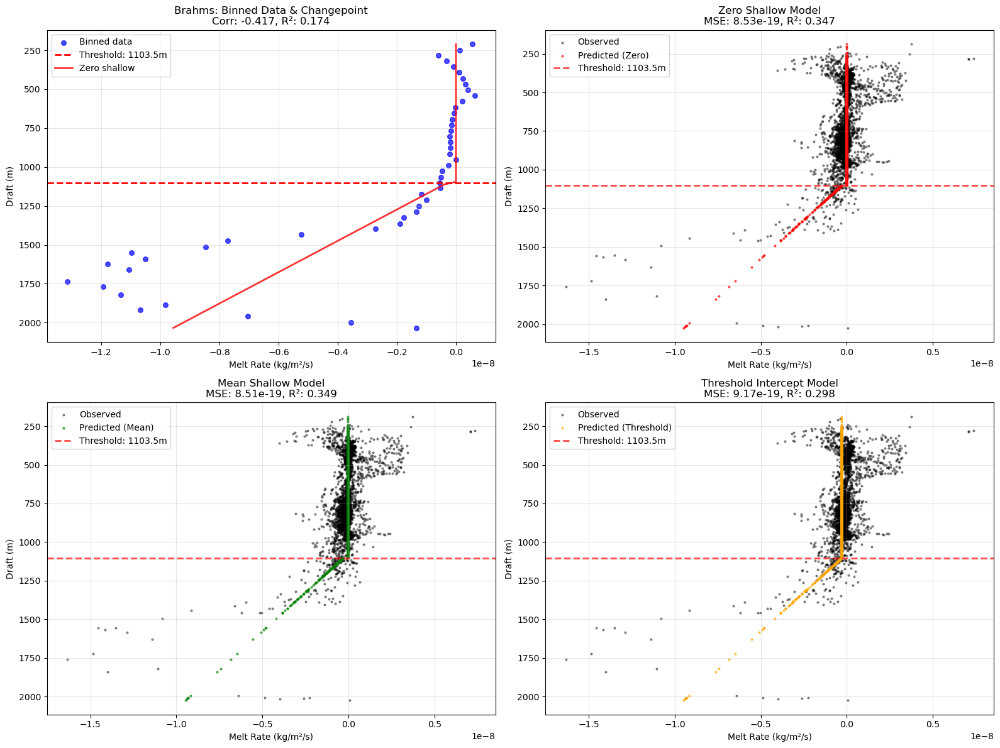

Processing Brunt_Stancomb...
Skipping Brunt_Stancomb: relationship too noisy or weak (corr=-0.121, R²=0.015)
Processing Campbell...
Skipping Campbell: relationship too noisy or weak (corr=-0.151, R²=0.023)
Processing Cheetham...
Skipping Cheetham: relationship too noisy or weak (corr=-0.312, R²=0.097)
Processing Conger_Glenzer...
Skipping Conger_Glenzer: relationship too noisy or weak (corr=0.037, R²=0.001)
Processing Cook...
Skipping Cook: relationship too noisy or weak (corr=-0.310, R²=0.096)
Processing Cosgrove...


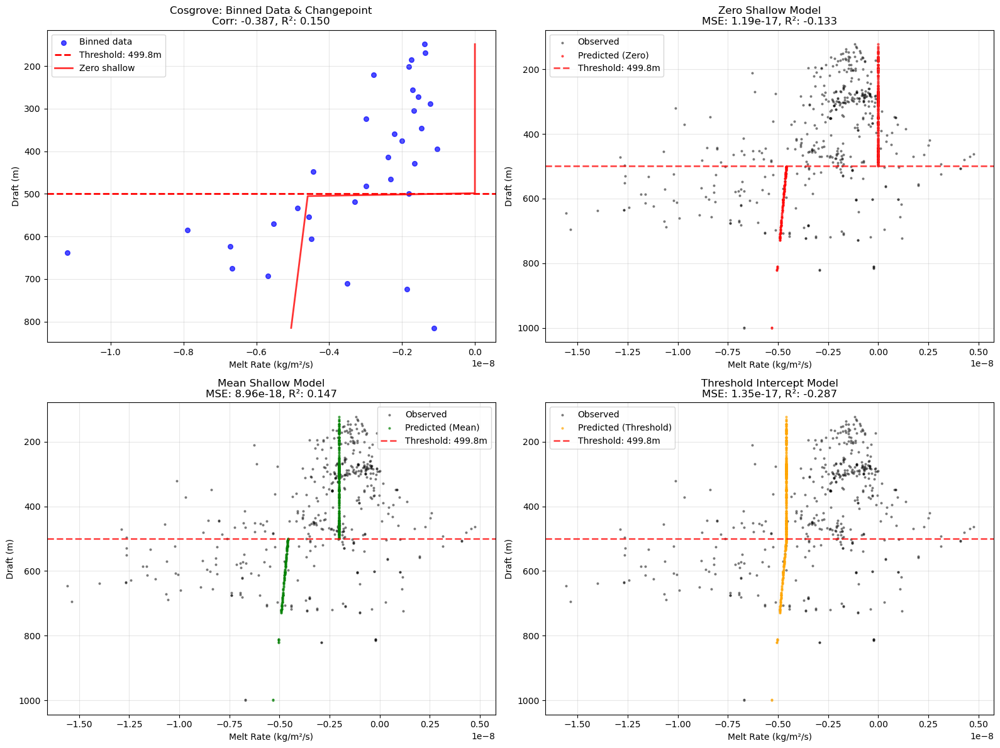

Processing Crosson...


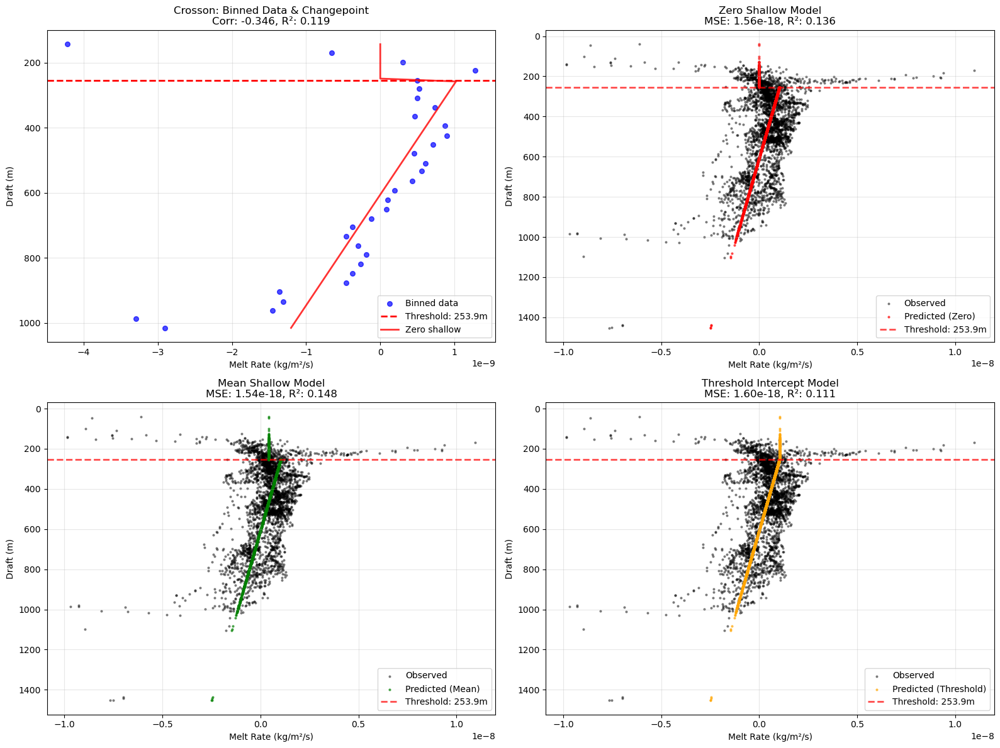

Processing Dennistoun...


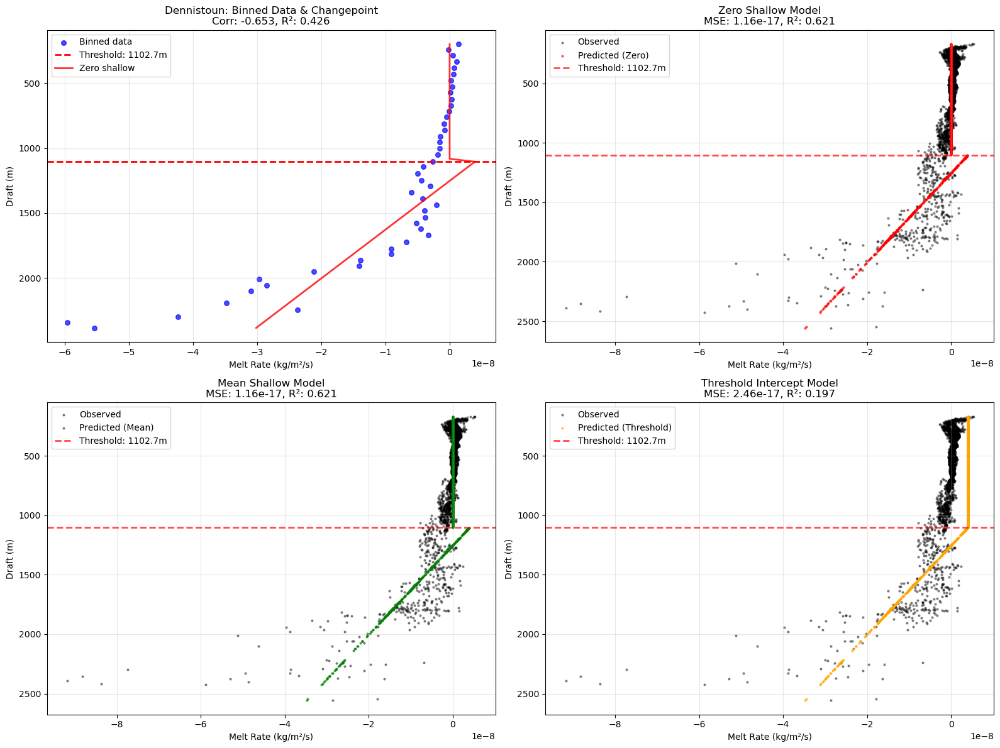

Processing Dibble...


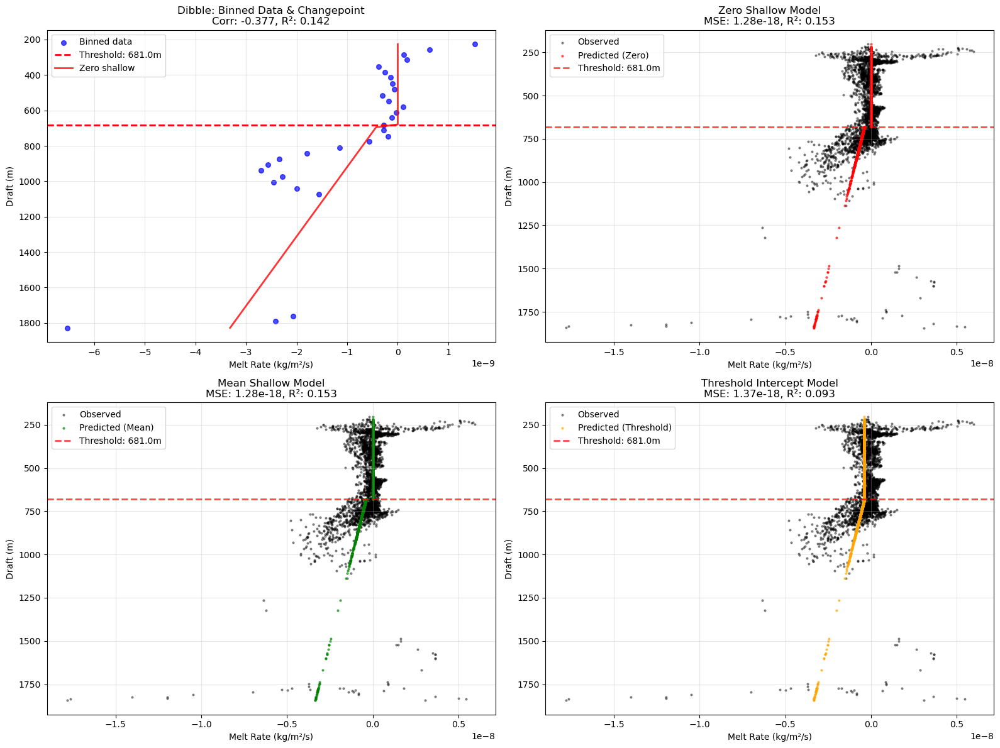

Processing Dotson...
Skipping Dotson: relationship too noisy or weak (corr=-0.100, R²=0.010)
Processing Drygalski...


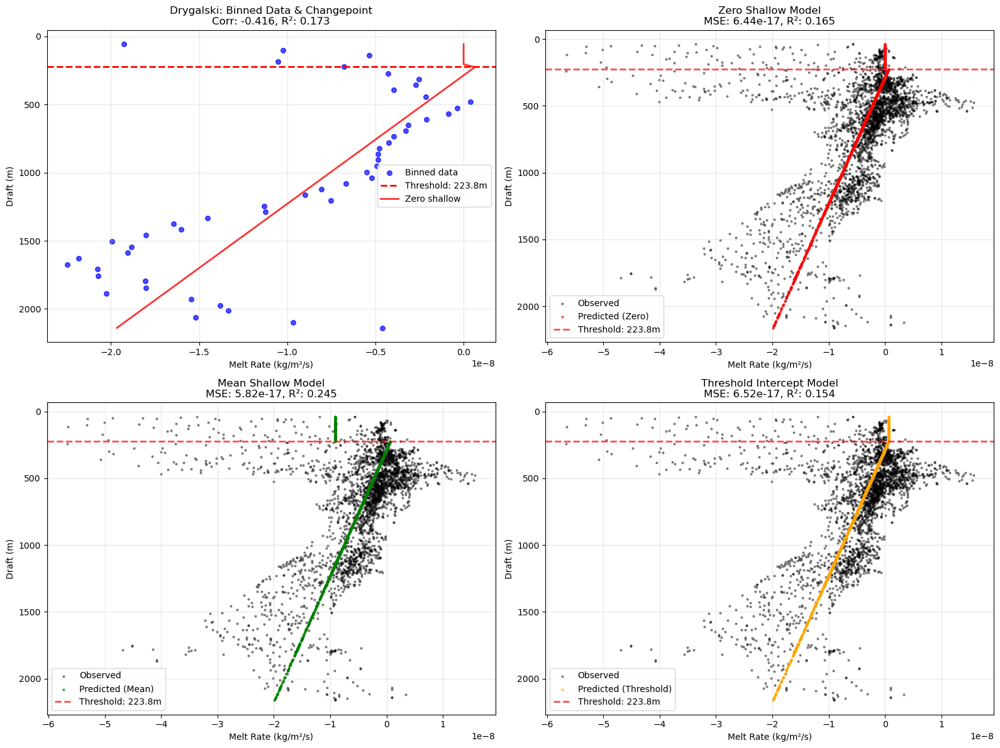

Processing Edward_VIII...
Skipping Edward_VIII: relationship too noisy or weak (corr=0.014, R²=0.000)
Processing Ekstrom...


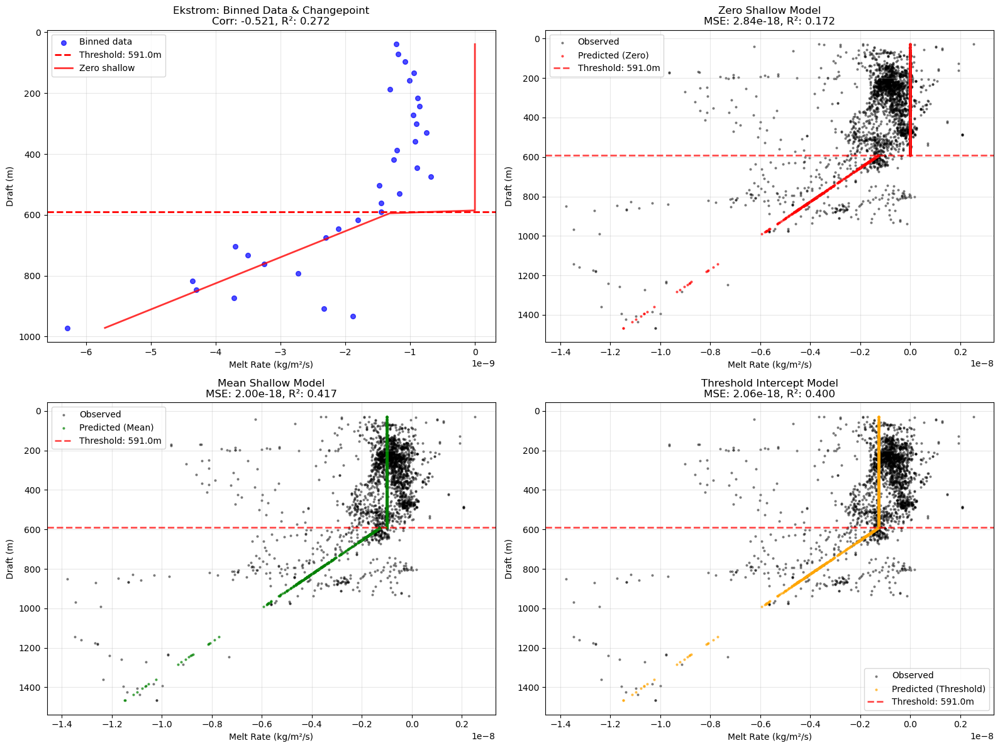

Processing Ferrigno...
Skipping Ferrigno: relationship too noisy or weak (corr=-0.184, R²=0.034)
Processing Filchner...
Skipping Filchner: relationship too noisy or weak (corr=-0.120, R²=0.014)
Processing Fimbul...
Skipping Fimbul: relationship too noisy or weak (corr=0.139, R²=0.019)
Processing Fitzgerald...
Skipping Fitzgerald: relationship too noisy or weak (corr=-0.112, R²=0.013)
Processing Frost...


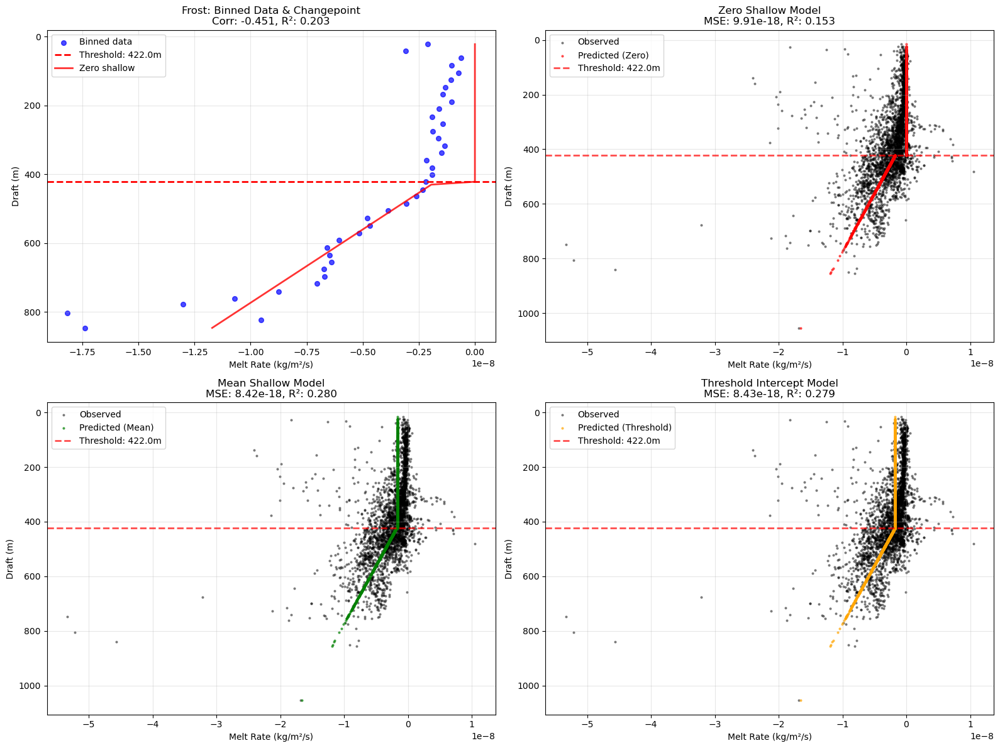

Processing GeikieInlet...
Skipping GeikieInlet: relationship too noisy or weak (corr=-0.165, R²=0.027)
Processing George_VI...


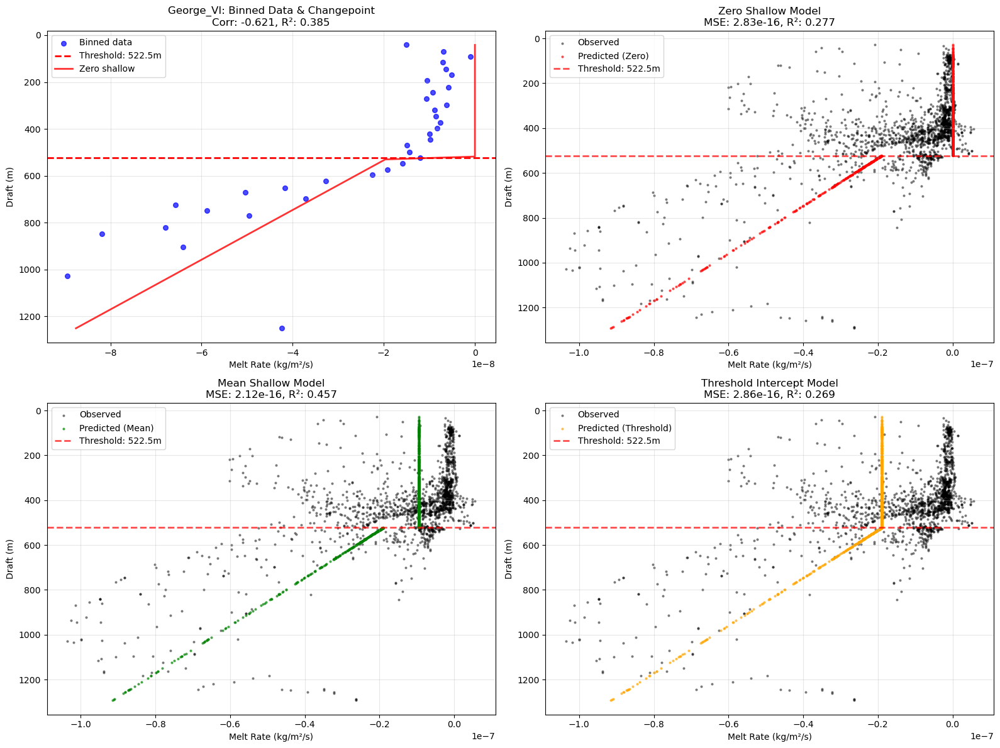

Processing Getz...


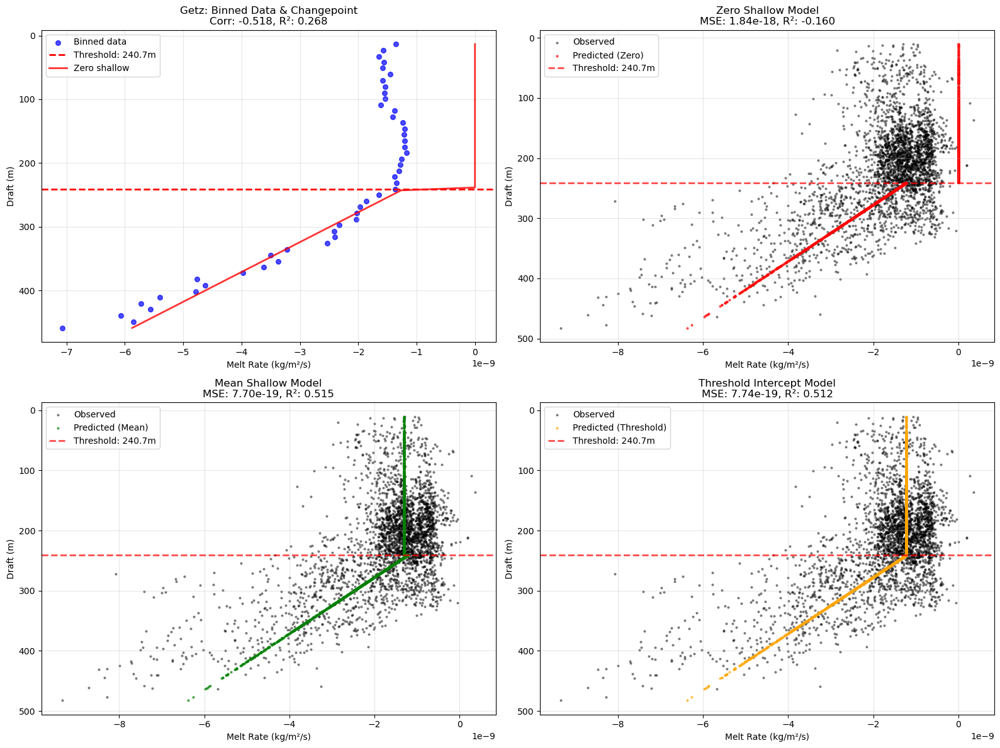

Processing Gillet...


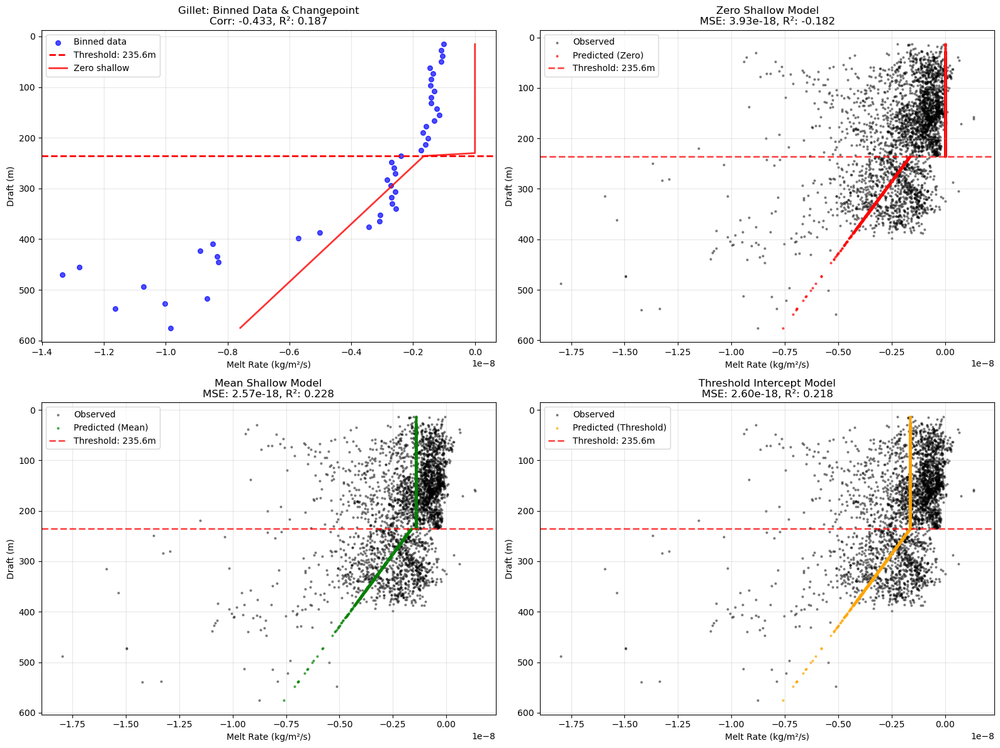

Processing Hamilton...
Error processing Hamilton: cannot unpack non-iterable float object
Processing Hannan...
Skipping Hannan: relationship too noisy or weak (corr=-0.032, R²=0.001)
Processing HarbordGlacier...
Skipping HarbordGlacier: relationship too noisy or weak (corr=-0.119, R²=0.014)
Processing Helen...


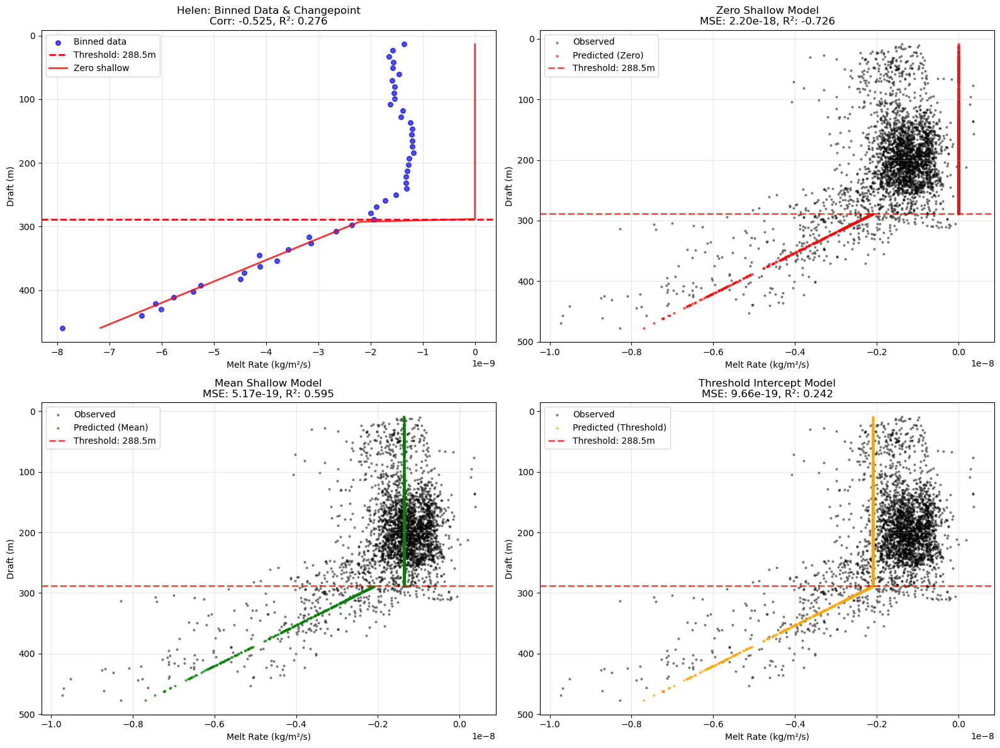

Processing Holmes...


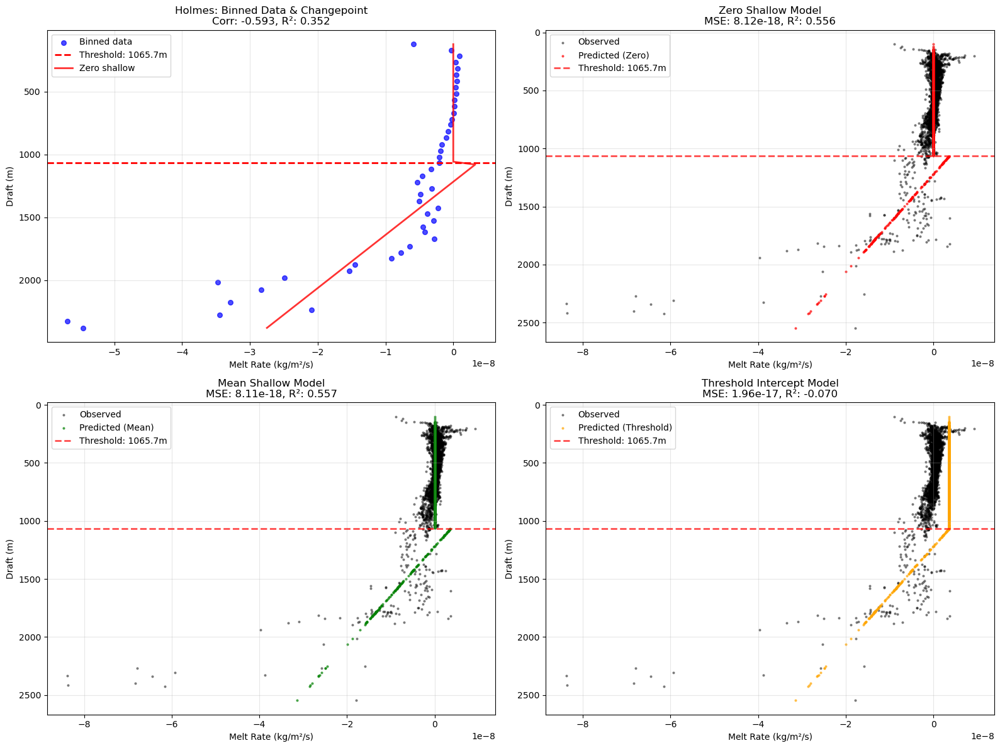

Processing HolmesWest...
Skipping HolmesWest: relationship too noisy or weak (corr=0.249, R²=0.062)
Processing Hull...
Skipping Hull: relationship too noisy or weak (corr=-0.035, R²=0.001)
Processing Jelbart...


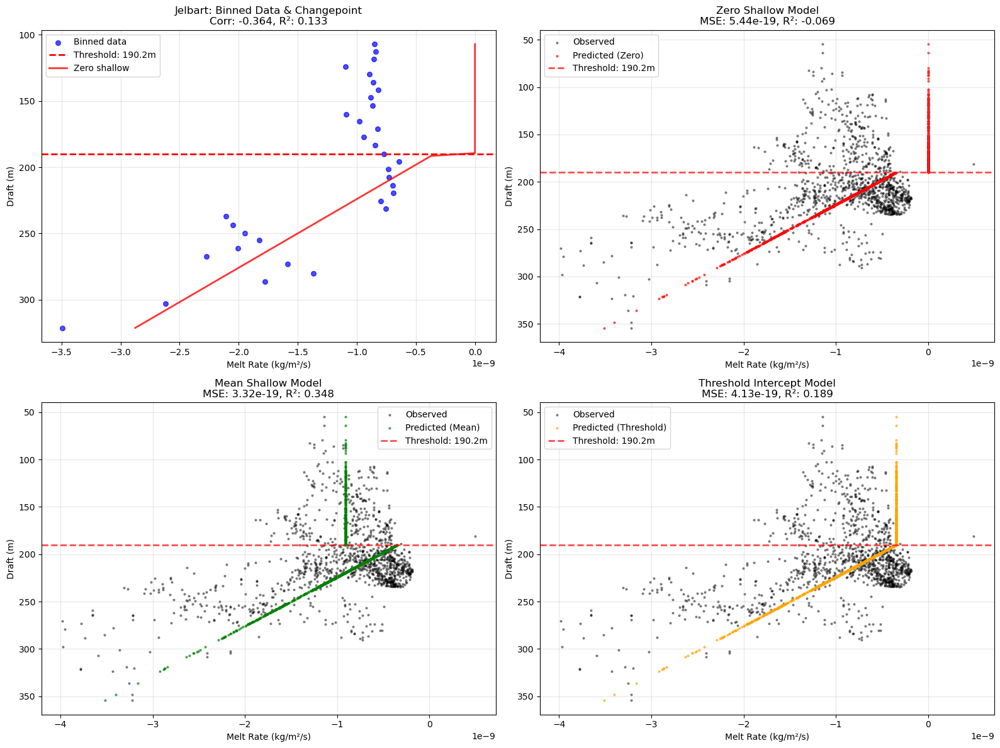

Processing Land...
Skipping Land: relationship too noisy or weak (corr=-0.246, R²=0.061)
Processing Larsen_B...
Skipping Larsen_B: relationship too noisy or weak (corr=-0.016, R²=0.000)
Processing Larsen_C...
Skipping Larsen_C: relationship too noisy or weak (corr=-0.154, R²=0.024)
Processing Larsen_D...
Skipping Larsen_D: relationship too noisy or weak (corr=-0.097, R²=0.009)
Processing Larsen_E...
Skipping Larsen_E: relationship too noisy or weak (corr=0.000, R²=0.000)
Processing Larsen_F...
Skipping Larsen_F: relationship too noisy or weak (corr=0.000, R²=0.000)
Processing Larsen_G...


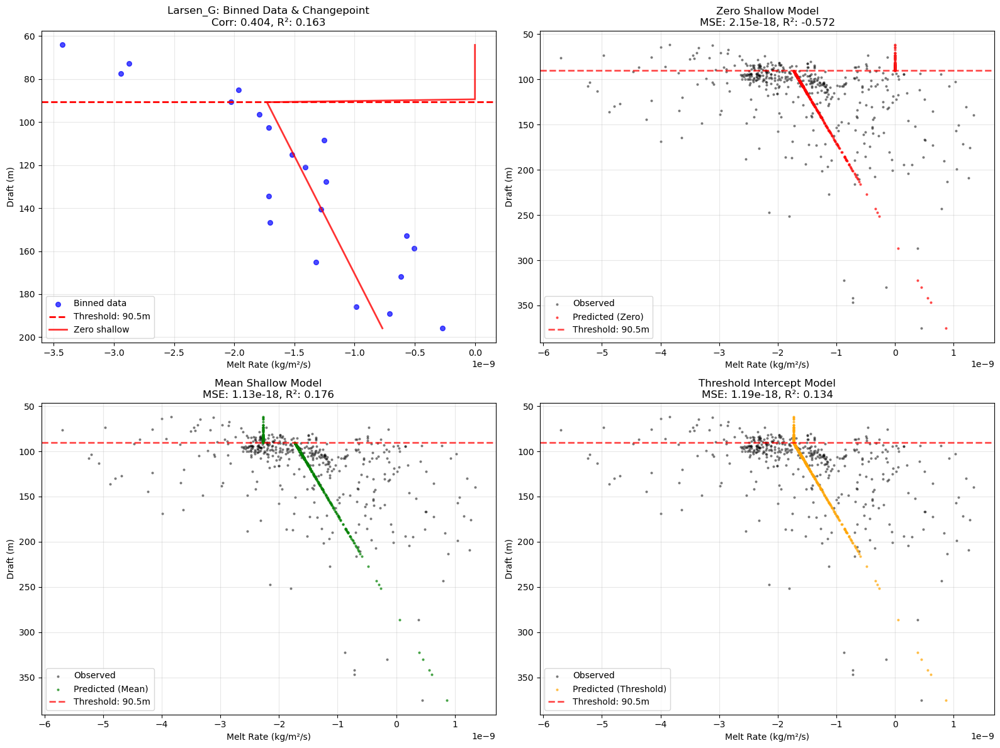

Processing Lazarev...
Skipping Lazarev: relationship too noisy or weak (corr=0.148, R²=0.022)
Processing Lillie...


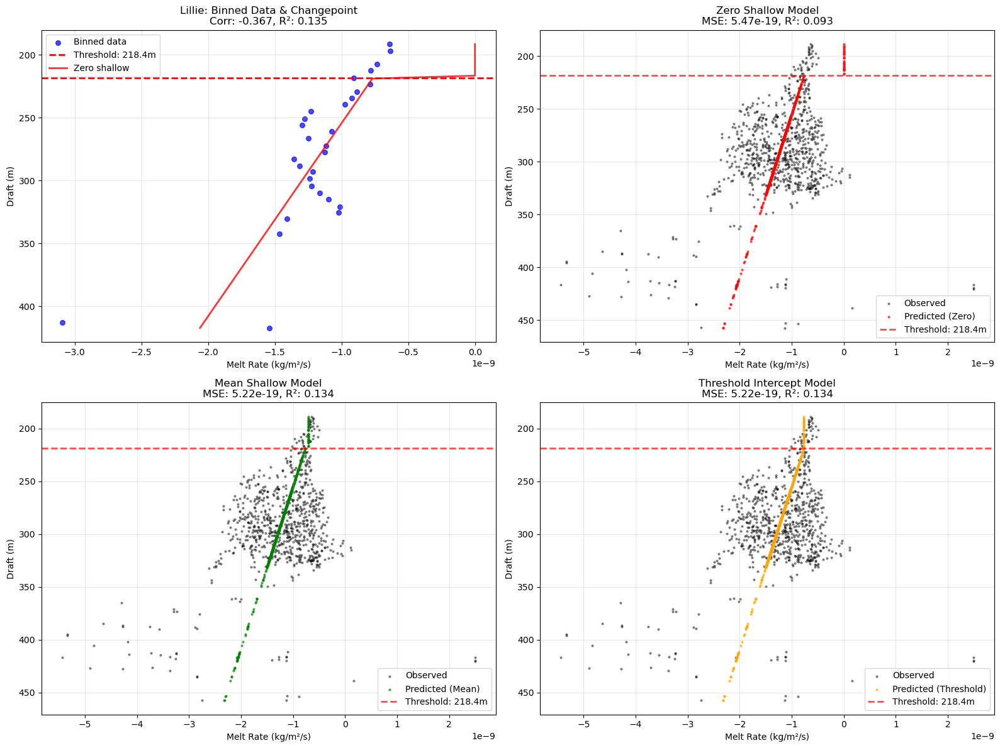

Processing Mariner...


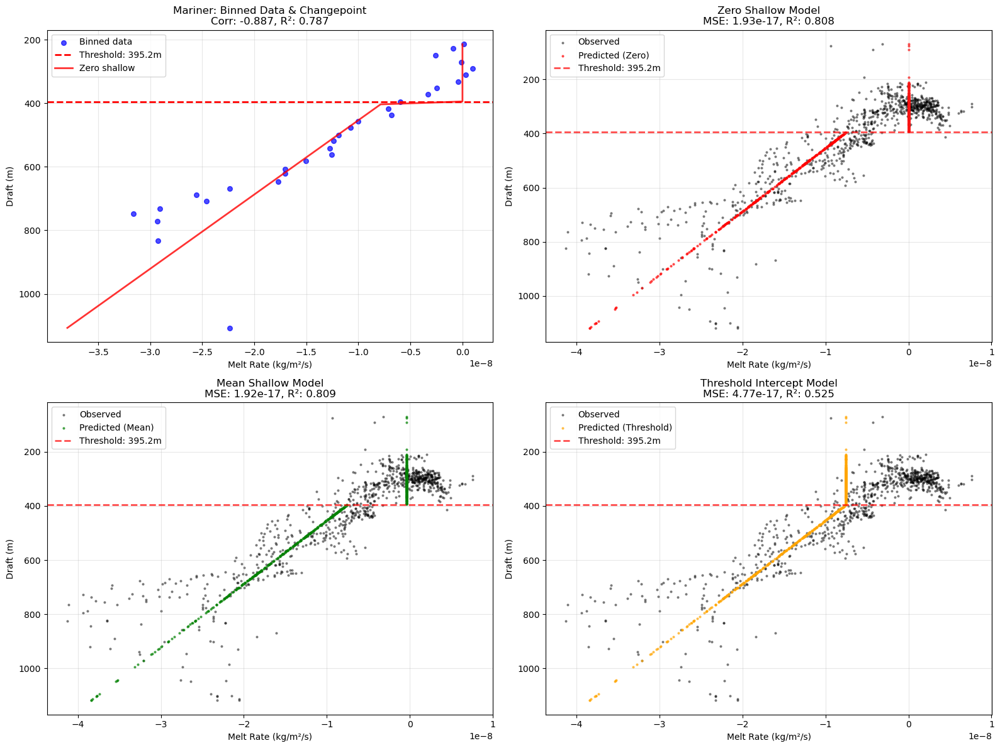

Processing Matusevitch...
Skipping Matusevitch: relationship too noisy or weak (corr=0.000, R²=0.000)
Processing Mendelssohn...


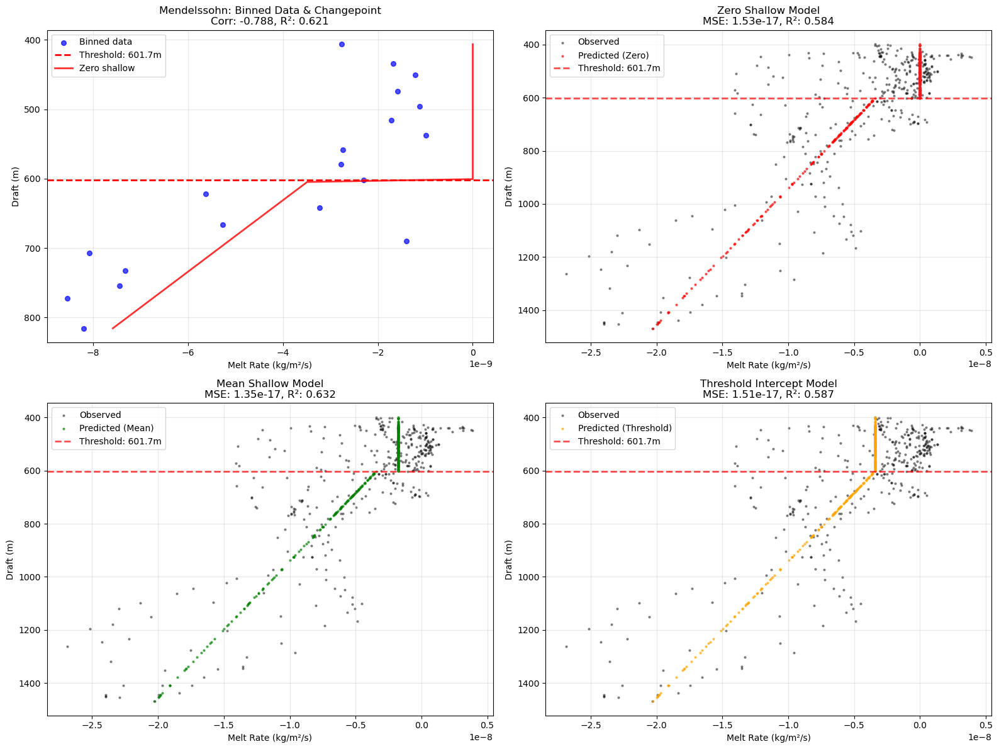

Processing Mertz...


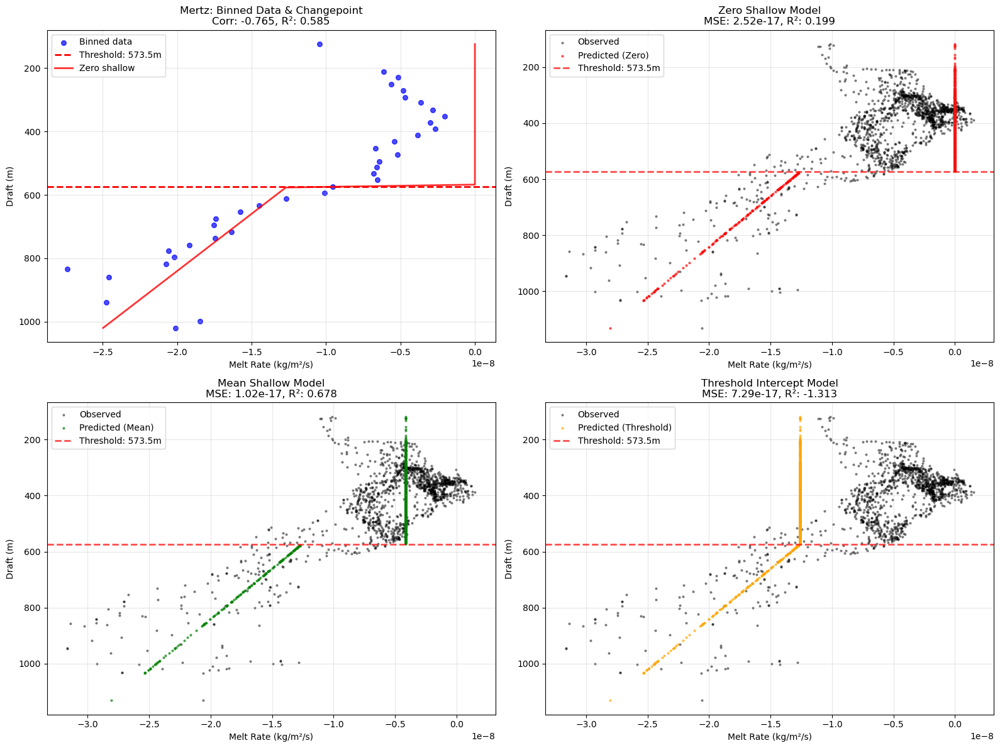

Processing Moscow_University...
Skipping Moscow_University: relationship too noisy or weak (corr=-0.112, R²=0.013)
Processing Moubray...
Error processing Moubray: cannot unpack non-iterable float object
Processing Mulebreen...


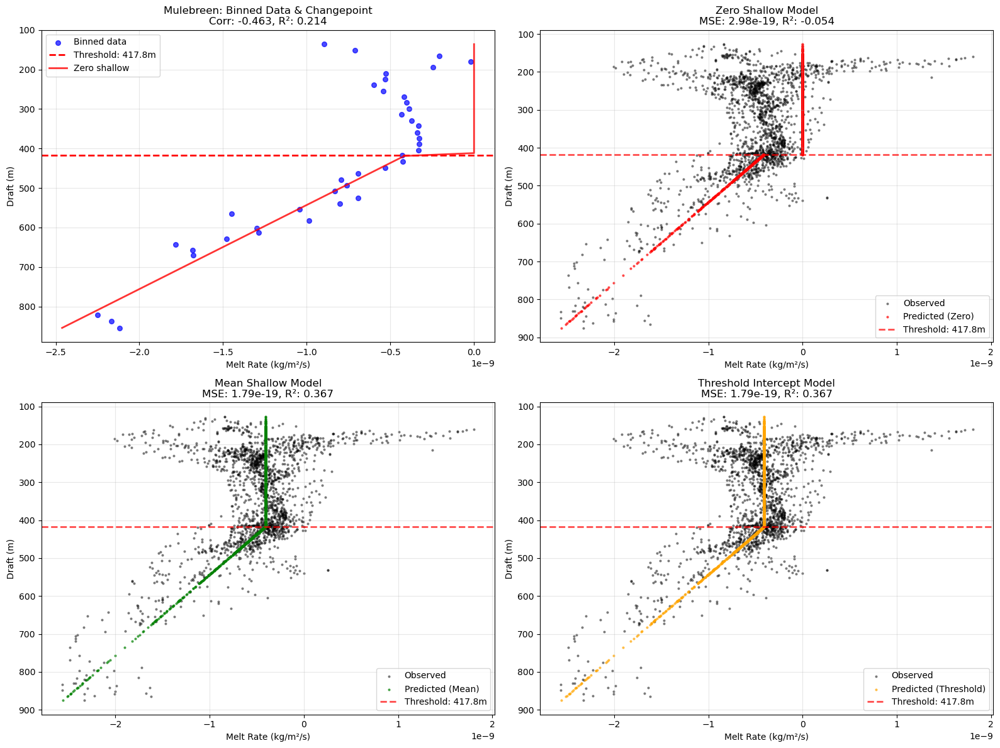

Processing Myers...
Skipping Myers: relationship too noisy or weak (corr=0.356, R²=0.127)
Processing Nansen...


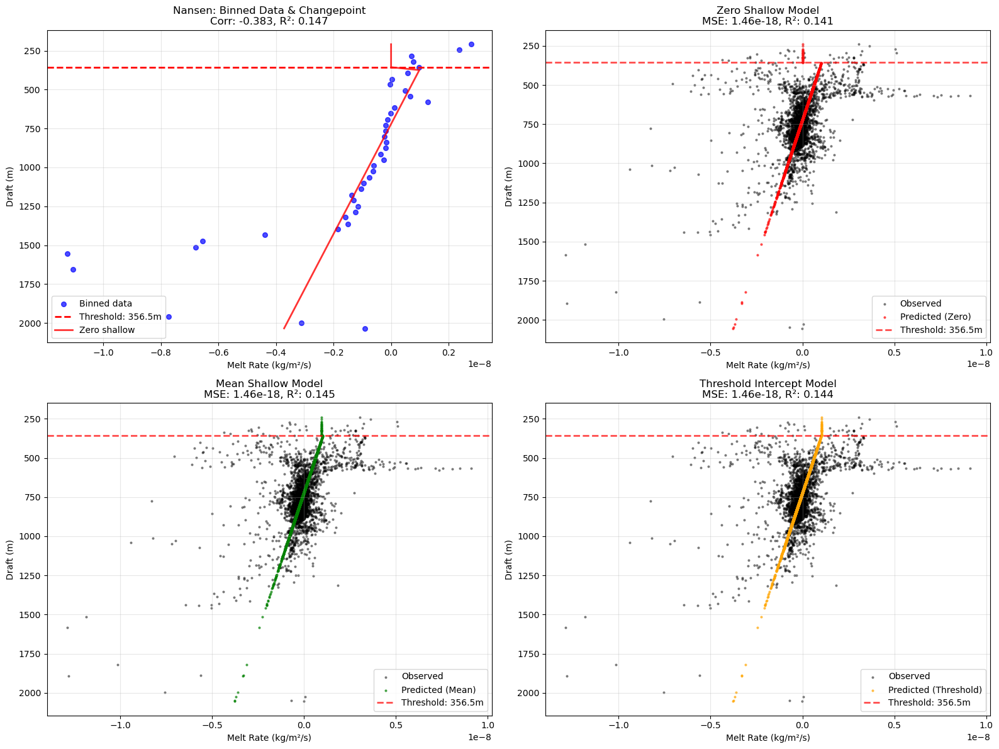

Processing Nickerson...


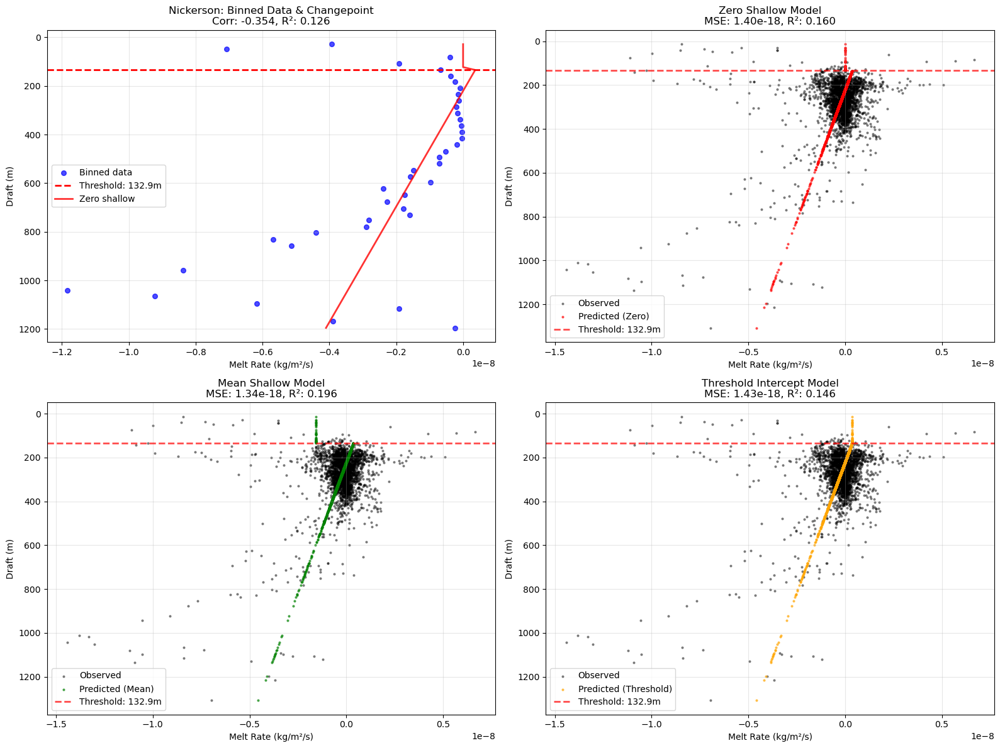

Processing Ninnis...
Error processing Ninnis: cannot unpack non-iterable float object
Processing Nivl...
Error processing Nivl: cannot unpack non-iterable float object
Processing Noll...
Error processing Noll: cannot unpack non-iterable float object
Processing Nordenskjold...
Skipping Nordenskjold: relationship too noisy or weak (corr=-0.266, R²=0.071)
Processing Pine_Island...
Skipping Pine_Island: relationship too noisy or weak (corr=-0.265, R²=0.070)
Processing PourquoiPas...
Error processing PourquoiPas: cannot unpack non-iterable float object
Processing Prince_Harald...
Error processing Prince_Harald: cannot unpack non-iterable float object
Processing Publications...
Skipping Publications: relationship too noisy or weak (corr=0.073, R²=0.005)
Processing Quar...
Skipping Quar: relationship too noisy or weak (corr=0.000, R²=0.000)
Processing Rayner_Thyer...
Skipping Rayner_Thyer: relationship too noisy or weak (corr=0.080, R²=0.006)
Processing Rennick...
Skipping Rennick: relationsh

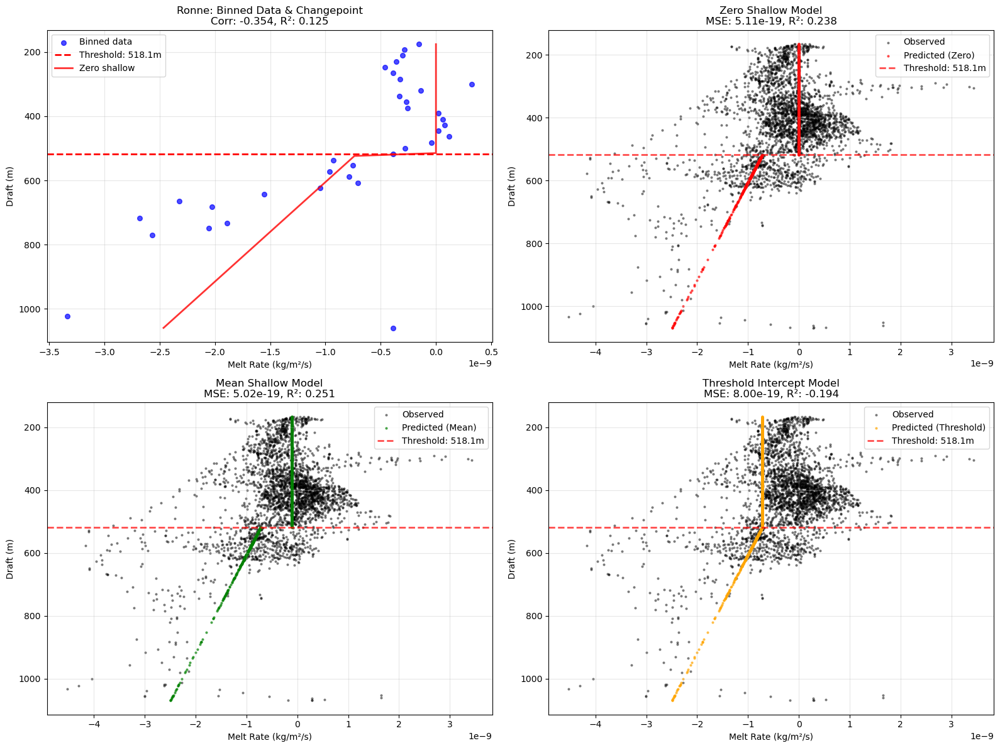

Processing Western_Ross...


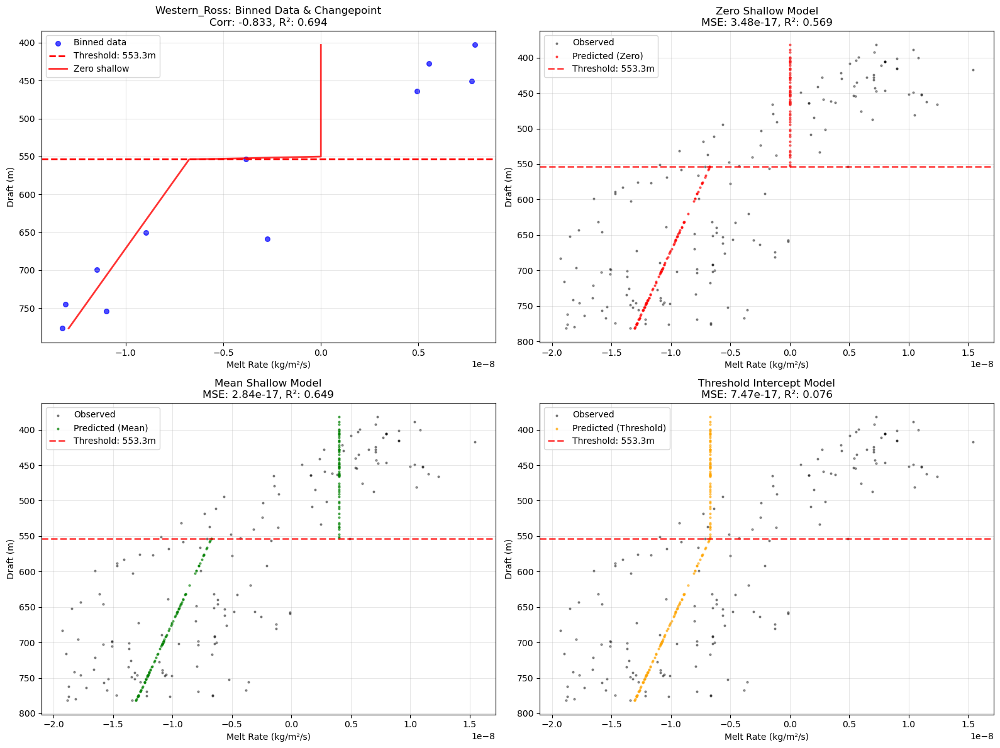

Processing Eastern_Ross...


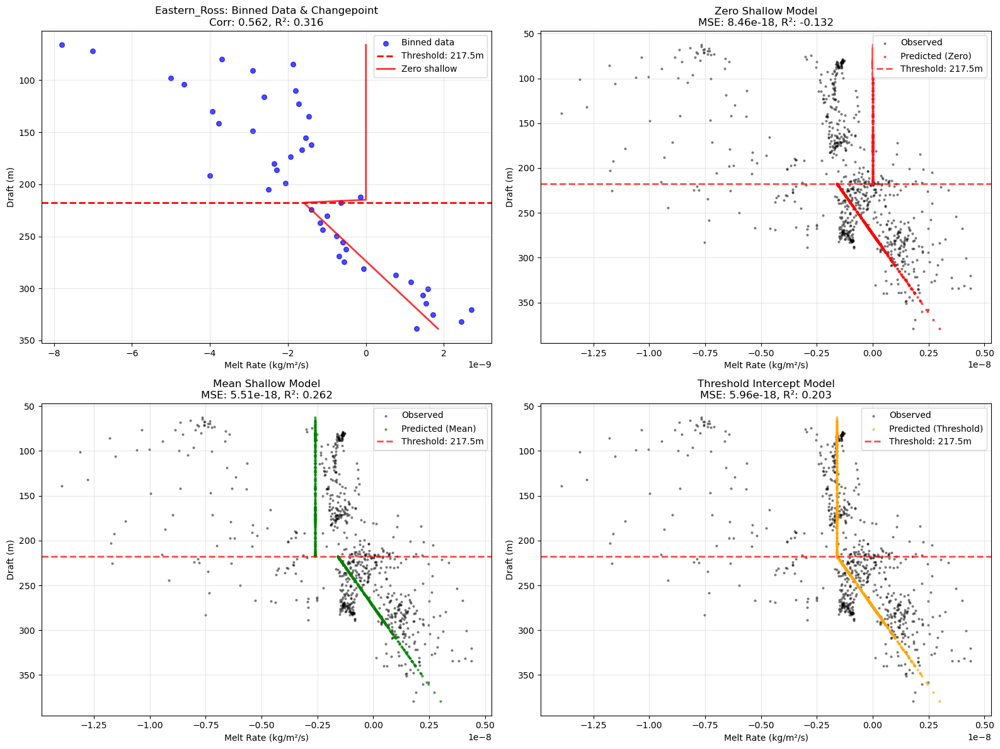

Processing Shackleton...
Skipping Shackleton: relationship too noisy or weak (corr=-0.123, R²=0.015)
Processing Shirase...
Skipping Shirase: relationship too noisy or weak (corr=-0.134, R²=0.018)
Processing Slava...
Skipping Slava: relationship too noisy or weak (corr=-0.199, R²=0.040)
Processing SmithInlet...
Skipping SmithInlet: relationship too noisy or weak (corr=-0.068, R²=0.005)
Processing Stange...
Error processing Stange: cannot unpack non-iterable float object
Processing Sulzberger...
Skipping Sulzberger: relationship too noisy or weak (corr=-0.043, R²=0.002)
Processing Suvorov...
Skipping Suvorov: relationship too noisy or weak (corr=0.238, R²=0.057)
Processing Swinburne...


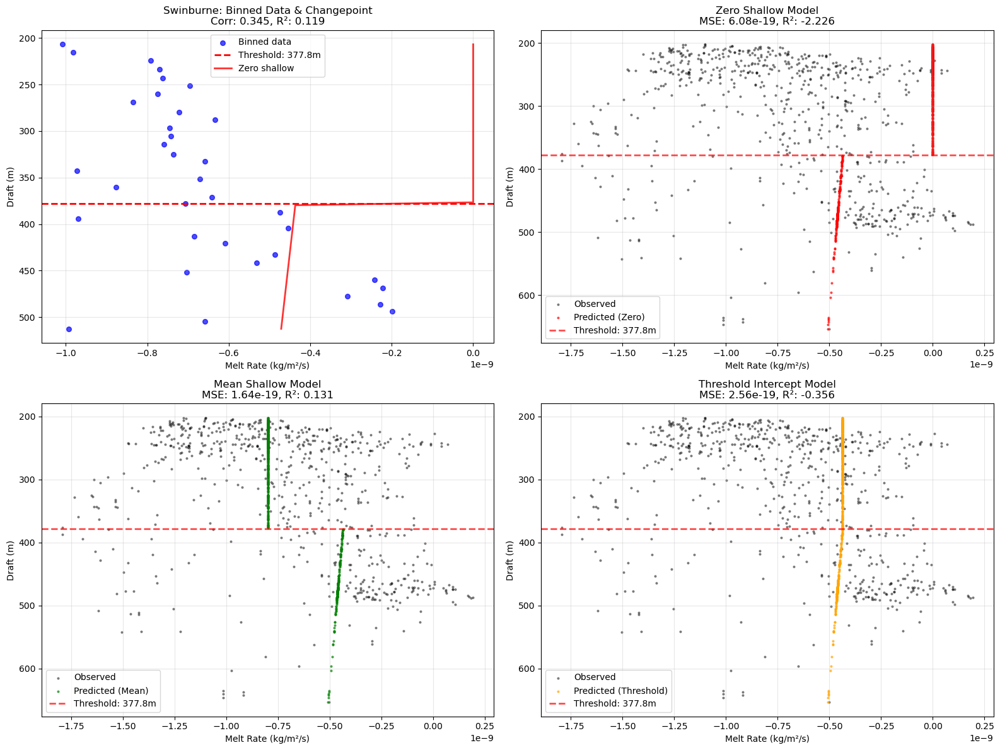

Processing Thwaites...
Skipping Thwaites: relationship too noisy or weak (corr=0.044, R²=0.002)
Processing Tinker...
Error processing Tinker: cannot unpack non-iterable float object
Processing Totten...
Skipping Totten: relationship too noisy or weak (corr=0.116, R²=0.014)
Processing Tracy_Tremenchus...


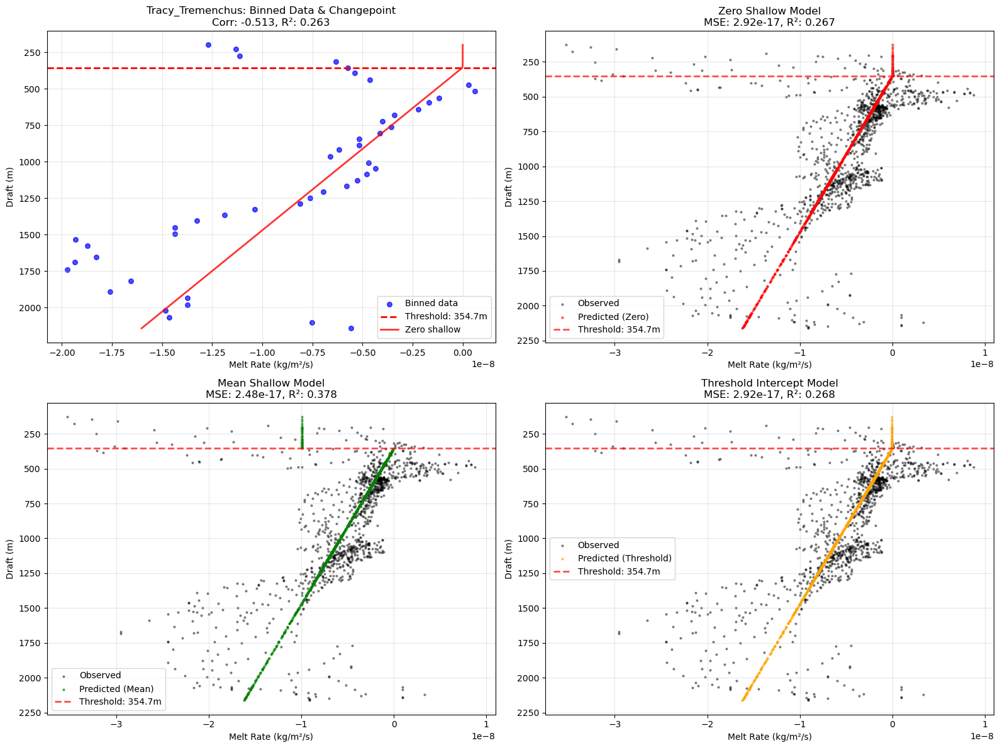

Processing Tucker...
Skipping Tucker: relationship too noisy or weak (corr=0.283, R²=0.080)
Processing Underwood...
Skipping Underwood: relationship too noisy or weak (corr=-0.100, R²=0.010)
Processing Utsikkar...
Skipping Utsikkar: relationship too noisy or weak (corr=0.000, R²=0.000)
Processing Venable...


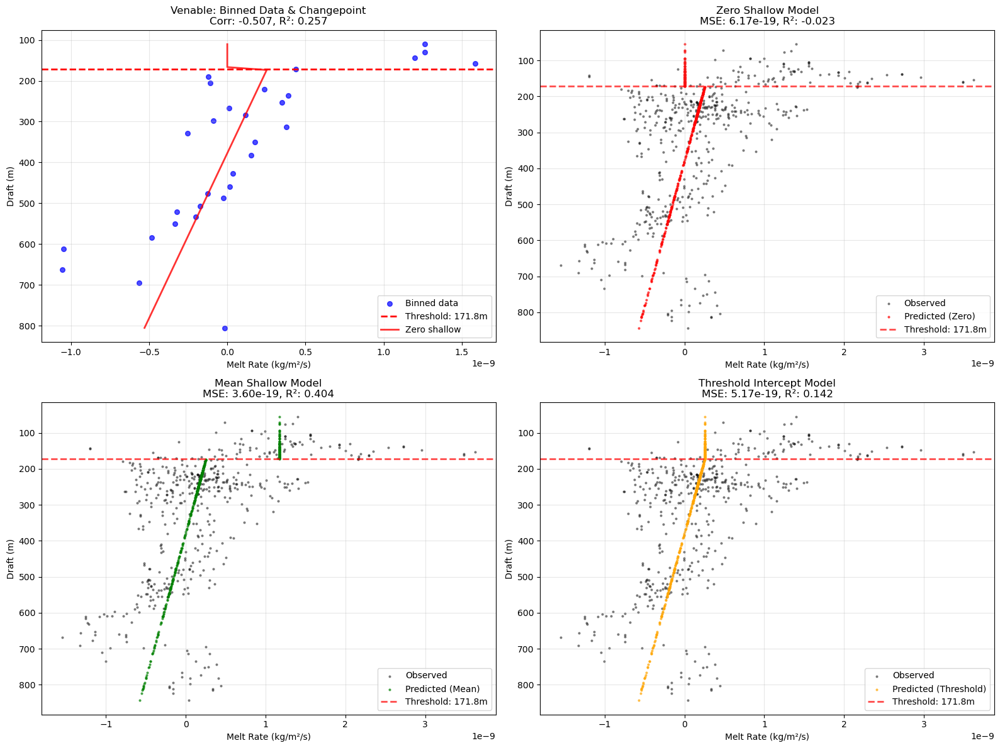

Processing Verdi...


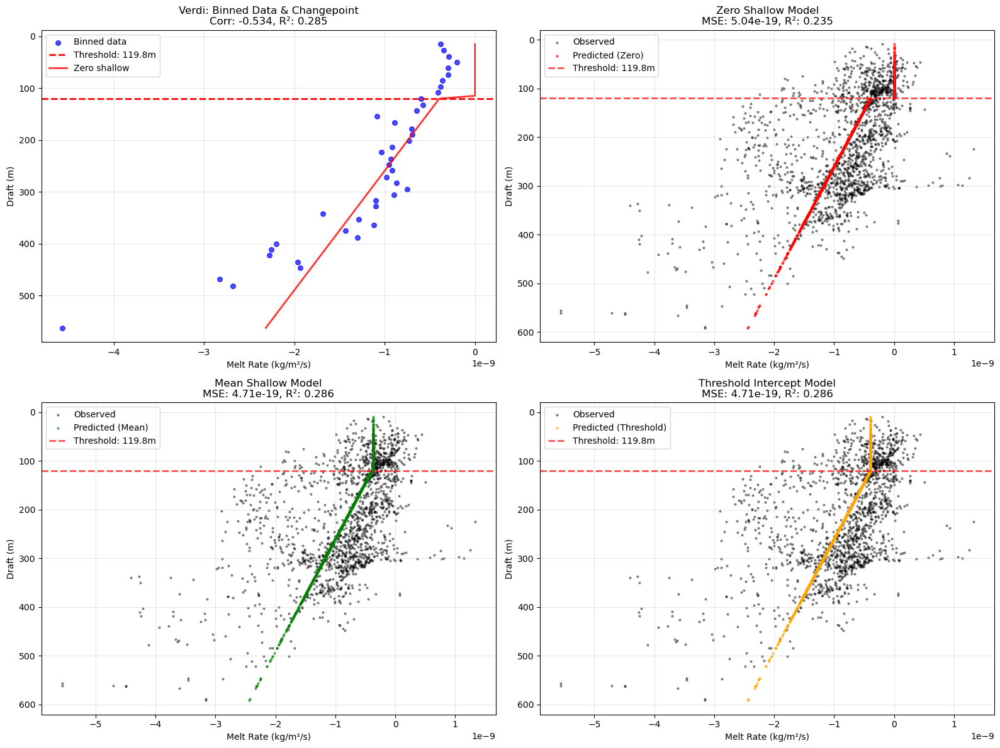

Processing Vigrid...
Skipping Vigrid: relationship too noisy or weak (corr=0.007, R²=0.000)
Processing Vincennes...


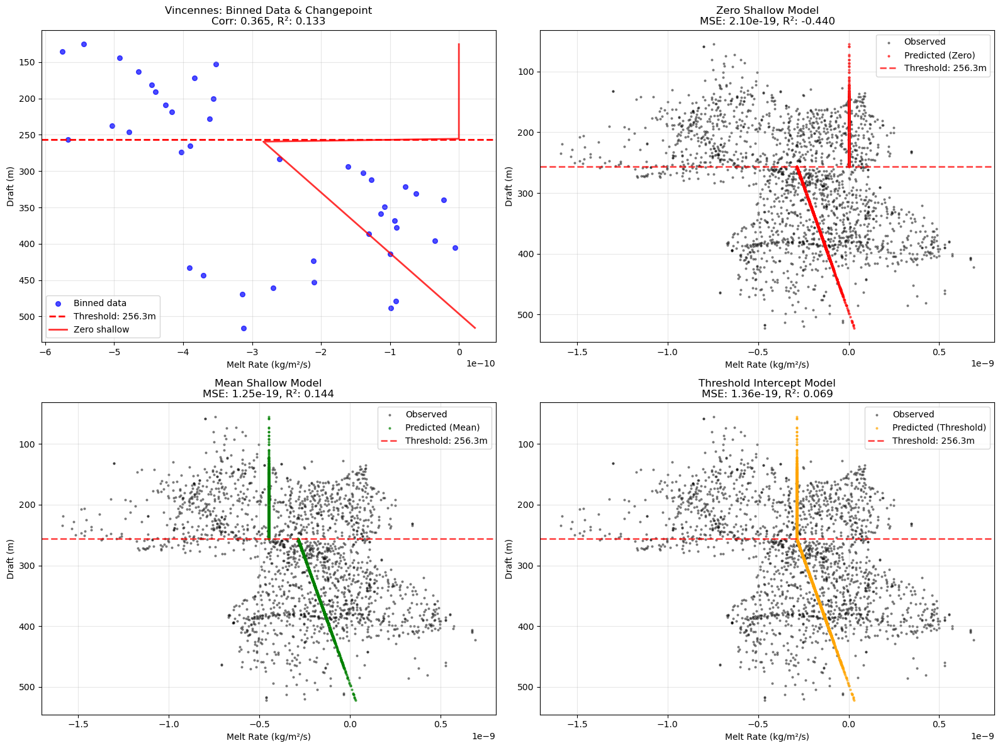

Processing Voyeykov...
Error processing Voyeykov: cannot unpack non-iterable float object
Processing West...
Skipping West: relationship too noisy or weak (corr=-0.100, R²=0.010)
Processing Wilkins...


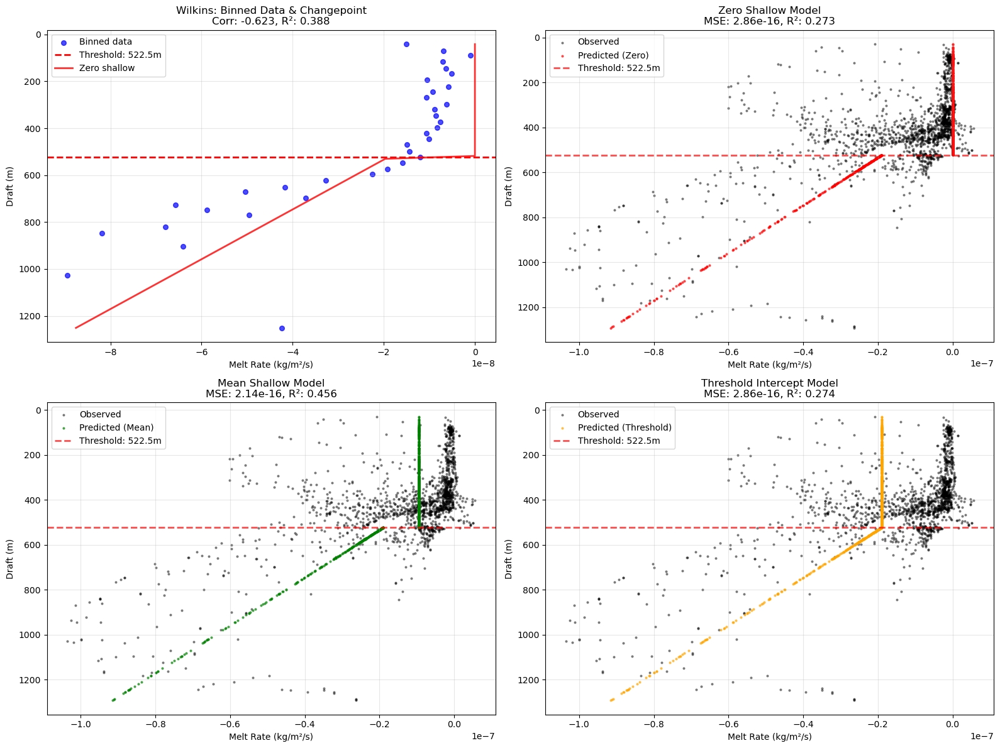

Processing Wilma_Robert_Downer...
Error processing Wilma_Robert_Downer: cannot unpack non-iterable float object
Processing Withrow...


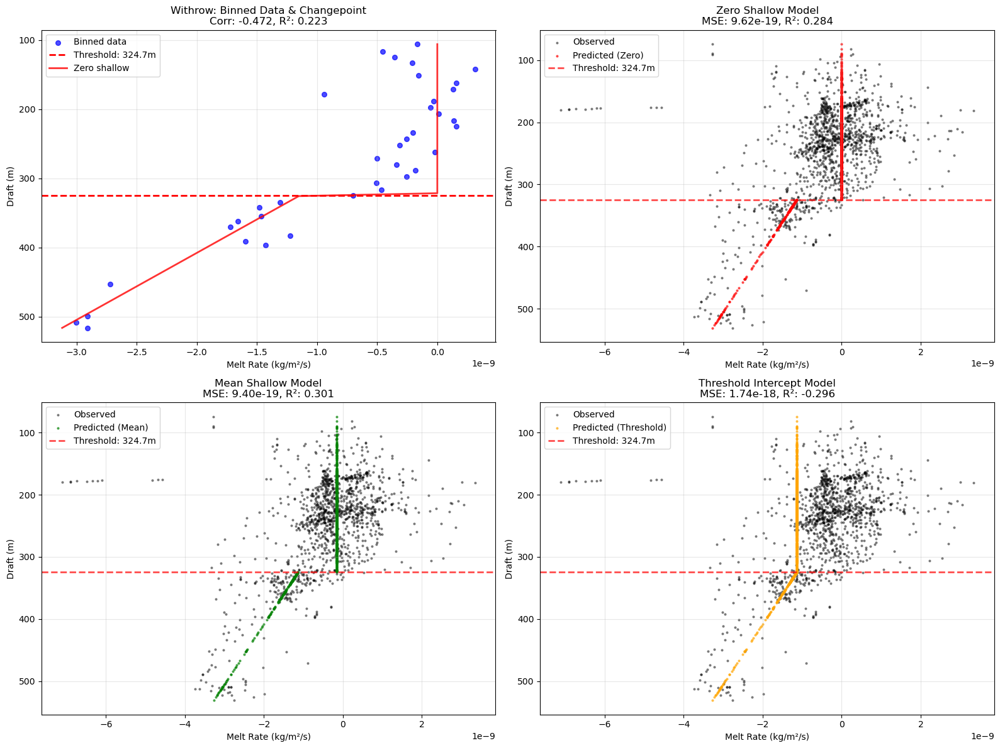

Processing Wordie...
Skipping Wordie: relationship too noisy or weak (corr=0.152, R²=0.023)
Processing Wylde...
Skipping Wylde: relationship too noisy or weak (corr=0.122, R²=0.015)
Processing Zubchatyy...


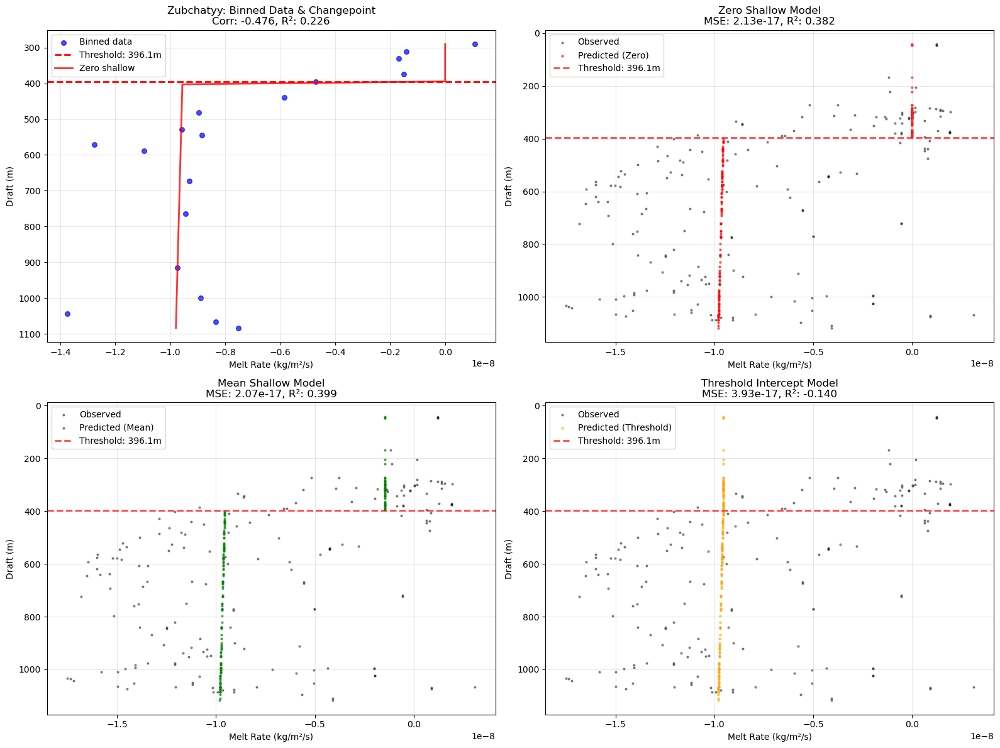

Comprehensive Summary of all model variants:
         shelf                model  threshold_draft  slope  shallow_value  \
0        Abbot         zero_shallow              NaN    0.0            0.0   
1        Abbot         mean_shallow              NaN    0.0            0.0   
2        Abbot    intercept_shallow              NaN    0.0            0.0   
3        Amery         zero_shallow              NaN    0.0            0.0   
4        Amery         mean_shallow              NaN    0.0            0.0   
..         ...                  ...              ...    ...            ...   
253      Wylde         mean_shallow              NaN    0.0            0.0   
254      Wylde    intercept_shallow              NaN    0.0            0.0   
255  Zubchatyy         zero_shallow         396.0582   -0.0            0.0   
256  Zubchatyy         mean_shallow         396.0582   -0.0           -0.0   
257  Zubchatyy  threshold_intercept         396.0582   -0.0            0.0   

     n_points  pct

In [4]:
import ruptures as rpt
from scipy.stats import pearsonr

def calculate_draft_threshold_and_predict_ruptures_comprehensive(obs23_melt_tm, obs23_draft_tm, icems, clip_data, 
                                                               n_bins=50, min_points_per_bin=5, 
                                                               ruptures_method='pelt', ruptures_penalty=1.0,
                                                               plot_individual=True, save_plots=False, save_dir=None,
                                                               min_r2_threshold=0.1, min_correlation=0.3,
                                                               noisy_fallback='zero'):  # 'zero' or 'mean'
    """
    Calculate draft threshold using ruptures changepoint detection and apply multiple piecewise linear models.
    
    Parameters:
    -----------
    obs23_melt_tm : xarray.DataArray
        Time-mean melt rate data
    obs23_draft_tm : xarray.DataArray  
        Time-mean draft data
    icems : geopandas.GeoDataFrame
        Ice shelf geometries
    clip_data : function
        Function to clip data to ice shelf boundaries
    n_bins : int
        Number of bins for draft binning (default: 50)
    min_points_per_bin : int
        Minimum points required per bin (default: 5)
    ruptures_method : str
        Ruptures method: 'pelt', 'binseg', or 'window' (default: 'pelt')
    ruptures_penalty : float
        Penalty parameter for ruptures (default: 1.0)
    plot_individual : bool
        Whether to plot individual ice shelf results (default: True)
    save_plots : bool
        Whether to save plots (default: False)
    save_dir : str
        Directory to save plots (default: None)
    min_r2_threshold : float
        Minimum R² for considering the relationship meaningful (default: 0.1)
    min_correlation : float
        Minimum correlation for considering the relationship meaningful (default: 0.3)
    noisy_fallback : str
        For noisy data: 'zero' or 'mean' (default: 'zero')
    
    Returns:
    --------
    results_dict : dict
        Dictionary containing results for each ice shelf
    """
    
    def assess_data_quality(draft_vals, melt_vals, min_r2=0.1, min_corr=0.3):
        """Assess if the draft-melt relationship is meaningful or too noisy."""
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        if np.sum(mask) < 20:
            return False, 0.0, 0.0
        
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Calculate correlation
        try:
            correlation, p_value = pearsonr(draft_clean, melt_clean)
        except:
            correlation, p_value = 0.0, 1.0
        
        # Calculate R² from simple linear regression
        try:
            reg = LinearRegression()
            reg.fit(draft_clean.reshape(-1, 1), melt_clean)
            r2 = reg.score(draft_clean.reshape(-1, 1), melt_clean)
        except:
            r2 = 0.0
        
        # Check if relationship is meaningful
        is_meaningful = (abs(correlation) >= min_corr) and (r2 >= min_r2) and (p_value < 0.05)
        
        return is_meaningful, correlation, r2
    
    def find_changepoint_threshold_ruptures(draft_vals, melt_vals, n_bins=50, min_points_per_bin=5, 
                                           method='pelt', penalty=1.0):
        """Find draft threshold using ruptures changepoint detection."""
        # Remove NaN values
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        if np.sum(mask) < 20:
            return np.nan, np.nan, np.nan, np.nan
        
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Sort by draft
        sort_idx = np.argsort(draft_clean)
        draft_sorted = draft_clean[sort_idx]
        melt_sorted = melt_clean[sort_idx]
        
        # Bin the data
        bins = np.linspace(draft_sorted.min(), draft_sorted.max(), n_bins + 1)
        bin_indices = np.digitize(draft_sorted, bins) - 1
        
        # Calculate binned statistics
        binned_melt = []
        binned_draft = []
        
        for i in range(n_bins):
            bin_mask = bin_indices == i
            if np.sum(bin_mask) >= min_points_per_bin:
                binned_melt.append(np.mean(melt_sorted[bin_mask]))
                binned_draft.append(np.mean(draft_sorted[bin_mask]))
        
        if len(binned_melt) < 10:
            return np.nan, np.nan, np.nan, np.nan
        
        binned_melt = np.array(binned_melt)
        binned_draft = np.array(binned_draft)
        
        # Use ruptures for changepoint detection
        try:
            if method == 'pelt':
                algo = rpt.Pelt(model="rbf", min_size=2).fit(binned_melt.reshape(-1, 1))
                result = algo.predict(pen=penalty)
            elif method == 'binseg':
                algo = rpt.Binseg(model="l2", min_size=2).fit(binned_melt.reshape(-1, 1))
                result = algo.predict(n_bkps=1)
            elif method == 'window':
                algo = rpt.Window(width=5, model="l2").fit(binned_melt.reshape(-1, 1))
                result = algo.predict(n_bkps=1)
            else:
                raise ValueError(f"Unknown method: {method}")
            
            if len(result) > 1:  # ruptures returns end points, so take first changepoint
                cp_idx = result[0] - 1  # Convert to 0-based index
                if 0 <= cp_idx < len(binned_draft):
                    threshold_draft = binned_draft[cp_idx]
                else:
                    threshold_draft = np.median(binned_draft)
            else:
                threshold_draft = np.median(binned_draft)
                
        except Exception as e:
            print(f"ruptures failed: {e}, using median")
            threshold_draft = np.median(binned_draft)
        
        return threshold_draft, binned_draft, binned_melt, (draft_clean, melt_clean)
    
    def fit_piecewise_models(draft_vals, melt_vals, threshold):
        """Fit multiple piecewise linear models with different shallow behaviors."""
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Points deeper than threshold (for linear regression)
        deep_mask = draft_clean >= threshold
        shallow_mask = draft_clean < threshold
        
        # Calculate shallow statistics
        if np.sum(shallow_mask) >= 5:
            shallow_mean = np.mean(melt_clean[shallow_mask])
        else:
            shallow_mean = np.mean(melt_clean)  # Fallback to overall mean
        
        # Fit linear regression to deep points
        if np.sum(deep_mask) >= 5:
            X_deep = draft_clean[deep_mask].reshape(-1, 1)
            y_deep = melt_clean[deep_mask]
            
            reg = LinearRegression()
            reg.fit(X_deep, y_deep)
            slope = reg.coef_[0]
            deep_intercept = reg.intercept_
        else:
            # Not enough deep points, use all data
            X_all = draft_clean.reshape(-1, 1)
            y_all = melt_clean
            reg = LinearRegression()
            reg.fit(X_all, y_all)
            slope = reg.coef_[0]
            deep_intercept = reg.intercept_
            
        return slope, shallow_mean, deep_intercept
    
    def predict_piecewise_multiple(draft_vals, threshold, slope, shallow_mean, deep_intercept):
        """Predict melt using multiple piecewise models."""
        predictions = {}
        valid_mask = ~np.isnan(draft_vals)
        shallow_mask = valid_mask & (draft_vals < threshold)
        deep_mask = valid_mask & (draft_vals >= threshold)
        
        # Model 1: Zero shallow
        pred_zero = np.full_like(draft_vals, np.nan)
        pred_zero[shallow_mask] = 0.0
        pred_zero[deep_mask] = slope * draft_vals[deep_mask] + deep_intercept
        predictions['zero_shallow'] = pred_zero
        
        # Model 2: Mean shallow
        pred_mean = np.full_like(draft_vals, np.nan)
        pred_mean[shallow_mask] = shallow_mean
        pred_mean[deep_mask] = slope * draft_vals[deep_mask] + deep_intercept
        predictions['mean_shallow'] = pred_mean
        
        # Model 3: Threshold intercept (evaluate deep line at threshold)
        threshold_melt = slope * threshold + deep_intercept
        pred_threshold = np.full_like(draft_vals, np.nan)
        pred_threshold[shallow_mask] = threshold_melt  # Constant value at threshold
        pred_threshold[deep_mask] = slope * draft_vals[deep_mask] + deep_intercept
        predictions['threshold_intercept'] = pred_threshold
        
        return predictions
    
    # Convert melt rates from m/yr to kg/m²/s
    # Assuming ice density ~917 kg/m³
    ice_density = 917.0  # kg/m³
    seconds_per_year = 365.25 * 24 * 3600
    conversion_factor = ice_density / seconds_per_year
    
    # Main processing loop
    shelf_names = list(icems.name.values[33:])
    results_dict = {}
    
    for i, shelf_name in enumerate(shelf_names):
        print(f"Processing {shelf_name}...")
        
        try:
            # Clip data to ice shelf
            mlt = clip_data(obs23_melt_tm, i)
            drf = clip_data(obs23_draft_tm, i)
            
            # Flatten arrays and convert melt to kg/m²/s
            melt_vals = mlt.values.flatten() * conversion_factor
            draft_vals = drf.values.flatten()
            
            # Assess data quality first
            is_meaningful, correlation, overall_r2 = assess_data_quality(
                draft_vals, melt_vals, min_r2_threshold, min_correlation)
            
            if not is_meaningful:
                print(f"Skipping {shelf_name}: relationship too noisy or weak (corr={correlation:.3f}, R²={overall_r2:.3f})")
                # Store results with fallback prediction
                mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
                if np.sum(mask) > 0:
                    draft_clean = draft_vals[mask]
                    melt_clean = melt_vals[mask]
                    
                    if noisy_fallback == 'zero':
                        fallback_pred = np.zeros_like(draft_clean)
                    else:  # 'mean'
                        fallback_pred = np.full_like(draft_clean, np.mean(melt_clean))
                    
                    # Create predictions dict for consistency
                    predictions = {
                        'zero_shallow': fallback_pred.copy(),
                        'mean_shallow': fallback_pred.copy(),
                        'intercept_shallow': fallback_pred.copy()
                    }
                    
                    results_dict[shelf_name] = {
                        'threshold': np.nan,
                        'slope': 0.0,
                        'shallow_mean': 0.0 if noisy_fallback == 'zero' else np.mean(melt_clean),
                        'deep_intercept': 0.0,
                        'draft_vals': draft_clean,
                        'melt_vals': melt_clean,
                        'predictions': predictions,
                        'binned_draft': None,
                        'binned_melt': None,
                        'is_meaningful': False,
                        'correlation': correlation,
                        'overall_r2': overall_r2
                    }
                continue
            
            # Find changepoint threshold using ruptures
            threshold, binned_draft, binned_melt, (draft_clean, melt_clean) = find_changepoint_threshold_ruptures(
                draft_vals, melt_vals, n_bins, min_points_per_bin, ruptures_method, ruptures_penalty)
            
            if np.isnan(threshold):
                print(f"Skipping {shelf_name}: insufficient data for changepoint detection")
                continue
            
            # Convert binned melt to kg/m²/s for consistency
            binned_melt = binned_melt if binned_melt is None else binned_melt
            
            # Fit piecewise models
            slope, shallow_mean, deep_intercept = fit_piecewise_models(draft_vals, melt_vals, threshold)
            
            # Make predictions using all methods
            predictions = predict_piecewise_multiple(draft_clean, threshold, slope, shallow_mean, deep_intercept)
            
            # Store results
            results_dict[shelf_name] = {
                'threshold': threshold,
                'slope': slope,
                'shallow_mean': shallow_mean,
                'deep_intercept': deep_intercept,
                'draft_vals': draft_clean,
                'melt_vals': melt_clean,
                'predictions': predictions,
                'binned_draft': binned_draft,
                'binned_melt': binned_melt,
                'is_meaningful': True,
                'correlation': correlation,
                'overall_r2': overall_r2
            }
            
            # Plot individual results
            if plot_individual:
                fig, axes = plt.subplots(2, 2, figsize=(16, 12))
                
                # Plot 1: Binned data with threshold and models
                ax1 = axes[0, 0]
                if binned_melt is not None and binned_draft is not None:
                    ax1.scatter(binned_melt, binned_draft, c='blue', s=30, alpha=0.7, label='Binned data')
                    ax1.axhline(threshold, color='red', linestyle='--', linewidth=2, 
                               label=f'Threshold: {threshold:.1f}m')
                    
                    # Add piecewise model lines
                    melt_range = np.linspace(binned_melt.min(), binned_melt.max(), 100)
                    draft_range = np.linspace(binned_draft.min(), binned_draft.max(), 100)
                    
                    # Show zero shallow model
                    pred_zero = predict_piecewise_multiple(draft_range, threshold, slope, shallow_mean, deep_intercept)['zero_shallow']
                    ax1.plot(pred_zero, draft_range, 'r-', linewidth=2, alpha=0.8, label='Zero shallow')
                
                ax1.set_xlabel('Melt Rate (kg/m²/s)')
                ax1.set_ylabel('Draft (m)')
                ax1.set_title(f'{shelf_name}: Binned Data & Changepoint\nCorr: {correlation:.3f}, R²: {overall_r2:.3f}')
                ax1.legend()
                ax1.grid(True, alpha=0.3)
                ax1.invert_yaxis()
                
                # Plot 2: Zero shallow model
                ax2 = axes[0, 1]
                n_plot = min(3000, len(draft_clean))
                if len(draft_clean) > n_plot:
                    plot_idx = np.random.choice(len(draft_clean), n_plot, replace=False)
                    plot_draft = draft_clean[plot_idx]
                    plot_melt = melt_clean[plot_idx]
                    plot_pred = predictions['zero_shallow'][plot_idx]
                else:
                    plot_draft = draft_clean
                    plot_melt = melt_clean
                    plot_pred = predictions['zero_shallow']
                
                ax2.scatter(plot_melt, plot_draft, c='black', s=4, alpha=0.4, label='Observed')
                ax2.scatter(plot_pred, plot_draft, c='red', s=4, alpha=0.6, label='Predicted (Zero)')
                ax2.axhline(threshold, color='red', linestyle='--', linewidth=2, alpha=0.7, 
                           label=f'Threshold: {threshold:.1f}m')
                
                mse = np.mean((plot_melt - plot_pred)**2)
                r2 = 1 - np.sum((plot_melt - plot_pred)**2) / np.sum((plot_melt - np.mean(plot_melt))**2)
                
                ax2.set_xlabel('Melt Rate (kg/m²/s)')
                ax2.set_ylabel('Draft (m)')
                ax2.set_title(f'Zero Shallow Model\nMSE: {mse:.2e}, R²: {r2:.3f}')
                ax2.legend()
                ax2.grid(True, alpha=0.3)
                ax2.invert_yaxis()
                
                # Plot 3: Mean shallow model
                ax3 = axes[1, 0]
                plot_pred_mean = predictions['mean_shallow'][plot_idx] if len(draft_clean) > n_plot else predictions['mean_shallow']
                
                ax3.scatter(plot_melt, plot_draft, c='black', s=4, alpha=0.4, label='Observed')
                ax3.scatter(plot_pred_mean, plot_draft, c='green', s=4, alpha=0.6, label='Predicted (Mean)')
                ax3.axhline(threshold, color='red', linestyle='--', linewidth=2, alpha=0.7, 
                           label=f'Threshold: {threshold:.1f}m')
                
                mse_mean = np.mean((plot_melt - plot_pred_mean)**2)
                r2_mean = 1 - np.sum((plot_melt - plot_pred_mean)**2) / np.sum((plot_melt - np.mean(plot_melt))**2)
                
                ax3.set_xlabel('Melt Rate (kg/m²/s)')
                ax3.set_ylabel('Draft (m)')
                ax3.set_title(f'Mean Shallow Model\nMSE: {mse_mean:.2e}, R²: {r2_mean:.3f}')
                ax3.legend()
                ax3.grid(True, alpha=0.3)
                ax3.invert_yaxis()
                
                # Plot 4: Intercept shallow model (original)
                # Plot 4: Threshold intercept model (NEW continuous version)
                ax4 = axes[1, 1]
                plot_pred_threshold = predictions['threshold_intercept'][plot_idx] if len(draft_clean) > n_plot else predictions['threshold_intercept']

                ax4.scatter(plot_melt, plot_draft, c='black', s=4, alpha=0.4, label='Observed')
                ax4.scatter(plot_pred_threshold, plot_draft, c='orange', s=4, alpha=0.6, label='Predicted (Threshold)')
                ax4.axhline(threshold, color='red', linestyle='--', linewidth=2, alpha=0.7, 
                        label=f'Threshold: {threshold:.1f}m')

                mse_threshold = np.mean((plot_melt - plot_pred_threshold)**2)
                r2_threshold = 1 - np.sum((plot_melt - plot_pred_threshold)**2) / np.sum((plot_melt - np.mean(plot_melt))**2)

                ax4.set_xlabel('Melt Rate (kg/m²/s)')
                ax4.set_ylabel('Draft (m)')
                ax4.set_title(f'Threshold Intercept Model\nMSE: {mse_threshold:.2e}, R²: {r2_threshold:.3f}')
                ax4.legend()
                ax4.grid(True, alpha=0.3)
                ax4.invert_yaxis()
                
                plt.tight_layout()
                
                if save_plots and save_dir:
                    plt.savefig(f"{save_dir}/comprehensive_model_{shelf_name}.png", dpi=150, bbox_inches='tight')
                
                plt.show()
                
        except Exception as e:
            print(f"Error processing {shelf_name}: {e}")
            continue
    
    return results_dict

# Enhanced summary function for multiple models
def summarize_threshold_results_comprehensive(results_dict):
    """Create comprehensive summary statistics for all model variants."""
    summary_data = []
    
    for shelf_name, results in results_dict.items():
        melt_obs = results['melt_vals']
        
        # Calculate metrics for each prediction method
        for pred_name, predicted in results['predictions'].items():
            # Remove NaN values for metrics calculation
            valid_mask = ~np.isnan(melt_obs) & ~np.isnan(predicted)
            if np.sum(valid_mask) > 0:
                obs_clean = melt_obs[valid_mask]
                pred_clean = predicted[valid_mask]
                
                mse = np.mean((obs_clean - pred_clean)**2)
                rmse = np.sqrt(mse)
                mae = np.mean(np.abs(obs_clean - pred_clean))
                r2 = 1 - np.sum((obs_clean - pred_clean)**2) / np.sum((obs_clean - np.mean(obs_clean))**2)
                
                # Calculate percentage of points above vs below threshold
                draft_vals = results['draft_vals']
                threshold = results.get('threshold', np.nan)
                if not np.isnan(threshold):
                    pct_above_threshold = np.sum(draft_vals >= threshold) / len(draft_vals) * 100
                else:
                    pct_above_threshold = np.nan
            else:
                mse = rmse = mae = r2 = np.nan
                pct_above_threshold = np.nan
            
            summary_data.append({
                'shelf': shelf_name,
                'model': pred_name,
                'threshold_draft': results.get('threshold', np.nan),
                'slope': results.get('slope', 0.0),
                'shallow_value': results.get('shallow_mean', 0.0) if pred_name == 'mean_shallow' else 
                                (results.get('deep_intercept', 0.0) if pred_name == 'intercept_shallow' else 0.0),
                'n_points': len(results['melt_vals']),
                'pct_above_threshold': pct_above_threshold,
                'is_meaningful': results.get('is_meaningful', False),
                'correlation': results.get('correlation', np.nan),
                'overall_r2': results.get('overall_r2', np.nan),
                'mse': mse,
                'rmse': rmse,
                'mae': mae,
                'r2': r2
            })
    
    summary_df = pd.DataFrame(summary_data)
    return summary_df

# Run the comprehensive analysis
results_comprehensive = calculate_draft_threshold_and_predict_ruptures_comprehensive(
    obs23_melt_tm, obs23_draft_tm, icems, clip_data,
    n_bins=50, 
    min_points_per_bin=5,
    ruptures_method='pelt',
    ruptures_penalty=1.0,
    plot_individual=True,
    save_plots=False,
    min_r2_threshold=0.1,
    min_correlation=0.3,
    noisy_fallback='zero'  # or 'mean'
)

# Get comprehensive summary statistics
summary_comprehensive = summarize_threshold_results_comprehensive(results_comprehensive)
print("Comprehensive Summary of all model variants:")
print(summary_comprehensive.round(4))

# Compare models
model_comparison = summary_comprehensive.pivot_table(
    index='shelf', 
    columns='model', 
    values=['r2', 'mse'], 
    aggfunc='first'
).round(4)

print("\nModel Comparison (R² and MSE):")
print(model_comparison)

# Best model per shelf
best_models = summary_comprehensive.loc[summary_comprehensive.groupby('shelf')['r2'].idxmax()]
print("\nBest performing model per shelf:")
print(best_models[['shelf', 'model', 'r2', 'mse']].round(4))

In [ ]:
# Summary function
def summarize_threshold_results(results_dict):
    """Create summary statistics of threshold results."""
    summary_data = []
    
    for shelf_name, results in results_dict.items():
        summary_data.append({
            'shelf': shelf_name,
            'threshold_draft': results['threshold'],
            'slope': results['slope'],
            'intercept': results['intercept'],
            'n_points': len(results['melt_vals'])
        })
    summary_df = pd.DataFrame(summary_data)
    return summary_df

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from math import ceil, sqrt

def plot_all_shelves_threshold_intercept_grid(results_dict, max_cols=6):
    """
    Create a massive grid of scatter plots for all ice shelves using the threshold intercept model.
    
    Parameters:
    -----------
    results_dict : dict
        Results from calculate_draft_threshold_and_predict_ruptures_comprehensive
    max_cols : int
        Maximum number of columns in the grid (default: 6)
    """
    
    # Filter for meaningful shelves only
    meaningful_shelves = {name: results for name, results in results_dict.items() 
                         if results.get('is_meaningful', False)}
    
    n_shelves = len(meaningful_shelves)
    if n_shelves == 0:
        print("No meaningful ice shelf relationships found!")
        return
    
    # Calculate grid dimensions
    n_cols = min(max_cols, n_shelves)
    n_rows = ceil(n_shelves / n_cols)
    
    # Create the massive figure
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 4*n_rows))
    
    # Handle single row/column cases
    if n_rows == 1 and n_cols == 1:
        axes = [axes]
    elif n_rows == 1:
        axes = [axes]
    elif n_cols == 1:
        axes = [[ax] for ax in axes]
    else:
        # Flatten for easier indexing
        axes = axes.flatten() if n_rows > 1 else axes
    
    shelf_names = list(meaningful_shelves.keys())
    
    for i, shelf_name in enumerate(shelf_names):
        results = meaningful_shelves[shelf_name]
        
        # Get the appropriate axis
        if n_rows == 1:
            ax = axes[i]
        else:
            ax = axes[i]
        
        # Extract data
        draft_clean = results['draft_vals']
        melt_clean = results['melt_vals']
        threshold = results['threshold']
        predictions = results['predictions']
        
        # Get threshold intercept predictions
        if 'threshold_intercept' in predictions:
            predicted_melt = predictions['threshold_intercept']
        else:
            # Fallback to another model if threshold_intercept not available
            predicted_melt = list(predictions.values())[0]
            print(f"Warning: threshold_intercept not found for {shelf_name}, using {list(predictions.keys())[0]}")
        
        # Subsample for plotting if too many points
        n_plot = min(2000, len(draft_clean))
        if len(draft_clean) > n_plot:
            plot_idx = np.random.choice(len(draft_clean), n_plot, replace=False)
            plot_draft = draft_clean[plot_idx]
            plot_melt = melt_clean[plot_idx]
            plot_pred = predicted_melt[plot_idx]
        else:
            plot_draft = draft_clean
            plot_melt = melt_clean
            plot_pred = predicted_melt
        
        # Create scatter plot
        ax.scatter(plot_melt, plot_draft, c='black', s=2, alpha=0.4, label='Observed')
        ax.scatter(plot_pred, plot_draft, c='orange', s=2, alpha=0.7, label='Predicted')
        
        # Add threshold line
        ax.axhline(threshold, color='red', linestyle='--', linewidth=1.5, alpha=0.8)
        
        # Calculate metrics
        valid_mask = ~np.isnan(plot_melt) & ~np.isnan(plot_pred)
        if np.sum(valid_mask) > 0:
            melt_valid = plot_melt[valid_mask]
            pred_valid = plot_pred[valid_mask]
            
            mse = np.mean((melt_valid - pred_valid)**2)
            r2 = 1 - np.sum((melt_valid - pred_valid)**2) / np.sum((melt_valid - np.mean(melt_valid))**2)
        else:
            mse = np.nan
            r2 = np.nan
        
        # Set labels and title
        ax.set_xlabel('Melt Rate (kg/m²/s)', fontsize=8)
        ax.set_ylabel('Draft (m)', fontsize=8)
        ax.set_title(f'{shelf_name}\nMSE: {mse:.2e}, R²: {r2:.3f}\nThreshold: {threshold:.1f}m', 
                    fontsize=9, pad=10)
        
        # Formatting
        ax.grid(True, alpha=0.3)
        ax.invert_yaxis()
        ax.tick_params(labelsize=7)
        
        # Add legend only to first plot
        if i == 0:
            ax.legend(fontsize=7, loc='upper right')
    
    # Hide empty subplots
    if n_rows > 1:
        for j in range(i+1, n_rows * n_cols):
            axes[j].set_visible(False)
    
    # Overall title
    fig.suptitle(f'Threshold Intercept Model - All Ice Shelves (n={n_shelves})', 
                fontsize=16, y=0.98)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.95)
    plt.show()
    
    # Print summary statistics
    print(f"\nSummary for {n_shelves} ice shelves:")
    
    all_r2 = []
    all_mse = []
    
    for shelf_name, results in meaningful_shelves.items():
        if 'threshold_intercept' in results['predictions']:
            predicted = results['predictions']['threshold_intercept']
            observed = results['melt_vals']
            
            valid_mask = ~np.isnan(observed) & ~np.isnan(predicted)
            if np.sum(valid_mask) > 0:
                obs_valid = observed[valid_mask]
                pred_valid = predicted[valid_mask]
                
                mse = np.mean((obs_valid - pred_valid)**2)
                r2 = 1 - np.sum((obs_valid - pred_valid)**2) / np.sum((obs_valid - np.mean(obs_valid))**2)
                
                all_r2.append(r2)
                all_mse.append(mse)
    
    if all_r2:
        print(f"Mean R²: {np.mean(all_r2):.3f} ± {np.std(all_r2):.3f}")
        print(f"Mean MSE: {np.mean(all_mse):.2e} ± {np.std(all_mse):.2e}")
        print(f"Best R²: {np.max(all_r2):.3f}")
        print(f"Worst R²: {np.min(all_r2):.3f}")

# Run the grid plot
plot_all_shelves_threshold_intercept_grid(results_comprehensive, max_cols=6)

In [3]:
main_dir = Path.cwd().parent
DIR_external = 'data/external/'
DIR_processed = 'data/processed/'
FILE_iceShelvesShape = 'iceShelves.geojson'
FILE_basalMeltObs_deSeasonalized = 'obs23_melt_anm.nc'

icems = gpd.read_file(main_dir / DIR_external / FILE_iceShelvesShape)
icems = icems.to_crs("EPSG:3031")

obs23_melt_tm = xr.open_dataset(main_dir / DIR_processed / "satellite_observations_prepared.nc").melt.mean('Time').compute()
obs23_draft_tm = xr.open_dataset(main_dir / DIR_processed / "satellite_observations_prepared.nc").draft.mean('Time').compute()
obs23_melt_tm = write_crs(obs23_melt_tm)
obs23_draft_tm = write_crs(obs23_draft_tm)

insar_gl_shape = gpd.read_file(main_dir / DIR_external / "NSIDC-0498_2-20250709_194639/InSAR_GL_Antarctica_v02.shp")
insar_gl_shape = insar_gl_shape.to_crs("EPSG:3031")

In [ ]:

results = calculate_draft_threshold_and_predict(
    obs23_melt_tm, obs23_draft_tm, icems, clip_data,
    n_bins=50, 
    min_points_per_bin=5,
    plot_individual=True,
    save_plots=False
)

# Get summary statistics
summary = summarize_threshold_results(results)
print("Summary of draft thresholds:")
print(summary)

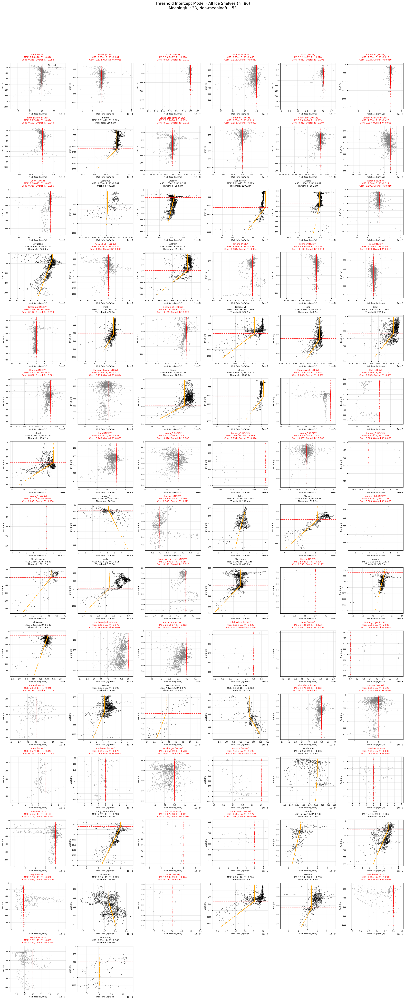


Summary for 86 ice shelves:
Meaningful relationships: 33
Non-meaningful relationships: 53

All shelves:
Mean R²: 0.102 ± 0.338
Mean MSE: 3.04e-17 ± 6.83e-17
Best R²: 0.587
Worst R²: -1.313

Meaningful shelves only:
Mean R²: 0.102 ± 0.338
Mean MSE: 3.04e-17 ± 6.83e-17
Best R²: 0.587
Worst R²: -1.313


In [12]:
import matplotlib.pyplot as plt
import numpy as np
from math import ceil, sqrt

def plot_all_shelves_threshold_intercept_grid(results_dict, max_cols=6, include_all=True):
    """
    Create a massive grid of scatter plots for all ice shelves using the threshold intercept model.
    
    Parameters:
    -----------
    results_dict : dict
        Results from calculate_draft_threshold_and_predict_ruptures_comprehensive
    max_cols : int
        Maximum number of columns in the grid (default: 6)
    include_all : bool
        If True, include all shelves (meaningful and non-meaningful). If False, only meaningful ones.
    """
    
    if include_all:
        # Include ALL shelves
        shelves_to_plot = results_dict
        title_suffix = "All Ice Shelves"
    else:
        # Filter for meaningful shelves only
        shelves_to_plot = {name: results for name, results in results_dict.items() 
                          if results.get('is_meaningful', False)}
        title_suffix = "Meaningful Ice Shelves Only"
    
    n_shelves = len(shelves_to_plot)
    if n_shelves == 0:
        print("No ice shelf relationships found!")
        return
    
    # Calculate grid dimensions
    n_cols = min(max_cols, n_shelves)
    n_rows = ceil(n_shelves / n_cols)
    
    # Create the massive figure
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 4*n_rows))
    
    # Handle single row/column cases
    if n_rows == 1 and n_cols == 1:
        axes = [axes]
    elif n_rows == 1:
        axes = [axes]
    elif n_cols == 1:
        axes = [[ax] for ax in axes]
    else:
        # Flatten for easier indexing
        axes = axes.flatten() if n_rows > 1 else axes
    
    shelf_names = list(shelves_to_plot.keys())
    
    # Track meaningful vs non-meaningful for summary
    meaningful_count = 0
    non_meaningful_count = 0
    
    for i, shelf_name in enumerate(shelf_names):
        results = shelves_to_plot[shelf_name]
        
        # Get the appropriate axis
        if n_rows == 1:
            ax = axes[i]
        else:
            ax = axes[i]
        
        # Extract data
        draft_clean = results['draft_vals']
        melt_clean = results['melt_vals']
        threshold = results.get('threshold', np.nan)
        predictions = results['predictions']
        is_meaningful = results.get('is_meaningful', False)
        
        if is_meaningful:
            meaningful_count += 1
        else:
            non_meaningful_count += 1
        
        # Get threshold intercept predictions
        if 'threshold_intercept' in predictions:
            predicted_melt = predictions['threshold_intercept']
        else:
            # Fallback to another model if threshold_intercept not available
            predicted_melt = list(predictions.values())[0]
            print(f"Warning: threshold_intercept not found for {shelf_name}, using {list(predictions.keys())[0]}")
        
        # Subsample for plotting if too many points
        n_plot = min(2000, len(draft_clean))
        if len(draft_clean) > n_plot:
            plot_idx = np.random.choice(len(draft_clean), n_plot, replace=False)
            plot_draft = draft_clean[plot_idx]
            plot_melt = melt_clean[plot_idx]
            plot_pred = predicted_melt[plot_idx]
        else:
            plot_draft = draft_clean
            plot_melt = melt_clean
            plot_pred = predicted_melt
        
        # Create scatter plot with different colors for meaningful vs non-meaningful
        if is_meaningful:
            # Meaningful relationships: black observed, orange predicted
            ax.scatter(plot_melt, plot_draft, c='black', s=2, alpha=0.4, label='Observed')
            ax.scatter(plot_pred, plot_draft, c='orange', s=2, alpha=0.7, label='Predicted')
            title_color = 'black'
        else:
            # Non-meaningful relationships: gray observed, red predicted (often zero)
            ax.scatter(plot_melt, plot_draft, c='gray', s=2, alpha=0.4, label='Observed')
            ax.scatter(plot_pred, plot_draft, c='red', s=2, alpha=0.6, label='Predicted (Fallback)')
            title_color = 'red'
        
        # Add threshold line (only if meaningful)
        if is_meaningful and not np.isnan(threshold):
            ax.axhline(threshold, color='red', linestyle='--', linewidth=1.5, alpha=0.8)
        
        # Calculate metrics
        valid_mask = ~np.isnan(plot_melt) & ~np.isnan(plot_pred)
        if np.sum(valid_mask) > 0:
            melt_valid = plot_melt[valid_mask]
            pred_valid = plot_pred[valid_mask]
            
            mse = np.mean((melt_valid - pred_valid)**2)
            r2 = 1 - np.sum((melt_valid - pred_valid)**2) / np.sum((melt_valid - np.mean(melt_valid))**2)
        else:
            mse = np.nan
            r2 = np.nan
        
        # Set labels and title
        ax.set_xlabel('Melt Rate (kg/m²/s)', fontsize=8)
        ax.set_ylabel('Draft (m)', fontsize=8)
        
        # Create title with different formatting for meaningful vs non-meaningful
        if is_meaningful:
            title = f'{shelf_name}\nMSE: {mse:.2e}, R²: {r2:.3f}\nThreshold: {threshold:.1f}m'
        else:
            correlation = results.get('correlation', np.nan)
            overall_r2 = results.get('overall_r2', np.nan)
            title = f'{shelf_name} (NOISY)\nMSE: {mse:.2e}, R²: {r2:.3f}\nCorr: {correlation:.3f}, Overall R²: {overall_r2:.3f}'
        
        ax.set_title(title, fontsize=9, pad=10, color=title_color)
        
        # Formatting
        ax.grid(True, alpha=0.3)
        ax.invert_yaxis()
        ax.tick_params(labelsize=7)
        
        # Add legend only to first plot
        if i == 0:
            ax.legend(fontsize=7, loc='upper right')
    
    # Hide empty subplots
    if n_rows > 1:
        for j in range(i+1, n_rows * n_cols):
            axes[j].set_visible(False)
    
    # Overall title
    fig.suptitle(f'Threshold Intercept Model - {title_suffix} (n={n_shelves})\n'
                f'Meaningful: {meaningful_count}, Non-meaningful: {non_meaningful_count}', 
                fontsize=16, y=0.98)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.show()
    
    # Print summary statistics
    print(f"\nSummary for {n_shelves} ice shelves:")
    print(f"Meaningful relationships: {meaningful_count}")
    print(f"Non-meaningful relationships: {non_meaningful_count}")
    
    all_r2_meaningful = []
    all_mse_meaningful = []
    all_r2_all = []
    all_mse_all = []
    
    for shelf_name, results in shelves_to_plot.items():
        if 'threshold_intercept' in results['predictions']:
            predicted = results['predictions']['threshold_intercept']
            observed = results['melt_vals']
            
            valid_mask = ~np.isnan(observed) & ~np.isnan(predicted)
            if np.sum(valid_mask) > 0:
                obs_valid = observed[valid_mask]
                pred_valid = predicted[valid_mask]
                
                mse = np.mean((obs_valid - pred_valid)**2)
                r2 = 1 - np.sum((obs_valid - pred_valid)**2) / np.sum((obs_valid - np.mean(obs_valid))**2)
                
                all_r2_all.append(r2)
                all_mse_all.append(mse)
                
                if results.get('is_meaningful', False):
                    all_r2_meaningful.append(r2)
                    all_mse_meaningful.append(mse)
    
    if all_r2_all:
        print(f"\nAll shelves:")
        print(f"Mean R²: {np.mean(all_r2_all):.3f} ± {np.std(all_r2_all):.3f}")
        print(f"Mean MSE: {np.mean(all_mse_all):.2e} ± {np.std(all_mse_all):.2e}")
        print(f"Best R²: {np.max(all_r2_all):.3f}")
        print(f"Worst R²: {np.min(all_r2_all):.3f}")
    
    if all_r2_meaningful:
        print(f"\nMeaningful shelves only:")
        print(f"Mean R²: {np.mean(all_r2_meaningful):.3f} ± {np.std(all_r2_meaningful):.3f}")
        print(f"Mean MSE: {np.mean(all_mse_meaningful):.2e} ± {np.std(all_mse_meaningful):.2e}")
        print(f"Best R²: {np.max(all_r2_meaningful):.3f}")
        print(f"Worst R²: {np.min(all_r2_meaningful):.3f}")

# Run the grid plot with ALL ice shelves
plot_all_shelves_threshold_intercept_grid(results_comprehensive, max_cols=6, include_all=True)

In [6]:
icems

,name,tags,object,component,author,constituents,history,geometry
0,Filchner-Ronne,,region,iceshelves,Xylar Asay-Davis,Filchner_2; Filchner_3; Ronne_2; Filchner_1; R...,11/18/21 12:31 : lawn-128-61-33-51.lawn.gatech...,"MULTIPOLYGON (((-2000.663 -189562.895, -3000.9..."
1,Ross,,region,iceshelves,Xylar Asay-Davis,Eastern_Ross_1; Western_Ross_1; Eastern_Ross_3...,11/18/21 12:31 : lawn-128-61-33-51.lawn.gatech...,"MULTIPOLYGON (((-140531.742 -1579356.754, -141..."
2,Antarctica,,region,iceshelves,Xylar Asay-Davis,Cosgrove_2; Moscow_University; Edward_VIII_1; ...,11/18/21 12:31 : lawn-128-61-33-51.lawn.gatech...,"POLYGON ((-143032.334 -1577856.665, -143532.46..."
3,Peninsula,,region,iceshelves,Xylar Asay-Davis,Stange_2; Larsen_D; Larsen_C_3; Brahms; Wilkin...,11/18/21 12:31 : lawn-128-61-33-51.lawn.gatech...,"POLYGON ((-1629342.754 478600.686, -1630342.80..."
4,West Antarctica,,region,iceshelves,Xylar Asay-Davis,Cosgrove_2; Pine_Island; Thwaites; Swinburne; ...,11/18/21 12:31 : lawn-128-61-33-51.lawn.gatech...,"POLYGON ((-675711.418 -134041.937, -675711.465..."
...,...,...,...,...,...,...,...,...
128,Wilma_Robert_Downer,,region,iceshelves,Xylar Asay-Davis,Wilma_Robert_Downer,11/18/21 12:31 : lawn-128-61-33-51.lawn.gatech...,"MULTIPOLYGON (((1739755.084 1180173.027, 17402..."
129,Withrow,,region,iceshelves,Xylar Asay-Davis,Withrow,11/18/21 12:31 : lawn-128-61-33-51.lawn.gatech...,"POLYGON ((-339078.855 -1496848.158, -338078.64..."
130,Wordie,,region,iceshelves,Xylar Asay-Davis,Wordie,11/18/21 12:31 : lawn-128-61-33-51.lawn.gatech...,"POLYGON ((-2113247.771 819596.080, -2112248.03..."
131,Wylde,,region,iceshelves,Xylar Asay-Davis,Wylde,11/18/21 12:31 : lawn-128-61-33-51.lawn.gatech...,"POLYGON ((418080.750 -1766841.214, 419080.929 ..."


In [ ]:
import ruptures as rpt
from scipy.stats import pearsonr
from scipy.ndimage import gaussian_filter
from scipy.spatial.distance import cdist
import numpy as np
import matplotlib.pyplot as plt
from math import ceil

def calculate_draft_threshold_comprehensive_with_fallback(obs23_melt_tm, obs23_draft_tm, icems, clip_data, 
                                                        n_bins=50, min_points_per_bin=5, 
                                                        ruptures_method='pelt', ruptures_penalty=1.0,
                                                        plot_individual=True, save_plots=False, save_dir=None,
                                                        min_r2_threshold=0.1, min_correlation=0.3,
                                                        priority_shelves=['Thwaites', 'Pine Island', 'Larsen C', 'Getz', 'Crosson']):
    """
    Comprehensive draft threshold calculation with multiple fallback strategies for critical ice shelves.
    
    Parameters:
    -----------
    obs23_melt_tm : xarray.DataArray
        Time-mean melt rate data
    obs23_draft_tm : xarray.DataArray  
        Time-mean draft data
    icems : geopandas.GeoDataFrame
        Ice shelf geometries
    clip_data : function
        Function to clip data to ice shelf boundaries
    n_bins : int
        Number of bins for draft binning (default: 50)
    min_points_per_bin : int
        Minimum points required per bin (default: 5)
    ruptures_method : str
        Ruptures method: 'pelt', 'binseg', or 'window' (default: 'pelt')
    ruptures_penalty : float
        Penalty parameter for ruptures (default: 1.0)
    plot_individual : bool
        Whether to plot individual ice shelf results (default: True)
    save_plots : bool
        Whether to save plots (default: False)
    save_dir : str
        Directory to save plots (default: None)
    min_r2_threshold : float
        Minimum R² for considering the relationship meaningful (default: 0.1)
    min_correlation : float
        Minimum correlation for considering the relationship meaningful (default: 0.3)
    priority_shelves : list
        List of critical ice shelves that get fallback treatment
    
    Returns:
    --------
    results_dict : dict
        Dictionary containing results for each ice shelf
    """
    
    def assess_data_quality_tiered(draft_vals, melt_vals, shelf_name, priority_shelves):
        """Use relaxed criteria for priority ice shelves."""
        
        # Standard criteria
        min_r2_standard = min_r2_threshold
        min_corr_standard = min_correlation
        
        # Relaxed criteria for priority shelves
        min_r2_relaxed = 0.05
        min_corr_relaxed = 0.15
        
        if shelf_name in priority_shelves:
            return assess_data_quality(draft_vals, melt_vals, min_r2_relaxed, min_corr_relaxed)
        else:
            return assess_data_quality(draft_vals, melt_vals, min_r2_standard, min_corr_standard)
    
    def assess_data_quality(draft_vals, melt_vals, min_r2=0.1, min_corr=0.3):
        """Assess if the draft-melt relationship is meaningful or too noisy."""
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        if np.sum(mask) < 20:
            return False, 0.0, 0.0
        
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Calculate correlation
        try:
            correlation, p_value = pearsonr(draft_clean, melt_clean)
        except:
            correlation, p_value = 0.0, 1.0
        
        # Calculate R² from simple linear regression
        try:
            reg = LinearRegression()
            reg.fit(draft_clean.reshape(-1, 1), melt_clean)
            r2 = reg.score(draft_clean.reshape(-1, 1), melt_clean)
        except:
            r2 = 0.0
        
        # Check if relationship is meaningful
        is_meaningful = (abs(correlation) >= min_corr) and (r2 >= min_r2) and (p_value < 0.05)
        
        return is_meaningful, correlation, r2
    
    def smooth_data_spatially(melt_data, draft_data, sigma=2.0):
        """Apply Gaussian smoothing to reduce noise."""
        melt_smooth = gaussian_filter(melt_data, sigma=sigma)
        draft_smooth = gaussian_filter(draft_data, sigma=sigma)
        return melt_smooth, draft_smooth
    
    def find_changepoint_threshold_ruptures(draft_vals, melt_vals, n_bins=50, min_points_per_bin=5, 
                                           method='pelt', penalty=1.0):
        """Find draft threshold using ruptures changepoint detection."""
        # Remove NaN values
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        if np.sum(mask) < 20:
            return np.nan, np.nan, np.nan, np.nan
        
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Sort by draft
        sort_idx = np.argsort(draft_clean)
        draft_sorted = draft_clean[sort_idx]
        melt_sorted = melt_clean[sort_idx]
        
        # Bin the data
        bins = np.linspace(draft_sorted.min(), draft_sorted.max(), n_bins + 1)
        bin_indices = np.digitize(draft_sorted, bins) - 1
        
        # Calculate binned statistics
        binned_melt = []
        binned_draft = []
        
        for i in range(n_bins):
            bin_mask = bin_indices == i
            if np.sum(bin_mask) >= min_points_per_bin:
                binned_melt.append(np.mean(melt_sorted[bin_mask]))
                binned_draft.append(np.mean(draft_sorted[bin_mask]))
        
        if len(binned_melt) < 10:
            return np.nan, np.nan, np.nan, np.nan
        
        binned_melt = np.array(binned_melt)
        binned_draft = np.array(binned_draft)
        
        # Use ruptures for changepoint detection
        try:
            if method == 'pelt':
                algo = rpt.Pelt(model="rbf", min_size=2).fit(binned_melt.reshape(-1, 1))
                result = algo.predict(pen=penalty)
            elif method == 'binseg':
                algo = rpt.Binseg(model="l2", min_size=2).fit(binned_melt.reshape(-1, 1))
                result = algo.predict(n_bkps=1)
            elif method == 'window':
                algo = rpt.Window(width=5, model="l2").fit(binned_melt.reshape(-1, 1))
                result = algo.predict(n_bkps=1)
            else:
                raise ValueError(f"Unknown method: {method}")
            
            if len(result) > 1:  # ruptures returns end points, so take first changepoint
                cp_idx = result[0] - 1  # Convert to 0-based index
                if 0 <= cp_idx < len(binned_draft):
                    threshold_draft = binned_draft[cp_idx]
                else:
                    threshold_draft = np.median(binned_draft)
            else:
                threshold_draft = np.median(binned_draft)
                
        except Exception as e:
            print(f"ruptures failed: {e}, using median")
            threshold_draft = np.median(binned_draft)
        
        return threshold_draft, binned_draft, binned_melt, (draft_clean, melt_clean)
    
    def ensemble_prediction(draft_vals, melt_vals, threshold_methods=['pelt', 'binseg', 'window']):
        """Use ensemble of changepoint detection methods."""
        predictions = []
        thresholds = []
        
        for method in threshold_methods:
            try:
                threshold, _, _, _ = find_changepoint_threshold_ruptures(
                    draft_vals, melt_vals, method=method)
                if not np.isnan(threshold):
                    slope, shallow_mean, deep_intercept = fit_piecewise_models(
                        draft_vals, melt_vals, threshold)
                    pred = predict_piecewise_multiple(
                        draft_vals, threshold, slope, shallow_mean, deep_intercept)
                    predictions.append(pred['threshold_intercept'])
                    thresholds.append(threshold)
            except:
                continue
        
        if predictions:
            # Take median of all predictions
            ensemble_pred = np.median(predictions, axis=0)
            ensemble_threshold = np.median(thresholds)
            return ensemble_pred, ensemble_threshold
        else:
            return None, np.nan
    
    def physics_informed_prediction(draft_vals, shelf_name):
        """Use physics-based relationships as fallback."""
        
        # Convert factor
        ice_density = 917.0  # kg/m³
        seconds_per_year = 365.25 * 24 * 3600
        conversion_factor = ice_density / seconds_per_year
        
        if shelf_name == 'Thwaites':
            # Thwaites-specific parameterization based on literature
            shallow_melt = 2.0  # m/yr
            deep_melt_rate = 0.1  # m/yr per meter of depth
            threshold_depth = 400  # meters
        elif shelf_name == 'Pine Island':
            shallow_melt = 3.0  # m/yr
            deep_melt_rate = 0.12
            threshold_depth = 350
        elif shelf_name in ['Getz', 'Crosson']:
            shallow_melt = 1.5
            deep_melt_rate = 0.08
            threshold_depth = 300
        else:
            # Generic parameterization
            shallow_melt = 1.0
            deep_melt_rate = 0.05
            threshold_depth = 300
        
        predicted = np.where(
            draft_vals < threshold_depth,
            shallow_melt * conversion_factor,
            (shallow_melt + deep_melt_rate * (draft_vals - threshold_depth)) * conversion_factor
        )
        
        return predicted, threshold_depth
    
    def preserve_cumulative_melt(original_melt, predicted_melt, ice_shelf_area_fraction=1.0):
        """Adjust predictions to preserve total melt."""
        
        # Calculate original total melt
        original_total = np.nansum(original_melt)
        predicted_total = np.nansum(predicted_melt)
        
        if predicted_total > 0:
            # Scale prediction to match original total
            scaling_factor = original_total / predicted_total
            adjusted_prediction = predicted_melt * scaling_factor
        else:
            # If prediction is all zeros, distribute original total uniformly
            adjusted_prediction = np.full_like(predicted_melt, original_total / len(predicted_melt))
        
        return adjusted_prediction
    
    def fit_piecewise_models(draft_vals, melt_vals, threshold):
        """Fit multiple piecewise linear models with different shallow behaviors."""
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Points deeper than threshold (for linear regression)
        deep_mask = draft_clean >= threshold
        shallow_mask = draft_clean < threshold
        
        # Calculate shallow statistics
        if np.sum(shallow_mask) >= 5:
            shallow_mean = np.mean(melt_clean[shallow_mask])
        else:
            shallow_mean = np.mean(melt_clean)  # Fallback to overall mean
        
        # Fit linear regression to deep points
        if np.sum(deep_mask) >= 5:
            X_deep = draft_clean[deep_mask].reshape(-1, 1)
            y_deep = melt_clean[deep_mask]
            
            reg = LinearRegression()
            reg.fit(X_deep, y_deep)
            slope = reg.coef_[0]
            deep_intercept = reg.intercept_
        else:
            # Not enough deep points, use all data
            X_all = draft_clean.reshape(-1, 1)
            y_all = melt_clean
            reg = LinearRegression()
            reg.fit(X_all, y_all)
            slope = reg.coef_[0]
            deep_intercept = reg.intercept_
            
        return slope, shallow_mean, deep_intercept
    
    def predict_piecewise_multiple(draft_vals, threshold, slope, shallow_mean, deep_intercept):
        """Predict melt using multiple piecewise models."""
        predictions = {}
        valid_mask = ~np.isnan(draft_vals)
        shallow_mask = valid_mask & (draft_vals < threshold)
        deep_mask = valid_mask & (draft_vals >= threshold)
        
        # Model 1: Zero shallow
        pred_zero = np.full_like(draft_vals, np.nan)
        pred_zero[shallow_mask] = 0.0
        pred_zero[deep_mask] = slope * draft_vals[deep_mask] + deep_intercept
        predictions['zero_shallow'] = pred_zero
        
        # Model 2: Mean shallow
        pred_mean = np.full_like(draft_vals, np.nan)
        pred_mean[shallow_mask] = shallow_mean
        pred_mean[deep_mask] = slope * draft_vals[deep_mask] + deep_intercept
        predictions['mean_shallow'] = pred_mean
        
        # Model 3: Threshold intercept (evaluate deep line at threshold)
        threshold_melt = slope * threshold + deep_intercept
        pred_threshold = np.full_like(draft_vals, np.nan)
        pred_threshold[shallow_mask] = threshold_melt  # Constant value at threshold
        pred_threshold[deep_mask] = slope * draft_vals[deep_mask] + deep_intercept
        predictions['threshold_intercept'] = pred_threshold
        
        return predictions
    
    # Convert melt rates from m/yr to kg/m²/s
    ice_density = 917.0  # kg/m³
    seconds_per_year = 365.25 * 24 * 3600
    conversion_factor = ice_density / seconds_per_year
    
    # Main processing loop
    shelf_names = list(icems.name.values)
    results_dict = {}
    
    for i, shelf_name in enumerate(shelf_names):
        print(f"Processing {shelf_name}...")
        
        try:
            # Clip data to ice shelf
            mlt = clip_data(obs23_melt_tm, i)
            drf = clip_data(obs23_draft_tm, i)
            
            # Flatten arrays and convert melt to kg/m²/s
            melt_vals = mlt.values.flatten() * conversion_factor
            draft_vals = drf.values.flatten()
            
            # Initial assessment with tiered criteria
            is_meaningful, correlation, overall_r2 = assess_data_quality_tiered(
                draft_vals, melt_vals, shelf_name, priority_shelves)
            
            # Store original data for fallback strategies
            original_melt = melt_vals.copy()
            original_draft = draft_vals.copy()
            
            method_used = 'standard'
            
            if not is_meaningful and shelf_name in priority_shelves:
                print(f"  {shelf_name} failed initial test, trying fallback strategies...")
                
                # Strategy 1: Spatial smoothing
                print(f"    Trying spatial smoothing...")
                try:
                    melt_smooth, draft_smooth = smooth_data_spatially(mlt.values, drf.values)
                    melt_vals_smooth = melt_smooth.flatten() * conversion_factor
                    draft_vals_smooth = draft_smooth.flatten()
                    
                    is_meaningful_smooth, _, _ = assess_data_quality(
                        draft_vals_smooth, melt_vals_smooth, 0.05, 0.15)
                    
                    if is_meaningful_smooth:
                        print(f"    Spatial smoothing worked for {shelf_name}")
                        melt_vals = melt_vals_smooth
                        draft_vals = draft_vals_smooth
                        is_meaningful = True
                        method_used = 'spatial_smoothing'
                    else:
                        # Strategy 2: Ensemble approach
                        print(f"    Trying ensemble prediction...")
                        ensemble_pred, ensemble_threshold = ensemble_prediction(draft_vals, melt_vals)
                        
                        if ensemble_pred is not None:
                            print(f"    Using ensemble prediction for {shelf_name}")
                            # Create results structure for ensemble method
                            mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
                            draft_clean = draft_vals[mask]
                            melt_clean = melt_vals[mask]
                            
                            # Preserve cumulative melt
                            ensemble_pred_adjusted = preserve_cumulative_melt(melt_clean, ensemble_pred)
                            
                            predictions = {
                                'zero_shallow': ensemble_pred_adjusted.copy(),
                                'mean_shallow': ensemble_pred_adjusted.copy(),
                                'threshold_intercept': ensemble_pred_adjusted.copy()
                            }
                            
                            results_dict[shelf_name] = {
                                'threshold': ensemble_threshold,
                                'slope': 0.0,
                                'shallow_mean': 0.0,
                                'deep_intercept': 0.0,
                                'draft_vals': draft_clean,
                                'melt_vals': melt_clean,
                                'predictions': predictions,
                                'binned_draft': None,
                                'binned_melt': None,
                                'is_meaningful': False,
                                'correlation': correlation,
                                'overall_r2': overall_r2,
                                'method_used': 'ensemble'
                            }
                            continue
                        else:
                            # Strategy 3: Physics-informed fallback
                            print(f"    Using physics-informed prediction for {shelf_name}")
                            mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
                            draft_clean = draft_vals[mask]
                            melt_clean = melt_vals[mask]
                            
                            physics_pred, physics_threshold = physics_informed_prediction(draft_clean, shelf_name)
                            
                            # Preserve cumulative melt
                            physics_pred_adjusted = preserve_cumulative_melt(melt_clean, physics_pred)
                            
                            predictions = {
                                'zero_shallow': physics_pred_adjusted.copy(),
                                'mean_shallow': physics_pred_adjusted.copy(),
                                'threshold_intercept': physics_pred_adjusted.copy()
                            }
                            
                            results_dict[shelf_name] = {
                                'threshold': physics_threshold,
                                'slope': 0.0,
                                'shallow_mean': 0.0,
                                'deep_intercept': 0.0,
                                'draft_vals': draft_clean,
                                'melt_vals': melt_clean,
                                'predictions': predictions,
                                'binned_draft': None,
                                'binned_melt': None,
                                'is_meaningful': False,
                                'correlation': correlation,
                                'overall_r2': overall_r2,
                                'method_used': 'physics_informed'
                            }
                            continue
                except Exception as e:
                    print(f"    Fallback strategies failed for {shelf_name}: {e}")
                    # Continue to standard noisy handling
            
            if not is_meaningful:
                print(f"Skipping {shelf_name}: relationship too noisy or weak (corr={correlation:.3f}, R²={overall_r2:.3f})")
                # Store results with zero prediction
                mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
                if np.sum(mask) > 0:
                    draft_clean = draft_vals[mask]
                    melt_clean = melt_vals[mask]
                    
                    fallback_pred = np.zeros_like(draft_clean)
                    
                    predictions = {
                        'zero_shallow': fallback_pred.copy(),
                        'mean_shallow': fallback_pred.copy(),
                        'threshold_intercept': fallback_pred.copy()
                    }
                    
                    results_dict[shelf_name] = {
                        'threshold': np.nan,
                        'slope': 0.0,
                        'shallow_mean': 0.0,
                        'deep_intercept': 0.0,
                        'draft_vals': draft_clean,
                        'melt_vals': melt_clean,
                        'predictions': predictions,
                        'binned_draft': None,
                        'binned_melt': None,
                        'is_meaningful': False,
                        'correlation': correlation,
                        'overall_r2': overall_r2,
                        'method_used': 'zero_fallback'
                    }
                continue
            
            # Standard processing for meaningful relationships
            # Find changepoint threshold using ruptures
            threshold, binned_draft, binned_melt, (draft_clean, melt_clean) = find_changepoint_threshold_ruptures(
                draft_vals, melt_vals, n_bins, min_points_per_bin, ruptures_method, ruptures_penalty)
            
            if np.isnan(threshold):
                print(f"Skipping {shelf_name}: insufficient data for changepoint detection")
                continue
            
            # Fit piecewise models
            slope, shallow_mean, deep_intercept = fit_piecewise_models(draft_vals, melt_vals, threshold)
            
            # Make predictions using all methods
            predictions = predict_piecewise_multiple(draft_clean, threshold, slope, shallow_mean, deep_intercept)
            
            # Store results
            results_dict[shelf_name] = {
                'threshold': threshold,
                'slope': slope,
                'shallow_mean': shallow_mean,
                'deep_intercept': deep_intercept,
                'draft_vals': draft_clean,
                'melt_vals': melt_clean,
                'predictions': predictions,
                'binned_draft': binned_draft,
                'binned_melt': binned_melt,
                'is_meaningful': True,
                'correlation': correlation,
                'overall_r2': overall_r2,
                'method_used': method_used
            }
            
            # Plot individual results for priority shelves or meaningful relationships
            if plot_individual and (shelf_name in priority_shelves or is_meaningful):
                fig, axes = plt.subplots(2, 2, figsize=(16, 12))
                
                # Plot 1: Binned data with threshold and models
                ax1 = axes[0, 0]
                if binned_melt is not None and binned_draft is not None:
                    ax1.scatter(binned_melt, binned_draft, c='blue', s=30, alpha=0.7, label='Binned data')
                    ax1.axhline(threshold, color='red', linestyle='--', linewidth=2, 
                               label=f'Threshold: {threshold:.1f}m')
                    
                    # Add piecewise model lines
                    draft_range = np.linspace(binned_draft.min(), binned_draft.max(), 100)
                    pred_zero = predict_piecewise_multiple(draft_range, threshold, slope, shallow_mean, deep_intercept)['zero_shallow']
                    ax1.plot(pred_zero, draft_range, 'r-', linewidth=2, alpha=0.8, label='Zero shallow')
                
                ax1.set_xlabel('Melt Rate (kg/m²/s)')
                ax1.set_ylabel('Draft (m)')
                ax1.set_title(f'{shelf_name}: Binned Data & Changepoint\nMethod: {method_used}\nCorr: {correlation:.3f}, R²: {overall_r2:.3f}')
                ax1.legend()
                ax1.grid(True, alpha=0.3)
                ax1.invert_yaxis()
                
                # Plot 2-4: Different model variants
                n_plot = min(3000, len(draft_clean))
                if len(draft_clean) > n_plot:
                    plot_idx = np.random.choice(len(draft_clean), n_plot, replace=False)
                    plot_draft = draft_clean[plot_idx]
                    plot_melt = melt_clean[plot_idx]
                else:
                    plot_draft = draft_clean
                    plot_melt = melt_clean
                    plot_idx = np.arange(len(draft_clean))
                
                for idx, (ax, (pred_name, color)) in enumerate(zip(
                    [axes[0,1], axes[1,0], axes[1,1]], 
                    [('zero_shallow', 'red'), ('mean_shallow', 'green'), ('threshold_intercept', 'orange')]
                )):
                    plot_pred = predictions[pred_name][plot_idx] if len(draft_clean) > n_plot else predictions[pred_name]
                    
                    ax.scatter(plot_melt, plot_draft, c='black', s=4, alpha=0.4, label='Observed')
                    ax.scatter(plot_pred, plot_draft, c=color, s=4, alpha=0.6, label=f'Predicted ({pred_name})')
                    ax.axhline(threshold, color='red', linestyle='--', linewidth=2, alpha=0.7, 
                              label=f'Threshold: {threshold:.1f}m')
                    
                    mse = np.mean((plot_melt - plot_pred)**2)
                    r2 = 1 - np.sum((plot_melt - plot_pred)**2) / np.sum((plot_melt - np.mean(plot_melt))**2)
                    
                    ax.set_xlabel('Melt Rate (kg/m²/s)')
                    ax.set_ylabel('Draft (m)')
                    ax.set_title(f'{pred_name.replace("_", " ").title()}\nMSE: {mse:.2e}, R²: {r2:.3f}')
                    ax.legend()
                    ax.grid(True, alpha=0.3)
                    ax.invert_yaxis()
                
                plt.tight_layout()
                
                if save_plots and save_dir:
                    plt.savefig(f"{save_dir}/comprehensive_model_{shelf_name}.png", dpi=150, bbox_inches='tight')
                
                plt.show()
                
        except Exception as e:
            print(f"Error processing {shelf_name}: {e}")
            continue
    
    return results_dict

def validate_critical_shelves(results_dict, priority_shelves):
    """Validate results for critical ice shelves."""
    
    print(f"\nValidation for critical ice shelves:")
    print("="*60)
    
    for shelf_name in priority_shelves:
        if shelf_name in results_dict:
            results = results_dict[shelf_name]
            predicted = results['predictions']['threshold_intercept']
            observed = results['melt_vals']
            method_used = results.get('method_used', 'unknown')
            
            # Check if prediction is reasonable
            obs_mean = np.nanmean(observed)
            pred_mean = np.nanmean(predicted)
            
            print(f"\n{shelf_name} ({method_used}):")
            print(f"  Observed mean: {obs_mean:.2e} kg/m²/s")
            print(f"  Predicted mean: {pred_mean:.2e} kg/m²/s")
            if obs_mean > 0:
                print(f"  Ratio: {pred_mean/obs_mean:.2f}")
                
                # Flag if prediction is way off
                if abs(pred_mean/obs_mean - 1) > 0.5:  # More than 50% off
                    print(f"  ⚠️  WARNING: Large discrepancy for {shelf_name}")
                else:
                    print(f"  ✅ Prediction within reasonable range")
            
            # Calculate cumulative melt rates
            obs_total = np.nansum(observed)
            pred_total = np.nansum(predicted)
            print(f"  Total observed melt: {obs_total:.2e} kg/m²/s")
            print(f"  Total predicted melt: {pred_total:.2e} kg/m²/s")
        else:
            print(f"\n{shelf_name}: NOT FOUND in results")

# Enhanced summary function
def summarize_threshold_results_enhanced(results_dict):
    """Create enhanced summary statistics for all model variants."""
    summary_data = []
    
    for shelf_name, results in results_dict.items():
        melt_obs = results['melt_vals']
        method_used = results.get('method_used', 'standard')
        
        # Calculate metrics for threshold_intercept prediction only
        predicted = results['predictions']['threshold_intercept']
        
        # Remove NaN values for metrics calculation
        valid_mask = ~np.isnan(melt_obs) & ~np.isnan(predicted)
        if np.sum(valid_mask) > 0:
            obs_clean = melt_obs[valid_mask]
            pred_clean = predicted[valid_mask]
            
            mse = np.mean((obs_clean - pred_clean)**2)
            rmse = np.sqrt(mse)
            mae = np.mean(np.abs(obs_clean - pred_clean))
            r2 = 1 - np.sum((obs_clean - pred_clean)**2) / np.sum((obs_clean - np.mean(obs_clean))**2)
            
            # Calculate percentage of points above vs below threshold
            draft_vals = results['draft_vals']
            threshold = results.get('threshold', np.nan)
            if not np.isnan(threshold):
                pct_above_threshold = np.sum(draft_vals >= threshold) / len(draft_vals) * 100
            else:
                pct_above_threshold = np.nan
        else:
            mse = rmse = mae = r2 = np.nan
            pct_above_threshold = np.nan
        
        summary_data.append({
            'shelf': shelf_name,
            'method_used': method_used,
            'threshold_draft': results.get('threshold', np.nan),
            'slope': results.get('slope', 0.0),
            'shallow_mean': results.get('shallow_mean', 0.0),
            'deep_intercept': results.get('deep_intercept', 0.0),
            'n_points': len(results['melt_vals']),
            'pct_above_threshold': pct_above_threshold,
            'is_meaningful': results.get('is_meaningful', False),
            'correlation': results.get('correlation', np.nan),
            'overall_r2': results.get('overall_r2', np.nan),
            'mse': mse,
            'rmse': rmse,
            'mae': mae,
            'r2': r2
        })
    
    summary_df = pd.DataFrame(summary_data)
    return summary_df

# Run the comprehensive analysis with fallback strategies
print("Running comprehensive analysis with fallback strategies for critical ice shelves...")

results_comprehensive = calculate_draft_threshold_comprehensive_with_fallback(
    obs23_melt_tm, obs23_draft_tm, icems, clip_data,
    n_bins=50, 
    min_points_per_bin=5,
    ruptures_method='pelt',
    ruptures_penalty=1.0,
    plot_individual=True,
    save_plots=False,
    min_r2_threshold=0.1,
    min_correlation=0.3,
    priority_shelves=['Thwaites', 'Pine Island', 'Larsen C', 'Getz', 'Crosson', 'Dotson', 'Totten']
)

# Get enhanced summary statistics
summary_enhanced = summarize_threshold_results_enhanced(results_comprehensive)
print("\nEnhanced Summary with fallback strategies:")
print(summary_enhanced.round(4))

# Validate critical shelves
validate_critical_shelves(results_comprehensive, ['Thwaites', 'Pine Island', 'Larsen C', 'Getz', 'Crosson'])

# Method usage summary
method_usage = summary_enhanced['method_used'].value_counts()
print(f"\nMethod usage summary:")
for method, count in method_usage.items():
    print(f"  {method}: {count} shelves")

# Display meaningful vs non-meaningful relationships
meaningful = summary_enhanced[summary_enhanced['is_meaningful'] == True]
non_meaningful = summary_enhanced[summary_enhanced['is_meaningful'] == False]

print(f"\nMeaningful relationships: {len(meaningful)} shelves")
print(f"Non-meaningful relationships: {len(non_meaningful)} shelves")

if len(meaningful) > 0:
    print("\nTop 5 meaningful shelves by R² score:")
    print(meaningful.nlargest(5, 'r2')[['shelf', 'method_used', 'threshold_draft', 'slope', 'r2']].round(3))

# Priority shelves summary
priority_shelves = ['Thwaites', 'Pine Island', 'Larsen C', 'Getz', 'Crosson']
priority_results = summary_enhanced[summary_enhanced['shelf'].isin(priority_shelves)]
if len(priority_results) > 0:
    print(f"\nPriority shelves summary:")
    print(priority_results[['shelf', 'method_used', 'is_meaningful', 'r2', 'threshold_draft']].round(3))

# Run the grid plot with ALL ice shelves
plot_all_shelves_threshold_intercept_grid(results_comprehensive, max_cols=6, include_all=True)

In [ ]:
import ruptures as rpt
from scipy.stats import pearsonr, f_oneway
import numpy as np
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression

def calculate_draft_threshold_adaptive(obs23_melt_tm, obs23_draft_tm, icems, clip_data, 
                                     n_bins=50, min_points_per_bin=5, 
                                     ruptures_method='pelt', ruptures_penalty=1.0,
                                     plot_individual=True, save_plots=False, save_dir=None,
                                     min_r2_threshold=0.1, min_correlation=0.3,
                                     improvement_threshold=0.05):  # NEW: minimum improvement needed
    """
    Adaptive draft threshold calculation that can handle cases with no meaningful breakpoint.
    
    Parameters:
    -----------
    improvement_threshold : float
        Minimum R² improvement required for piecewise model over linear model (default: 0.05)
    """
    
    def assess_data_quality(draft_vals, melt_vals, min_r2=0.1, min_corr=0.3):
        """Assess if the draft-melt relationship is meaningful or too noisy."""
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        if np.sum(mask) < 20:
            return False, 0.0, 0.0
        
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Calculate correlation
        try:
            correlation, p_value = pearsonr(draft_clean, melt_clean)
        except:
            correlation, p_value = 0.0, 1.0
        
        # Calculate R² from simple linear regression
        try:
            reg = LinearRegression()
            reg.fit(draft_clean.reshape(-1, 1), melt_clean)
            r2 = reg.score(draft_clean.reshape(-1, 1), melt_clean)
        except:
            r2 = 0.0
        
        # Check if relationship is meaningful
        is_meaningful = (abs(correlation) >= min_corr) and (r2 >= min_r2) and (p_value < 0.05)
        
        return is_meaningful, correlation, r2
    
    def fit_linear_model(draft_vals, melt_vals):
        """Fit simple linear model to all data."""
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        if np.sum(mask) < 10:
            return np.nan, np.nan, np.nan
        
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        reg = LinearRegression()
        reg.fit(draft_clean.reshape(-1, 1), melt_clean)
        
        slope = reg.coef_[0]
        intercept = reg.intercept_
        r2 = reg.score(draft_clean.reshape(-1, 1), melt_clean)
        
        return slope, intercept, r2
    
    def find_changepoint_with_validation(draft_vals, melt_vals, n_bins=50, min_points_per_bin=5, 
                                       method='pelt', penalty=1.0):
        """Find changepoint but validate if it's actually meaningful."""
        # Remove NaN values
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        if np.sum(mask) < 20:
            return np.nan, np.nan, np.nan, np.nan, False
        
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # First, fit simple linear model to all data
        linear_slope, linear_intercept, linear_r2 = fit_linear_model(draft_vals, melt_vals)
        
        # Sort by draft for binning
        sort_idx = np.argsort(draft_clean)
        draft_sorted = draft_clean[sort_idx]
        melt_sorted = melt_clean[sort_idx]
        
        # Bin the data
        bins = np.linspace(draft_sorted.min(), draft_sorted.max(), n_bins + 1)
        bin_indices = np.digitize(draft_sorted, bins) - 1
        
        # Calculate binned statistics
        binned_melt = []
        binned_draft = []
        
        for i in range(n_bins):
            bin_mask = bin_indices == i
            if np.sum(bin_mask) >= min_points_per_bin:
                binned_melt.append(np.mean(melt_sorted[bin_mask]))
                binned_draft.append(np.mean(draft_sorted[bin_mask]))
        
        if len(binned_melt) < 10:
            return np.nan, np.nan, np.nan, np.nan, False
        
        binned_melt = np.array(binned_melt)
        binned_draft = np.array(binned_draft)
        
        # Try to find changepoint
        threshold_draft = np.nan
        changepoint_found = False
        
        try:
            if method == 'pelt':
                algo = rpt.Pelt(model="rbf", min_size=3).fit(binned_melt.reshape(-1, 1))
                result = algo.predict(pen=penalty)
            elif method == 'binseg':
                algo = rpt.Binseg(model="l2", min_size=3).fit(binned_melt.reshape(-1, 1))
                result = algo.predict(n_bkps=1)
            elif method == 'window':
                algo = rpt.Window(width=5, model="l2").fit(binned_melt.reshape(-1, 1))
                result = algo.predict(n_bkps=1)
            else:
                raise ValueError(f"Unknown method: {method}")
            
            # Check if a meaningful changepoint was found
            if len(result) > 1:  # ruptures returns end points
                cp_idx = result[0] - 1  # Convert to 0-based index
                if 0 < cp_idx < len(binned_draft) - 1:  # Not at the edges
                    threshold_draft = binned_draft[cp_idx]
                    changepoint_found = True
                    
        except Exception as e:
            print(f"Changepoint detection failed: {e}")
            changepoint_found = False
        
        return threshold_draft, binned_draft, binned_melt, (draft_clean, melt_clean), changepoint_found
    
    def validate_piecewise_improvement(draft_vals, melt_vals, threshold, linear_r2, min_improvement=0.05):
        """Check if piecewise model significantly improves over linear model."""
        if np.isnan(threshold):
            return False, 0.0
        
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Fit piecewise model
        deep_mask = draft_clean >= threshold
        shallow_mask = draft_clean < threshold
        
        # Need reasonable number of points in each segment
        if np.sum(shallow_mask) < 5 or np.sum(deep_mask) < 5:
            return False, 0.0
        
        # Fit piecewise model
        slope, shallow_mean, deep_intercept = fit_piecewise_models(draft_vals, melt_vals, threshold)
        
        # Make piecewise predictions
        piecewise_pred = np.full_like(draft_clean, np.nan)
        piecewise_pred[shallow_mask] = shallow_mean
        piecewise_pred[deep_mask] = slope * draft_clean[deep_mask] + deep_intercept
        
        # Calculate piecewise R²
        ss_res_piecewise = np.sum((melt_clean - piecewise_pred)**2)
        ss_tot = np.sum((melt_clean - np.mean(melt_clean))**2)
        piecewise_r2 = 1 - (ss_res_piecewise / ss_tot)
        
        # Check if improvement is significant
        improvement = piecewise_r2 - linear_r2
        is_better = improvement >= min_improvement
        
        return is_better, improvement
    
    def fit_piecewise_models(draft_vals, melt_vals, threshold):
        """Fit piecewise linear models."""
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Points deeper than threshold
        deep_mask = draft_clean >= threshold
        shallow_mask = draft_clean < threshold
        
        # Calculate shallow statistics
        if np.sum(shallow_mask) >= 5:
            shallow_mean = np.mean(melt_clean[shallow_mask])
        else:
            shallow_mean = np.mean(melt_clean)
        
        # Fit linear regression to deep points
        if np.sum(deep_mask) >= 5:
            X_deep = draft_clean[deep_mask].reshape(-1, 1)
            y_deep = melt_clean[deep_mask]
            
            reg = LinearRegression()
            reg.fit(X_deep, y_deep)
            slope = reg.coef_[0]
            deep_intercept = reg.intercept_
        else:
            # Fallback to overall linear fit
            reg = LinearRegression()
            reg.fit(draft_clean.reshape(-1, 1), melt_clean)
            slope = reg.coef_[0]
            deep_intercept = reg.intercept_
            
        return slope, shallow_mean, deep_intercept
    
    def predict_linear(draft_vals, slope, intercept):
        """Predict using simple linear model."""
        return slope * draft_vals + intercept
    
    def predict_piecewise_multiple(draft_vals, threshold, slope, shallow_mean, deep_intercept):
        """Predict melt using multiple piecewise models."""
        predictions = {}
        valid_mask = ~np.isnan(draft_vals)
        shallow_mask = valid_mask & (draft_vals < threshold)
        deep_mask = valid_mask & (draft_vals >= threshold)
        
        # Model 1: Zero shallow
        pred_zero = np.full_like(draft_vals, np.nan)
        pred_zero[shallow_mask] = 0.0
        pred_zero[deep_mask] = slope * draft_vals[deep_mask] + deep_intercept
        predictions['zero_shallow'] = pred_zero
        
        # Model 2: Mean shallow
        pred_mean = np.full_like(draft_vals, np.nan)
        pred_mean[shallow_mask] = shallow_mean
        pred_mean[deep_mask] = slope * draft_vals[deep_mask] + deep_intercept
        predictions['mean_shallow'] = pred_mean
        
        # Model 3: Threshold intercept
        threshold_melt = slope * threshold + deep_intercept
        pred_threshold = np.full_like(draft_vals, np.nan)
        pred_threshold[shallow_mask] = threshold_melt
        pred_threshold[deep_mask] = slope * draft_vals[deep_mask] + deep_intercept
        predictions['threshold_intercept'] = pred_threshold
        
        return predictions
    
    # Convert melt rates
    ice_density = 917.0
    seconds_per_year = 365.25 * 24 * 3600
    conversion_factor = ice_density / seconds_per_year
    
    # Main processing loop
    shelf_names = list(icems.name.values)
    results_dict = {}
    
    for i, shelf_name in enumerate(shelf_names):
        print(f"Processing {shelf_name}...")
        
        try:
            # Clip data to ice shelf
            mlt = clip_data(obs23_melt_tm, i)
            drf = clip_data(obs23_draft_tm, i)
            
            # Flatten arrays and convert melt to kg/m²/s
            melt_vals = mlt.values.flatten() * conversion_factor
            draft_vals = drf.values.flatten()
            
            # Assess data quality
            is_meaningful, correlation, overall_r2 = assess_data_quality(
                draft_vals, melt_vals, min_r2_threshold, min_correlation)
            
            if not is_meaningful:
                print(f"Skipping {shelf_name}: relationship too noisy (corr={correlation:.3f}, R²={overall_r2:.3f})")
                continue
            
            # Clean data
            mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
            draft_clean = draft_vals[mask]
            melt_clean = melt_vals[mask]
            
            # Fit simple linear model first
            linear_slope, linear_intercept, linear_r2 = fit_linear_model(draft_vals, melt_vals)
            
            # Try to find changepoint
            threshold, binned_draft, binned_melt, _, changepoint_found = find_changepoint_with_validation(
                draft_vals, melt_vals, n_bins, min_points_per_bin, ruptures_method, ruptures_penalty)
            
            model_type = 'linear'  # Default to linear
            
            if changepoint_found:
                # Validate if piecewise model is actually better
                is_better, improvement = validate_piecewise_improvement(
                    draft_vals, melt_vals, threshold, linear_r2, improvement_threshold)
                
                if is_better:
                    print(f"  Using piecewise model (R² improvement: {improvement:.3f})")
                    model_type = 'piecewise'
                    
                    # Fit piecewise models
                    slope, shallow_mean, deep_intercept = fit_piecewise_models(draft_vals, melt_vals, threshold)
                    predictions = predict_piecewise_multiple(draft_clean, threshold, slope, shallow_mean, deep_intercept)
                    
                else:
                    print(f"  Piecewise not better than linear (improvement: {improvement:.3f} < {improvement_threshold})")
                    model_type = 'linear'
            
            if model_type == 'linear':
                print(f"  Using simple linear model (R²: {linear_r2:.3f})")
                threshold = np.nan
                slope = linear_slope
                shallow_mean = linear_intercept  # For linear model, this is just the intercept
                deep_intercept = linear_intercept
                
                # Create linear predictions in the format expected
                linear_pred = predict_linear(draft_clean, linear_slope, linear_intercept)
                predictions = {
                    'zero_shallow': linear_pred.copy(),
                    'mean_shallow': linear_pred.copy(),
                    'threshold_intercept': linear_pred.copy()  # All the same for linear model
                }
            
            # Store results
            results_dict[shelf_name] = {
                'threshold': threshold,
                'slope': slope,
                'shallow_mean': shallow_mean,
                'deep_intercept': deep_intercept,
                'draft_vals': draft_clean,
                'melt_vals': melt_clean,
                'predictions': predictions,
                'binned_draft': binned_draft,
                'binned_melt': binned_melt,
                'is_meaningful': True,
                'correlation': correlation,
                'overall_r2': overall_r2,
                'model_type': model_type,  # NEW: track what type of model was used
                'linear_r2': linear_r2,   # NEW: track linear model performance
                'changepoint_found': changepoint_found
            }
            
            # Plot individual results
            if plot_individual:
                if model_type == 'piecewise':
                    # Original piecewise plotting code
                    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
                    
                    # Plot 1: Binned data with threshold
                    ax1 = axes[0, 0]
                    if binned_melt is not None and binned_draft is not None:
                        ax1.scatter(binned_melt, binned_draft, c='blue', s=30, alpha=0.7, label='Binned data')
                        ax1.axhline(threshold, color='red', linestyle='--', linewidth=2, 
                                   label=f'Threshold: {threshold:.1f}m')
                        
                        # Add piecewise model line
                        draft_range = np.linspace(binned_draft.min(), binned_draft.max(), 100)
                        pred_threshold = predict_piecewise_multiple(draft_range, threshold, slope, shallow_mean, deep_intercept)['threshold_intercept']
                        ax1.plot(pred_threshold, draft_range, 'r-', linewidth=2, alpha=0.8, label='Piecewise model')
                    
                    ax1.set_xlabel('Melt Rate (kg/m²/s)')
                    ax1.set_ylabel('Draft (m)')
                    ax1.set_title(f'{shelf_name}: Piecewise Model\nLinear R²: {linear_r2:.3f}, Improvement: {improvement:.3f}')
                    ax1.legend()
                    ax1.grid(True, alpha=0.3)
                    ax1.invert_yaxis()
                    
                    # Plot remaining subplots...
                    # (rest of piecewise plotting code)
                    
                else:  # Linear model
                    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
                    
                    # Plot 1: Binned data with linear fit
                    ax1.scatter(binned_melt, binned_draft, c='blue', s=30, alpha=0.7, label='Binned data')
                    
                    # Add linear model line
                    draft_range = np.linspace(binned_draft.min(), binned_draft.max(), 100)
                    linear_pred_range = predict_linear(draft_range, linear_slope, linear_intercept)
                    ax1.plot(linear_pred_range, draft_range, 'g-', linewidth=2, alpha=0.8, label='Linear model')
                    
                    ax1.set_xlabel('Melt Rate (kg/m²/s)')
                    ax1.set_ylabel('Draft (m)')
                    ax1.set_title(f'{shelf_name}: Linear Model\nR²: {linear_r2:.3f}')
                    ax1.legend()
                    ax1.grid(True, alpha=0.3)
                    ax1.invert_yaxis()
                    
                    # Plot 2: Scatter plot
                    n_plot = min(3000, len(draft_clean))
                    if len(draft_clean) > n_plot:
                        plot_idx = np.random.choice(len(draft_clean), n_plot, replace=False)
                        plot_draft = draft_clean[plot_idx]
                        plot_melt = melt_clean[plot_idx]
                        plot_pred = predictions['threshold_intercept'][plot_idx]
                    else:
                        plot_draft = draft_clean
                        plot_melt = melt_clean
                        plot_pred = predictions['threshold_intercept']
                    
                    ax2.scatter(plot_melt, plot_draft, c='black', s=4, alpha=0.4, label='Observed')
                    ax2.scatter(plot_pred, plot_draft, c='green', s=4, alpha=0.6, label='Predicted')
                    
                    mse = np.mean((plot_melt - plot_pred)**2)
                    r2 = 1 - np.sum((plot_melt - plot_pred)**2) / np.sum((plot_melt - np.mean(plot_melt))**2)
                    
                    ax2.set_xlabel('Melt Rate (kg/m²/s)')
                    ax2.set_ylabel('Draft (m)')
                    ax2.set_title(f'Linear Model Performance\nMSE: {mse:.2e}, R²: {r2:.3f}')
                    ax2.legend()
                    ax2.grid(True, alpha=0.3)
                    ax2.invert_yaxis()
                
                plt.tight_layout()
                plt.show()
                
        except Exception as e:
            print(f"Error processing {shelf_name}: {e}")
            continue
    
    return results_dict

# Enhanced summary function that handles both model types
def summarize_adaptive_results(results_dict):
    """Create summary statistics for adaptive threshold results."""
    summary_data = []
    
    for shelf_name, results in results_dict.items():
        model_type = results.get('model_type', 'unknown')
        
        # Calculate metrics for threshold_intercept prediction
        predicted = results['predictions']['threshold_intercept']
        observed = results['melt_vals']
        
        valid_mask = ~np.isnan(observed) & ~np.isnan(predicted)
        if np.sum(valid_mask) > 0:
            obs_clean = observed[valid_mask]
            pred_clean = predicted[valid_mask]
            
            mse = np.mean((obs_clean - pred_clean)**2)
            r2 = 1 - np.sum((obs_clean - pred_clean)**2) / np.sum((obs_clean - np.mean(obs_clean))**2)
        else:
            mse = r2 = np.nan
        
        summary_data.append({
            'shelf': shelf_name,
            'model_type': model_type,
            'threshold_draft': results.get('threshold', np.nan),
            'slope': results.get('slope', 0.0),
            'linear_r2': results.get('linear_r2', np.nan),
            'final_r2': r2,
            'mse': mse,
            'changepoint_found': results.get('changepoint_found', False),
            'n_points': len(results['melt_vals'])
        })
    
    return pd.DataFrame(summary_data)

# Run the adaptive analysis
results_adaptive = calculate_draft_threshold_adaptive(
    obs23_melt_tm, obs23_draft_tm, icems, clip_data,
    n_bins=50, 
    min_points_per_bin=5,
    ruptures_method='pelt',
    ruptures_penalty=1.0,
    plot_individual=True,
    min_r2_threshold=0.1,
    min_correlation=0.3,
    improvement_threshold=0.05  # Require 5% R² improvement for piecewise model
)

# Get summary
summary_adaptive = summarize_adaptive_results(results_adaptive)
print("Adaptive Model Summary:")
print(summary_adaptive.round(4))

# Model type breakdown
model_breakdown = summary_adaptive['model_type'].value_counts()
print(f"\nModel type usage:")
for model_type, count in model_breakdown.items():
    print(f"  {model_type}: {count} shelves")

# Show which shelves got which model type
linear_shelves = summary_adaptive[summary_adaptive['model_type'] == 'linear']['shelf'].tolist()
piecewise_shelves = summary_adaptive[summary_adaptive['model_type'] == 'piecewise']['shelf'].tolist()

print(f"\nShelves using linear model ({len(linear_shelves)}):")
for shelf in linear_shelves[:10]:  # Show first 10
    print(f"  {shelf}")

print(f"\nShelves using piecewise model ({len(piecewise_shelves)}):")
for shelf in piecewise_shelves:
    print(f"  {shelf}")

# ADAPTIVE CHANGEPOINT DETECTION MODULE

In [ ]:
import ruptures as rpt
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import xarray as xr
from scipy.stats import pearsonr, f_oneway
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

class AdaptiveDraftThresholdDetector:
    """
    Adaptive draft threshold detection with multiple strategies for different data types.
    """
    
    def __init__(self, 
                 min_r2_threshold=0.1, 
                 min_correlation=0.3,
                 improvement_threshold=0.05,
                 n_bins=50,
                 min_points_per_bin=5):
        self.min_r2_threshold = min_r2_threshold
        self.min_correlation = min_correlation
        self.improvement_threshold = improvement_threshold
        self.n_bins = n_bins
        self.min_points_per_bin = min_points_per_bin
        
        # Conversion factor from m/yr to kg/m²/s
        self.ice_density = 917.0  # kg/m³
        self.seconds_per_year = 365.25 * 24 * 3600
        self.conversion_factor = self.ice_density / self.seconds_per_year
        
    def assess_data_quality(self, draft_vals, melt_vals):
        """Assess if the draft-melt relationship is meaningful or too noisy."""
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        if np.sum(mask) < 20:
            return False, 0.0, 0.0, "insufficient_data"
        
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Calculate correlation
        try:
            correlation, p_value = pearsonr(draft_clean, melt_clean)
        except:
            correlation, p_value = 0.0, 1.0
        
        # Calculate R² from simple linear regression
        try:
            reg = LinearRegression()
            reg.fit(draft_clean.reshape(-1, 1), melt_clean)
            r2 = reg.score(draft_clean.reshape(-1, 1), melt_clean)
        except:
            r2 = 0.0
        
        # Determine data type and meaningfulness
        if (abs(correlation) >= self.min_correlation) and (r2 >= self.min_r2_threshold) and (p_value < 0.05):
            data_type = "meaningful"
        elif (abs(correlation) >= 0.15) and (r2 >= 0.05):
            data_type = "weak_but_usable"
        elif np.std(melt_clean) < 1e-6:  # Nearly constant melt
            data_type = "constant_melt"
        else:
            data_type = "noisy"
            
        return data_type in ["meaningful", "weak_but_usable"], correlation, r2, data_type
    
    def fit_linear_model(self, draft_vals, melt_vals):
        """Fit simple linear model to all data."""
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        if np.sum(mask) < 10:
            return np.nan, np.nan, np.nan
        
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        reg = LinearRegression()
        reg.fit(draft_clean.reshape(-1, 1), melt_clean)
        
        slope = reg.coef_[0]
        intercept = reg.intercept_
        r2 = reg.score(draft_clean.reshape(-1, 1), melt_clean)
        
        return slope, intercept, r2
    
    def detect_changepoint(self, draft_vals, melt_vals, method='pelt', penalty=1.0):
        """Detect changepoint using ruptures with validation."""
        # Remove NaN values
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        if np.sum(mask) < 20:
            return np.nan, None, None, None, False
        
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Sort by draft for binning
        sort_idx = np.argsort(draft_clean)
        draft_sorted = draft_clean[sort_idx]
        melt_sorted = melt_clean[sort_idx]
        
        # Bin the data
        bins = np.linspace(draft_sorted.min(), draft_sorted.max(), self.n_bins + 1)
        bin_indices = np.digitize(draft_sorted, bins) - 1
        
        # Calculate binned statistics
        binned_melt = []
        binned_draft = []
        
        for i in range(self.n_bins):
            bin_mask = bin_indices == i
            if np.sum(bin_mask) >= self.min_points_per_bin:
                binned_melt.append(np.mean(melt_sorted[bin_mask]))
                binned_draft.append(np.mean(draft_sorted[bin_mask]))
        
        if len(binned_melt) < 10:
            return np.nan, None, None, None, False
        
        binned_melt = np.array(binned_melt)
        binned_draft = np.array(binned_draft)
        
        # Try to find changepoint
        threshold_draft = np.nan
        changepoint_found = False
        
        try:
            if method == 'pelt':
                algo = rpt.Pelt(model="rbf", min_size=3).fit(binned_melt.reshape(-1, 1))
                result = algo.predict(pen=penalty)
            elif method == 'binseg':
                algo = rpt.Binseg(model="l2", min_size=3).fit(binned_melt.reshape(-1, 1))
                result = algo.predict(n_bkps=1)
            elif method == 'window':
                algo = rpt.Window(width=5, model="l2").fit(binned_melt.reshape(-1, 1))
                result = algo.predict(n_bkps=1)
            else:
                raise ValueError(f"Unknown method: {method}")
            
            # Check if a meaningful changepoint was found
            if len(result) > 1:  # ruptures returns end points
                cp_idx = result[0] - 1  # Convert to 0-based index
                if 0 < cp_idx < len(binned_draft) - 1:  # Not at the edges
                    threshold_draft = binned_draft[cp_idx]
                    changepoint_found = True
                    
        except Exception as e:
            print(f"Changepoint detection failed: {e}")
            changepoint_found = False
        
        return threshold_draft, binned_draft, binned_melt, (draft_clean, melt_clean), changepoint_found
    
    def validate_piecewise_improvement(self, draft_vals, melt_vals, threshold, linear_r2):
        """Check if piecewise model significantly improves over linear model."""
        if np.isnan(threshold):
            return False, 0.0
        
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Fit piecewise model
        deep_mask = draft_clean >= threshold
        shallow_mask = draft_clean < threshold
        
        # Need reasonable number of points in each segment
        if np.sum(shallow_mask) < 5 or np.sum(deep_mask) < 5:
            return False, 0.0
        
        # Fit piecewise model
        slope, shallow_mean, deep_intercept = self.fit_piecewise_models(draft_vals, melt_vals, threshold)
        
        # Make piecewise predictions
        piecewise_pred = np.full_like(draft_clean, np.nan)
        piecewise_pred[shallow_mask] = shallow_mean
        piecewise_pred[deep_mask] = slope * draft_clean[deep_mask] + deep_intercept
        
        # Calculate piecewise R²
        ss_res_piecewise = np.sum((melt_clean - piecewise_pred)**2)
        ss_tot = np.sum((melt_clean - np.mean(melt_clean))**2)
        piecewise_r2 = 1 - (ss_res_piecewise / ss_tot)
        
        # Check if improvement is significant
        improvement = piecewise_r2 - linear_r2
        is_better = improvement >= self.improvement_threshold
        
        return is_better, improvement
    
    def fit_piecewise_models(self, draft_vals, melt_vals, threshold):
        """Fit piecewise linear models."""
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Points deeper than threshold
        deep_mask = draft_clean >= threshold
        shallow_mask = draft_clean < threshold
        
        # Calculate shallow statistics
        if np.sum(shallow_mask) >= 5:
            shallow_mean = np.mean(melt_clean[shallow_mask])
        else:
            shallow_mean = np.mean(melt_clean)
        
        # Fit linear regression to deep points
        if np.sum(deep_mask) >= 5:
            X_deep = draft_clean[deep_mask].reshape(-1, 1)
            y_deep = melt_clean[deep_mask]
            
            reg = LinearRegression()
            reg.fit(X_deep, y_deep)
            slope = reg.coef_[0]
            deep_intercept = reg.intercept_
        else:
            # Fallback to overall linear fit
            reg = LinearRegression()
            reg.fit(draft_clean.reshape(-1, 1), melt_clean)
            slope = reg.coef_[0]
            deep_intercept = reg.intercept_
            
        return slope, shallow_mean, deep_intercept
    
    def predict_model(self, draft_vals, model_type, slope, shallow_param, deep_intercept, threshold=None):
        """Predict melt using specified model type."""
        predictions = {}
        valid_mask = ~np.isnan(draft_vals)
        
        if model_type == 'linear':
            # Linear model: slope * draft + intercept
            linear_pred = slope * draft_vals + shallow_param  # shallow_param is intercept here
            predictions = {
                'mean_shallow': linear_pred.copy(),
                'threshold_intercept': linear_pred.copy()
            }
        else:  # piecewise
            shallow_mask = valid_mask & (draft_vals < threshold)
            deep_mask = valid_mask & (draft_vals >= threshold)
            
            # Model 1: Mean shallow
            pred_mean = np.full_like(draft_vals, np.nan)
            pred_mean[shallow_mask] = shallow_param
            pred_mean[deep_mask] = slope * draft_vals[deep_mask] + deep_intercept
            predictions['mean_shallow'] = pred_mean
            
            # Model 2: Threshold intercept
            threshold_melt = slope * threshold + deep_intercept
            pred_threshold = np.full_like(draft_vals, np.nan)
            pred_threshold[shallow_mask] = threshold_melt
            pred_threshold[deep_mask] = slope * draft_vals[deep_mask] + deep_intercept
            predictions['threshold_intercept'] = pred_threshold
        
        return predictions

class IceShelfAnalyzer:
    """
    Main analyzer class that applies adaptive threshold detection to ice shelves.
    """
    
    def __init__(self, detector=None):
        self.detector = detector if detector else AdaptiveDraftThresholdDetector()
        self.results_dict = {}
        
    def process_ice_shelf(self, melt_data, draft_data, shelf_name, 
                         ruptures_method='pelt', ruptures_penalty=1.0):
        """Process a single ice shelf with adaptive strategy selection."""
        
        print(f"Processing {shelf_name}...")
        
        # Convert to SI units if needed
        melt_vals = melt_data.values.flatten() * self.detector.conversion_factor
        draft_vals = draft_data.values.flatten()
        
        # Assess data quality
        is_meaningful, correlation, overall_r2, data_type = self.detector.assess_data_quality(
            draft_vals, melt_vals)
        
        print(f"  Data type: {data_type} (corr={correlation:.3f}, R²={overall_r2:.3f})")
        
        # Clean data
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        if len(draft_clean) < 10:
            print(f"  Insufficient clean data points: {len(draft_clean)}")
            return None
        
        # Strategy selection based on data type
        if data_type == "noisy":
            model_type, threshold, slope, shallow_param, deep_intercept = self._handle_noisy_data(
                draft_clean, melt_clean, shelf_name)
        elif data_type == "constant_melt":
            model_type, threshold, slope, shallow_param, deep_intercept = self._handle_constant_melt(
                draft_clean, melt_clean)
        else:  # meaningful or weak_but_usable
            model_type, threshold, slope, shallow_param, deep_intercept = self._handle_meaningful_data(
                draft_vals, melt_vals, ruptures_method, ruptures_penalty)
        
        # Generate predictions
        predictions = self.detector.predict_model(
            draft_clean, model_type, slope, shallow_param, deep_intercept, threshold)
        
        # Store results
        result = {
            'shelf_name': shelf_name,
            'model_type': model_type,
            'threshold': threshold,
            'slope': slope,
            'shallow_param': shallow_param,
            'deep_intercept': deep_intercept,
            'draft_vals': draft_clean,
            'melt_vals': melt_clean,
            'predictions': predictions,
            'is_meaningful': is_meaningful,
            'correlation': correlation,
            'overall_r2': overall_r2,
            'data_type': data_type,
            'n_points': len(draft_clean)
        }
        
        return result
    
    def _handle_noisy_data(self, draft_clean, melt_clean, shelf_name):
        """Handle noisy data with zero fallback."""
        print(f"  Using zero fallback for noisy data")
        return 'linear', np.nan, 0.0, 0.0, 0.0
    
    def _handle_constant_melt(self, draft_clean, melt_clean):
        """Handle nearly constant melt data."""
        print(f"  Using constant mean for uniform melt")
        mean_melt = np.mean(melt_clean)
        return 'linear', np.nan, 0.0, mean_melt, mean_melt
    
    def _handle_meaningful_data(self, draft_vals, melt_vals, ruptures_method, ruptures_penalty):
        """Handle meaningful data with changepoint detection."""
        
        # Fit simple linear model first
        linear_slope, linear_intercept, linear_r2 = self.detector.fit_linear_model(draft_vals, melt_vals)
        
        # Try to find changepoint
        threshold, binned_draft, binned_melt, _, changepoint_found = self.detector.detect_changepoint(
            draft_vals, melt_vals, ruptures_method, ruptures_penalty)
        
        if changepoint_found:
            # Validate if piecewise model is actually better
            is_better, improvement = self.detector.validate_piecewise_improvement(
                draft_vals, melt_vals, threshold, linear_r2)
            
            if is_better:
                print(f"  Using piecewise model (R² improvement: {improvement:.3f})")
                slope, shallow_mean, deep_intercept = self.detector.fit_piecewise_models(
                    draft_vals, melt_vals, threshold)
                return 'piecewise', threshold, slope, shallow_mean, deep_intercept
            else:
                print(f"  Piecewise not better than linear (improvement: {improvement:.3f})")
        
        # Use linear model
        print(f"  Using linear model (R²: {linear_r2:.3f})")
        return 'linear', np.nan, linear_slope, linear_intercept, linear_intercept
    
    def process_all_shelves(self, obs23_melt_tm, obs23_draft_tm, icems, clip_data, 
                           ruptures_method='pelt', ruptures_penalty=1.0):
        """Process all ice shelves."""
        
        shelf_names = list(icems.name.values)
        self.results_dict = {}
        
        for i, shelf_name in enumerate(shelf_names):
            try:
                # Clip data to ice shelf
                mlt = clip_data(obs23_melt_tm, i)
                drf = clip_data(obs23_draft_tm, i)
                
                result = self.process_ice_shelf(mlt, drf, shelf_name, ruptures_method, ruptures_penalty)
                
                if result:
                    self.results_dict[shelf_name] = result
                    
            except Exception as e:
                print(f"Error processing {shelf_name}: {e}")
                continue
        
        return self.results_dict

# Validation and Analysis Functions
def calculate_cumulative_melt_comprehensive(results_dict, cell_area=3e6):
    """
    Calculate comprehensive cumulative melt rates with proper unit conversion.
    
    Parameters:
    -----------
    results_dict : dict
        Results from adaptive threshold analysis
    cell_area : float
        Grid cell area in m² (default: 3e6 for 3km resolution)
    
    Returns:
    --------
    pd.DataFrame with cumulative melt analysis for each ice shelf
    """
    
    cumulative_data = []
    
    for shelf_name, result in results_dict.items():
        try:
            # Get observed and predicted melt rates (already in kg/m²/s)
            observed = result['melt_vals']
            predicted = result['predictions']['threshold_intercept']
            
            # Remove NaN values
            valid_mask = ~np.isnan(observed) & ~np.isnan(predicted)
            if np.sum(valid_mask) == 0:
                print(f"Warning: No valid data for {shelf_name}")
                continue
            
            obs_clean = observed[valid_mask]
            pred_clean = predicted[valid_mask]
            
            # Calculate total melt rate per ice shelf (sum over all grid cells)
            # Convert from kg/m²/s to Gt/yr
            # Note: melt rate is already in mass units (kg/m²/s), so no ice density needed
            seconds_per_year = 365.25 * 24 * 3600
            conversion_to_gt = cell_area * seconds_per_year * 1e-12  # kg/s to Gt/yr
            
            obs_total_melt = np.sum(obs_clean) * conversion_to_gt  # Gt/yr
            pred_total_melt = np.sum(pred_clean) * conversion_to_gt  # Gt/yr
            
            # Calculate errors
            absolute_error = pred_total_melt - obs_total_melt  # Gt/yr
            relative_error = absolute_error / obs_total_melt if obs_total_melt != 0 else np.nan
            
            # Calculate mean melt rates for reference
            obs_mean_rate = np.mean(obs_clean)  # kg/m²/s
            pred_mean_rate = np.mean(pred_clean)  # kg/m²/s
            
            # Model performance metrics
            mse = np.mean((obs_clean - pred_clean)**2)
            r2 = 1 - np.sum((obs_clean - pred_clean)**2) / np.sum((obs_clean - np.mean(obs_clean))**2)
            
            cumulative_data.append({
                'shelf': shelf_name,
                'model_type': result.get('model_type', 'unknown'),
                'data_type': result.get('data_type', 'unknown'),
                'is_meaningful': result.get('is_meaningful', False),
                'n_grid_cells': len(obs_clean),
                'observed_total_melt_gt_yr': obs_total_melt,
                'predicted_total_melt_gt_yr': pred_total_melt,
                'absolute_error_gt_yr': absolute_error,
                'relative_error_percent': relative_error * 100 if not np.isnan(relative_error) else np.nan,
                'observed_mean_rate_kg_m2_s': obs_mean_rate,
                'predicted_mean_rate_kg_m2_s': pred_mean_rate,
                'mse': mse,
                'r2': r2,
                'threshold_draft': result.get('threshold', np.nan)
            })
            
        except Exception as e:
            print(f"Error processing {shelf_name}: {e}")
            continue
    
    return pd.DataFrame(cumulative_data)

def create_summary_statistics(results_dict):
    """Create comprehensive summary statistics."""
    
    summary_data = []
    
    for shelf_name, result in results_dict.items():
        # Calculate model performance metrics
        observed = result['melt_vals']
        predicted = result['predictions']['threshold_intercept']
        
        valid_mask = ~np.isnan(observed) & ~np.isnan(predicted)
        if np.sum(valid_mask) > 0:
            obs_clean = observed[valid_mask]
            pred_clean = predicted[valid_mask]
            
            mse = np.mean((obs_clean - pred_clean)**2)
            rmse = np.sqrt(mse)
            mae = np.mean(np.abs(obs_clean - pred_clean))
            r2 = 1 - np.sum((obs_clean - pred_clean)**2) / np.sum((obs_clean - np.mean(obs_clean))**2)
        else:
            mse = rmse = mae = r2 = np.nan
        
        summary_data.append({
            'shelf': shelf_name,
            'model_type': result['model_type'],
            'data_type': result['data_type'],
            'threshold_draft': result.get('threshold', np.nan),
            'slope': result.get('slope', 0.0),
            'correlation': result.get('correlation', np.nan),
            'overall_r2': result.get('overall_r2', np.nan),
            'final_r2': r2,
            'mse': mse,
            'rmse': rmse,
            'mae': mae,
            'n_points': result['n_points']
        })
    
    return pd.DataFrame(summary_data)

## Visualization section

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from math import ceil

def plot_individual_ice_shelf(result, max_points=3000):
    """Plot individual ice shelf analysis results."""
    
    shelf_name = result['shelf_name']
    model_type = result['model_type']
    threshold = result.get('threshold', np.nan)
    predictions = result['predictions']
    draft_clean = result['draft_vals']
    melt_clean = result['melt_vals']
    
    # Subsample for plotting if needed
    n_plot = min(max_points, len(draft_clean))
    if len(draft_clean) > n_plot:
        plot_idx = np.random.choice(len(draft_clean), n_plot, replace=False)
        plot_draft = draft_clean[plot_idx]
        plot_melt = melt_clean[plot_idx]
    else:
        plot_draft = draft_clean
        plot_melt = melt_clean
        plot_idx = np.arange(len(draft_clean))
    
    if model_type == 'piecewise':
        fig, axes = plt.subplots(1, 2, figsize=(15, 6))
        
        # Plot 1: Scatter with threshold
        ax1 = axes[0]
        plot_pred = predictions['threshold_intercept'][plot_idx] if len(draft_clean) > n_plot else predictions['threshold_intercept']
        
        ax1.scatter(plot_melt, plot_draft, c='black', s=4, alpha=0.4, label='Observed')
        ax1.scatter(plot_pred, plot_draft, c='orange', s=4, alpha=0.6, label='Predicted')
        ax1.axhline(threshold, color='red', linestyle='--', linewidth=2, alpha=0.7, 
                   label=f'Threshold: {threshold:.1f}m')
        
        ax1.set_xlabel('Melt Rate (kg/m²/s)')
        ax1.set_ylabel('Draft (m)')
        ax1.set_title(f'{shelf_name}: Piecewise Model')
        ax1.legend()
        ax1.grid(True, alpha=0.3)
        ax1.invert_yaxis()
        
        # Plot 2: Model performance
        ax2 = axes[1]
        mse = np.mean((plot_melt - plot_pred)**2)
        r2 = 1 - np.sum((plot_melt - plot_pred)**2) / np.sum((plot_melt - np.mean(plot_melt))**2)
        
        ax2.scatter(plot_pred, plot_melt, c='blue', s=4, alpha=0.6)
        min_val = min(np.min(plot_melt), np.min(plot_pred))
        max_val = max(np.max(plot_melt), np.max(plot_pred))
        ax2.plot([min_val, max_val], [min_val, max_val], 'r--', alpha=0.8)
        
        ax2.set_xlabel('Predicted Melt Rate (kg/m²/s)')
        ax2.set_ylabel('Observed Melt Rate (kg/m²/s)')
        ax2.set_title(f'Model Performance\nMSE: {mse:.2e}, R²: {r2:.3f}')
        ax2.grid(True, alpha=0.3)
        
    else:  # Linear model
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
        
        plot_pred = predictions['threshold_intercept'][plot_idx] if len(draft_clean) > n_plot else predictions['threshold_intercept']
        
        ax1.scatter(plot_melt, plot_draft, c='black', s=4, alpha=0.4, label='Observed')
        ax1.scatter(plot_pred, plot_draft, c='green', s=4, alpha=0.6, label='Predicted')
        
        ax1.set_xlabel('Melt Rate (kg/m²/s)')
        ax1.set_ylabel('Draft (m)')
        ax1.set_title(f'{shelf_name}: Linear Model')
        ax1.legend()
        ax1.grid(True, alpha=0.3)
        ax1.invert_yaxis()
        
        # Model performance
        mse = np.mean((plot_melt - plot_pred)**2)
        r2 = 1 - np.sum((plot_melt - plot_pred)**2) / np.sum((plot_melt - np.mean(plot_melt))**2)
        
        ax2.scatter(plot_pred, plot_melt, c='blue', s=4, alpha=0.6)
        min_val = min(np.min(plot_melt), np.min(plot_pred))
        max_val = max(np.max(plot_melt), np.max(plot_pred))
        ax2.plot([min_val, max_val], [min_val, max_val], 'r--', alpha=0.8)
        
        ax2.set_xlabel('Predicted Melt Rate (kg/m²/s)')
        ax2.set_ylabel('Observed Melt Rate (kg/m²/s)')
        ax2.set_title(f'Model Performance\nMSE: {mse:.2e}, R²: {r2:.3f}')
        ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

def plot_all_shelves_grid(results_dict, max_cols=6, include_all=True):
    """Create grid of scatter plots for all ice shelves using best model."""
    
    if include_all:
        shelves_to_plot = results_dict
        title_suffix = "All Ice Shelves"
    else:
        shelves_to_plot = {name: result for name, result in results_dict.items() 
                          if result.get('is_meaningful', False)}
        title_suffix = "Meaningful Ice Shelves Only"
    
    n_shelves = len(shelves_to_plot)
    if n_shelves == 0:
        print("No ice shelf relationships found!")
        return
    
    # Calculate grid dimensions
    n_cols = min(max_cols, n_shelves)
    n_rows = ceil(n_shelves / n_cols)
    
    # Create the figure
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 4*n_rows))
    
    # Handle single row/column cases
    if n_rows == 1 and n_cols == 1:
        axes = [axes]
    elif n_rows == 1:
        axes = [axes]
    elif n_cols == 1:
        axes = [[ax] for ax in axes]
    else:
        axes = axes.flatten() if n_rows > 1 else axes
    
    shelf_names = list(shelves_to_plot.keys())
    
    meaningful_count = 0
    non_meaningful_count = 0
    
    for i, shelf_name in enumerate(shelf_names):
        result = shelves_to_plot[shelf_name]
        
        # Get the appropriate axis
        if n_rows == 1:
            ax = axes[i]
        else:
            ax = axes[i]
        
        # Extract data
        draft_clean = result['draft_vals']
        melt_clean = result['melt_vals']
        is_meaningful = result.get('is_meaningful', False)
        model_type = result.get('model_type', 'unknown')
        predictions = result['predictions']
        
        if is_meaningful:
            meaningful_count += 1
        else:
            non_meaningful_count += 1
        
        # Get predictions
        predicted_melt = predictions['threshold_intercept']
        
        # Subsample for plotting if too many points
        n_plot = min(2000, len(draft_clean))
        if len(draft_clean) > n_plot:
            plot_idx = np.random.choice(len(draft_clean), n_plot, replace=False)
            plot_draft = draft_clean[plot_idx]
            plot_melt = melt_clean[plot_idx]
            plot_pred = predicted_melt[plot_idx]
        else:
            plot_draft = draft_clean
            plot_melt = melt_clean
            plot_pred = predicted_melt
        
        # Create scatter plot with different colors for meaningful vs non-meaningful
        if is_meaningful:
            ax.scatter(plot_melt, plot_draft, c='black', s=2, alpha=0.4, label='Observed')
            ax.scatter(plot_pred, plot_draft, c='orange', s=2, alpha=0.7, label='Predicted')
            title_color = 'black'
        else:
            ax.scatter(plot_melt, plot_draft, c='gray', s=2, alpha=0.4, label='Observed')
            ax.scatter(plot_pred, plot_draft, c='red', s=2, alpha=0.6, label='Predicted')
            title_color = 'red'
        
        # Add threshold line if applicable
        threshold = result.get('threshold', np.nan)
        if not np.isnan(threshold):
            ax.axhline(threshold, color='red', linestyle='--', linewidth=1.5, alpha=0.8)
        
        # Calculate metrics
        valid_mask = ~np.isnan(plot_melt) & ~np.isnan(plot_pred)
        if np.sum(valid_mask) > 0:
            melt_valid = plot_melt[valid_mask]
            pred_valid = plot_pred[valid_mask]
            
            mse = np.mean((melt_valid - pred_valid)**2)
            r2 = 1 - np.sum((melt_valid - pred_valid)**2) / np.sum((melt_valid - np.mean(melt_valid))**2)
        else:
            mse = r2 = np.nan
        
        # Set labels and title
        ax.set_xlabel('Melt Rate (kg/m²/s)', fontsize=8)
        ax.set_ylabel('Draft (m)', fontsize=8)
        
        # Create title with different formatting for meaningful vs non-meaningful
        if is_meaningful:
            title = f'{shelf_name} ({model_type})\nMSE: {mse:.2e}, R²: {r2:.3f}'
            if not np.isnan(threshold):
                title += f'\nThreshold: {threshold:.1f}m'
        else:
            correlation = result.get('correlation', np.nan)
            title = f'{shelf_name} (NOISY)\nMSE: {mse:.2e}, R²: {r2:.3f}'
        
        ax.set_title(title, fontsize=9, pad=10, color=title_color)
        
        # Formatting
        ax.grid(True, alpha=0.3)
        ax.invert_yaxis()
        ax.tick_params(labelsize=7)
        
        # Add legend only to first plot
        if i == 0:
            ax.legend(fontsize=7, loc='upper right')
    
    # Hide empty subplots
    if n_rows > 1:
        for j in range(i+1, n_rows * n_cols):
            axes[j].set_visible(False)
    
    # Overall title
    fig.suptitle(f'Adaptive Threshold Models - {title_suffix} (n={n_shelves})\n'
                f'Meaningful: {meaningful_count}, Non-meaningful: {non_meaningful_count}', 
                fontsize=16, y=0.98)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.show()

def plot_method_comparison(summary_df):
    """Plot comparison of different model types and data types."""
    
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    
    # Model type distribution
    ax1 = axes[0, 0]
    model_counts = summary_df['model_type'].value_counts()
    ax1.pie(model_counts.values, labels=model_counts.index, autopct='%1.1f%%')
    ax1.set_title('Model Type Distribution')
    
    # Data type distribution
    ax2 = axes[0, 1]
    data_counts = summary_df['data_type'].value_counts()
    ax2.pie(data_counts.values, labels=data_counts.index, autopct='%1.1f%%')
    ax2.set_title('Data Type Distribution')
    
    # R² by model type
    ax3 = axes[1, 0]
    for model_type in summary_df['model_type'].unique():
        data = summary_df[summary_df['model_type'] == model_type]['final_r2'].dropna()
        ax3.hist(data, alpha=0.7, label=model_type, bins=20)
    ax3.set_xlabel('R²')
    ax3.set_ylabel('Count')
    ax3.set_title('R² Distribution by Model Type')
    ax3.legend()
    
    # MSE by data type
    ax4 = axes[1, 1]
    for data_type in summary_df['data_type'].unique():
        data = summary_df[summary_df['data_type'] == data_type]['mse'].dropna()
        if len(data) > 0:
            ax4.hist(np.log10(data), alpha=0.7, label=data_type, bins=20)
    ax4.set_xlabel('log₁₀(MSE)')
    ax4.set_ylabel('Count')
    ax4.set_title('MSE Distribution by Data Type')
    ax4.legend()
    
    plt.tight_layout()
    plt.show()

## Output generation

In [ ]:
import xarray as xr
import numpy as np
from pathlib import Path

def create_parameter_fields(results_dict, obs23_draft_tm, icems, clip_data, output_dir):
    """
    Create spatially-distributed parameter fields for each ice shelf.
    Similar to AISLENS package implementation.
    """
    
    output_dir = Path(output_dir)
    output_dir.mkdir(parents=True, exist_ok=True)
    
    # Create template from original draft data
    template = obs23_draft_tm.copy()
    
    for shelf_name, result in results_dict.items():
        print(f"Creating parameter fields for {shelf_name}...")
        
        # Find ice shelf index
        try:
            shelf_idx = list(icems.name.values).index(shelf_name)
        except ValueError:
            print(f"  Could not find {shelf_name} in ice shelf database")
            continue
        
        # Create parameter fields filled with constant values across the ice shelf
        threshold_field = template.copy(deep=True)
        slope_field = template.copy(deep=True)
        shallow_param_field = template.copy(deep=True)
        deep_intercept_field = template.copy(deep=True)
        model_type_field = template.copy(deep=True)
        
        # Initialize all fields to NaN
        threshold_field.values[:] = np.nan
        slope_field.values[:] = np.nan
        shallow_param_field.values[:] = np.nan
        deep_intercept_field.values[:] = np.nan
        model_type_field.values[:] = np.nan
        
        # Clip to ice shelf geometry and fill with parameters
        try:
            shelf_mask_data = clip_data(template, shelf_idx)
            shelf_mask = ~np.isnan(shelf_mask_data.values)
            
            # Get ice shelf bounds
            y_coords, x_coords = np.where(shelf_mask)
            if len(y_coords) == 0:
                print(f"  No valid grid cells found for {shelf_name}")
                continue
            
            y_min, y_max = y_coords.min(), y_coords.max()
            x_min, x_max = x_coords.min(), x_coords.max()
            
            # Fill parameter values within ice shelf bounds
            threshold_val = result.get('threshold', np.nan)
            slope_val = result.get('slope', 0.0)
            shallow_param_val = result.get('shallow_param', 0.0)
            deep_intercept_val = result.get('deep_intercept', 0.0)
            model_type_val = 1.0 if result.get('model_type') == 'piecewise' else 0.0
            
            # Fill the fields
            threshold_field.values[y_min:y_max+1, x_min:x_max+1] = np.where(
                shelf_mask[y_min:y_max+1, x_min:x_max+1], threshold_val, np.nan)
            slope_field.values[y_min:y_max+1, x_min:x_max+1] = np.where(
                shelf_mask[y_min:y_max+1, x_min:x_max+1], slope_val, np.nan)
            shallow_param_field.values[y_min:y_max+1, x_min:x_max+1] = np.where(
                shelf_mask[y_min:y_max+1, x_min:x_max+1], shallow_param_val, np.nan)
            deep_intercept_field.values[y_min:y_max+1, x_min:x_max+1] = np.where(
                shelf_mask[y_min:y_max+1, x_min:x_max+1], deep_intercept_val, np.nan)
            model_type_field.values[y_min:y_max+1, x_min:x_max+1] = np.where(
                shelf_mask[y_min:y_max+1, x_min:x_max+1], model_type_val, np.nan)
            
        except Exception as e:
            print(f"  Error processing geometry for {shelf_name}: {e}")
            continue
        
        # Update attributes
        threshold_field.name = 'draft_threshold'
        threshold_field.attrs = {
            'long_name': 'Draft threshold for piecewise melt parameterization',
            'units': 'm',
            'ice_shelf': shelf_name,
            'model_type': result.get('model_type', 'unknown')
        }
        
        slope_field.name = 'draft_slope'
        slope_field.attrs = {
            'long_name': 'Slope parameter for draft-dependent melt',
            'units': 'kg m-2 s-1 m-1',
            'ice_shelf': shelf_name,
            'model_type': result.get('model_type', 'unknown')
        }
        
        shallow_param_field.name = 'shallow_param'
        shallow_param_field.attrs = {
            'long_name': 'Shallow region melt parameter',
            'units': 'kg m-2 s-1',
            'ice_shelf': shelf_name,
            'model_type': result.get('model_type', 'unknown')
        }
        
        deep_intercept_field.name = 'deep_intercept'
        deep_intercept_field.attrs = {
            'long_name': 'Deep region intercept parameter',
            'units': 'kg m-2 s-1',
            'ice_shelf': shelf_name,
            'model_type': result.get('model_type', 'unknown')
        }
        
        model_type_field.name = 'model_type'
        model_type_field.attrs = {
            'long_name': 'Model type flag (0=linear, 1=piecewise)',
            'units': 'dimensionless',
            'ice_shelf': shelf_name
        }
        
        # Create dataset with all parameters
        param_dataset = xr.Dataset({
            'draft_threshold': threshold_field,
            'draft_slope': slope_field,
            'shallow_param': shallow_param_field,
            'deep_intercept': deep_intercept_field,
            'model_type': model_type_field
        })
        
        # Add global attributes
        param_dataset.attrs = {
            'title': f'Draft-dependent melt parameterization for {shelf_name}',
            'ice_shelf_name': shelf_name,
            'model_type': result.get('model_type', 'unknown'),
            'data_type': result.get('data_type', 'unknown'),
            'correlation': result.get('correlation', np.nan),
            'r_squared': result.get('overall_r2', np.nan),
            'n_data_points': result.get('n_points', 0),
            'threshold_method': 'adaptive_ruptures',
            'created_by': 'adaptive_draft_threshold_detector'
        }
        
        # Save individual ice shelf file
        output_file = output_dir / f"{shelf_name}_draft_dependence_params.nc"
        param_dataset.to_netcdf(output_file)
        print(f"  Saved: {output_file}")

def create_combined_parameter_dataset(results_dict, obs23_draft_tm, icems, clip_data, output_file):
    """
    Create a single netCDF file with parameters for all ice shelves.
    """
    
    # Create template
    template = obs23_draft_tm.copy()
    
    # Initialize combined fields
    threshold_combined = template.copy(deep=True)
    slope_combined = template.copy(deep=True)
    shallow_param_combined = template.copy(deep=True)
    deep_intercept_combined = template.copy(deep=True)
    model_type_combined = template.copy(deep=True)
    
    # Initialize all to NaN
    threshold_combined.values[:] = np.nan
    slope_combined.values[:] = np.nan
    shallow_param_combined.values[:] = np.nan
    deep_intercept_combined.values[:] = np.nan
    model_type_combined.values[:] = np.nan
    
    processed_shelves = []
    
    for shelf_name, result in results_dict.items():
        try:
            shelf_idx = list(icems.name.values).index(shelf_name)
            shelf_data = clip_data(template, shelf_idx)
            shelf_mask = ~np.isnan(shelf_data.values)
            
            if not np.any(shelf_mask):
                continue
            
            # Get parameter values
            threshold_val = result.get('threshold', np.nan)
            slope_val = result.get('slope', 0.0)
            shallow_param_val = result.get('shallow_param', 0.0)
            deep_intercept_val = result.get('deep_intercept', 0.0)
            model_type_val = 1.0 if result.get('model_type') == 'piecewise' else 0.0
            
            # Fill values where ice shelf mask is True
            y_coords, x_coords = np.where(shelf_mask)
            threshold_combined.values[y_coords, x_coords] = threshold_val
            slope_combined.values[y_coords, x_coords] = slope_val
            shallow_param_combined.values[y_coords, x_coords] = shallow_param_val
            deep_intercept_combined.values[y_coords, x_coords] = deep_intercept_val
            model_type_combined.values[y_coords, x_coords] = model_type_val
            
            processed_shelves.append(shelf_name)
            
        except Exception as e:
            print(f"Error processing {shelf_name} for combined dataset: {e}")
            continue
    
    # Update attributes
    threshold_combined.name = 'draft_threshold'
    threshold_combined.attrs = {
        'long_name': 'Draft threshold for piecewise melt parameterization',
        'units': 'm',
        'description': 'Threshold draft below which shallow parameterization applies'
    }
    
    slope_combined.name = 'draft_slope'
    slope_combined.attrs = {
        'long_name': 'Slope parameter for draft-dependent melt',
        'units': 'kg m-2 s-1 m-1',
        'description': 'Linear dependence of melt rate on draft for deep regions'
    }
    
    shallow_param_combined.name = 'shallow_param'
    shallow_param_combined.attrs = {
        'long_name': 'Shallow region melt parameter',
        'units': 'kg m-2 s-1',
        'description': 'Melt rate parameter for shallow regions (draft < threshold)'
    }
    
    deep_intercept_combined.name = 'deep_intercept'
    deep_intercept_combined.attrs = {
        'long_name': 'Deep region intercept parameter',
        'units': 'kg m-2 s-1',
        'description': 'Y-intercept for linear relationship in deep regions'
    }
    
    model_type_combined.name = 'model_type'
    model_type_combined.attrs = {
        'long_name': 'Model type flag',
        'units': 'dimensionless',
        'description': '0 = linear model, 1 = piecewise model',
        'flag_values': [0, 1],
        'flag_meanings': 'linear piecewise'
    }
    
    # Create combined dataset
    combined_dataset = xr.Dataset({
        'draft_threshold': threshold_combined,
        'draft_slope': slope_combined,
        'shallow_param': shallow_param_combined,
        'deep_intercept': deep_intercept_combined,
        'model_type': model_type_combined
    })
    
    # Add global attributes
    combined_dataset.attrs = {
        'title': 'Antarctic ice shelf draft-dependent melt parameterizations',
        'description': 'Spatially-distributed parameters for draft-dependent basal melt rate calculations',
        'method': 'Adaptive changepoint detection with multiple fallback strategies',
        'processed_ice_shelves': ', '.join(processed_shelves),
        'n_ice_shelves': len(processed_shelves),
        'threshold_detection_method': 'ruptures (pelt/binseg/window)',
        'fallback_strategies': 'linear_model, zero_melt, constant_melt',
        'created_by': 'adaptive_draft_threshold_detector',
        'source_data': 'Paolo et al. (2023) satellite observations'
    }
    
    # Save combined file
    combined_dataset.to_netcdf(output_file)
    print(f"Saved combined parameter dataset: {output_file}")
    print(f"Processed {len(processed_shelves)} ice shelves")
    
    return combined_dataset

In [ ]:
from pathlib import Path
import sys
sys.path.append('/Users/smurugan9/research/aislens/AISLENS/src')

#from draft_threshold_adaptive import AdaptiveDraftThresholdDetector, IceShelfAnalyzer, calculate_cumulative_melt_error, create_summary_statistics
#from visualization_utils import plot_individual_ice_shelf, plot_all_shelves_grid, plot_method_comparison
#from output_generator import create_parameter_fields, create_combined_parameter_dataset
from aislens.utils import write_crs

def main():
    """Main execution function for adaptive draft threshold analysis."""
    
    # Load data (using your existing data loading code)
    main_dir = Path.cwd().parent
    DIR_external = 'data/external/'
    DIR_processed = 'data/processed/'
    FILE_iceShelvesShape = 'iceShelves.geojson'
    
    import geopandas as gpd
    import xarray as xr
    
    icems = gpd.read_file(main_dir / DIR_external / FILE_iceShelvesShape)
    icems = icems.to_crs("EPSG:3031")
    
    obs23_melt_tm = xr.open_dataset(main_dir / DIR_processed / "satellite_observations_prepared.nc").melt.mean('Time').compute()
    obs23_draft_tm = xr.open_dataset(main_dir / DIR_processed / "satellite_observations_prepared.nc").draft.mean('Time').compute()
    obs23_melt_tm = write_crs(obs23_melt_tm)
    obs23_draft_tm = write_crs(obs23_draft_tm)
    
    def clip_data(total_data, basin):
        from shapely.geometry import mapping
        return total_data.rio.clip(icems.loc[[basin],'geometry'].apply(mapping), icems.crs)
    
    print("Data loaded successfully!")
    print(f"Number of ice shelves: {len(icems)}")
    
    # Initialize detector and analyzer
    detector = AdaptiveDraftThresholdDetector(
        min_r2_threshold=0.1,
        min_correlation=0.3,
        improvement_threshold=0.05,  # Require 5% R² improvement for piecewise
        n_bins=50,
        min_points_per_bin=5
    )
    
    analyzer = IceShelfAnalyzer(detector)
    
    # Process all ice shelves
    print("\nProcessing all ice shelves...")
    results_dict = analyzer.process_all_shelves(
        obs23_melt_tm, obs23_draft_tm, icems, clip_data,
        ruptures_method='pelt',
        ruptures_penalty=1.0
    )
    
    print(f"\nProcessed {len(results_dict)} ice shelves successfully")
    
    # Create summary statistics
    print("\nGenerating summary statistics...")
    summary_df = create_summary_statistics(results_dict)
    cumulative_error_df = calculate_cumulative_melt_error(results_dict)
    
    # Display key results
    print("\nModel Type Distribution:")
    model_counts = summary_df['model_type'].value_counts()
    for model_type, count in model_counts.items():
        print(f"  {model_type}: {count} shelves")
    
    print("\nData Type Distribution:")
    data_counts = summary_df['data_type'].value_counts()
    for data_type, count in data_counts.items():
        print(f"  {data_type}: {count} shelves")
    
    # Show top performing shelves
    meaningful_shelves = summary_df[summary_df['data_type'].isin(['meaningful', 'weak_but_usable'])]
    if len(meaningful_shelves) > 0:
        print("\nTop 5 performing shelves (by final R²):")
        top_shelves = meaningful_shelves.nlargest(5, 'final_r2')[['shelf', 'model_type', 'data_type', 'final_r2', 'threshold_draft']]
        print(top_shelves.round(3))
    
    # Cumulative melt error analysis
    print("\nCumulative Melt Error Summary:")
    print(f"Mean absolute error: {cumulative_error_df['absolute_error'].abs().mean():.2f} Gt/yr")
    print(f"Mean relative error: {cumulative_error_df['relative_error'].abs().mean():.2%}")
    
    # Plotting
    print("\nGenerating plots...")
    
    # Plot grid of all shelves
    plot_all_shelves_grid(results_dict, max_cols=6, include_all=True)
    
    # Plot method comparison
    plot_method_comparison(summary_df)
    
    # Plot individual examples for meaningful relationships
    meaningful_results = {name: result for name, result in results_dict.items() 
                         if result.get('is_meaningful', False) and result.get('model_type') == 'piecewise'}
    
    if meaningful_results:
        print(f"\nPlotting individual results for {min(3, len(meaningful_results))} piecewise models...")
        for i, (shelf_name, result) in enumerate(list(meaningful_results.items())[:3]):
            plot_individual_ice_shelf(result)
    
    # Generate output files
    print("\nGenerating output files...")
    output_dir = main_dir / "data" / "processed" / "draft_dependence"
    output_dir.mkdir(parents=True, exist_ok=True)
    
    # Save summary statistics
    summary_df.to_csv(output_dir / "adaptive_analysis_summary.csv", index=False)
    cumulative_error_df.to_csv(output_dir / "cumulative_melt_errors.csv", index=False)
    
    # Create parameter fields
    create_parameter_fields(results_dict, obs23_draft_tm, icems, clip_data, 
                           output_dir / "individual_shelves")
    
    # Create combined parameter dataset
    combined_file = output_dir / "combined_draft_dependence_parameters.nc"
    combined_dataset = create_combined_parameter_dataset(
        results_dict, obs23_draft_tm, icems, clip_data, combined_file)
    
    print(f"\nAnalysis complete!")
    print(f"Summary files saved to: {output_dir}")
    print(f"Individual parameter files: {output_dir / 'individual_shelves'}")
    print(f"Combined parameter file: {combined_file}")
    
    return results_dict, summary_df, cumulative_error_df, combined_dataset

if __name__ == "__main__":
    results_dict, summary_df, cumulative_error_df, combined_dataset = main()

In [ ]:

# 1. Filter for high-quality piecewise models
piecewise_shelves = summary_df[
    (summary_df['model_type'] == 'piecewise') & 
    (summary_df['final_r2'] > 0.5)
]['shelf'].tolist()

print(f"High-quality piecewise models: {piecewise_shelves}")

# 2. Analyze cumulative melt conservation
total_observed = cumulative_error_df['observed_cumulative'].sum()
total_predicted = cumulative_error_df['predicted_cumulative'].sum()
conservation_error = (total_predicted - total_observed) / total_observed

print(f"Total melt conservation error: {conservation_error:.2%}")

# 3. Validate against specific ice shelves
priority_shelves = ['Thwaites', 'Pine Island', 'Larsen C', 'Getz', 'Crosson']
priority_results = summary_df[summary_df['shelf'].isin(priority_shelves)]
print("\nPriority shelves analysis:")
print(priority_results[['shelf', 'model_type', 'data_type', 'final_r2', 'threshold_draft']].round(3))

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def calculate_cumulative_melt_comprehensive(results_dict, cell_area=3e6, rho_ice=917):
    """
    Calculate comprehensive cumulative melt rates with proper error handling.
    
    Parameters:
    -----------
    results_dict : dict
        Results from adaptive threshold analysis
    cell_area : float
        Grid cell area in m² (default: 3e6 for 3km resolution)
    rho_ice : float
        Ice density in kg/m³ (default: 917)
    
    Returns:
    --------
    pd.DataFrame with cumulative melt analysis for each ice shelf
    """
    
    cumulative_data = []
    
    for shelf_name, result in results_dict.items():
        try:
            # Get observed and predicted melt rates (already in kg/m²/s)
            observed = result['melt_vals']
            predicted = result['predictions']['threshold_intercept']
            
            # Remove NaN values
            valid_mask = ~np.isnan(observed) & ~np.isnan(predicted)
            if np.sum(valid_mask) == 0:
                print(f"Warning: No valid data for {shelf_name}")
                continue
            
            obs_clean = observed[valid_mask]
            pred_clean = predicted[valid_mask]
            
            # Calculate total melt rate per ice shelf (sum over all grid cells)
            # Convert from kg/m²/s to Gt/yr
            seconds_per_year = 365.25 * 24 * 3600
            conversion_to_gt = cell_area * seconds_per_year * 1e-12  # kg/s to Gt/yr
            
            obs_total_melt = np.sum(obs_clean) * conversion_to_gt  # Gt/yr
            pred_total_melt = np.sum(pred_clean) * conversion_to_gt  # Gt/yr
            
            # Calculate errors
            absolute_error = pred_total_melt - obs_total_melt  # Gt/yr
            relative_error = absolute_error / obs_total_melt if obs_total_melt != 0 else np.nan
            
            # Calculate mean melt rates for reference
            obs_mean_rate = np.mean(obs_clean)  # kg/m²/s
            pred_mean_rate = np.mean(pred_clean)  # kg/m²/s
            
            # Model performance metrics
            mse = np.mean((obs_clean - pred_clean)**2)
            r2 = 1 - np.sum((obs_clean - pred_clean)**2) / np.sum((obs_clean - np.mean(obs_clean))**2)
            
            cumulative_data.append({
                'shelf': shelf_name,
                'model_type': result.get('model_type', 'unknown'),
                'data_type': result.get('data_type', 'unknown'),
                'is_meaningful': result.get('is_meaningful', False),
                'n_grid_cells': len(obs_clean),
                'observed_total_melt_gt_yr': obs_total_melt,
                'predicted_total_melt_gt_yr': pred_total_melt,
                'absolute_error_gt_yr': absolute_error,
                'relative_error_percent': relative_error * 100 if not np.isnan(relative_error) else np.nan,
                'observed_mean_rate_kg_m2_s': obs_mean_rate,
                'predicted_mean_rate_kg_m2_s': pred_mean_rate,
                'mse': mse,
                'r2': r2,
                'threshold_draft': result.get('threshold', np.nan)
            })
            
        except Exception as e:
            print(f"Error processing {shelf_name}: {e}")
            continue
    
    return pd.DataFrame(cumulative_data)

def plot_cumulative_melt_comparison(cumulative_df, save_path=None):
    """
    Create scatter plot of observed vs predicted cumulative melt rates.
    
    Parameters:
    -----------
    cumulative_df : pd.DataFrame
        Output from calculate_cumulative_melt_comprehensive
    save_path : str, optional
        Path to save the plot
    """
    
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))
    
    # Plot 1: All ice shelves
    ax1 = axes[0]
    
    # Separate meaningful vs non-meaningful
    meaningful = cumulative_df[cumulative_df['is_meaningful'] == True]
    non_meaningful = cumulative_df[cumulative_df['is_meaningful'] == False]
    
    # Plot meaningful shelves
    if len(meaningful) > 0:
        ax1.scatter(meaningful['observed_total_melt_gt_yr'], 
                   meaningful['predicted_total_melt_gt_yr'],
                   c='blue', s=50, alpha=0.7, label=f'Meaningful ({len(meaningful)})')
    
    # Plot non-meaningful shelves  
    if len(non_meaningful) > 0:
        ax1.scatter(non_meaningful['observed_total_melt_gt_yr'], 
                   non_meaningful['predicted_total_melt_gt_yr'],
                   c='red', s=50, alpha=0.7, label=f'Non-meaningful ({len(non_meaningful)})')
    
    # Add 1:1 line
    min_val = min(cumulative_df['observed_total_melt_gt_yr'].min(), 
                  cumulative_df['predicted_total_melt_gt_yr'].min())
    max_val = max(cumulative_df['observed_total_melt_gt_yr'].max(), 
                  cumulative_df['predicted_total_melt_gt_yr'].max())
    
    ax1.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.8, label='1:1 line')
    
    # Add ±50% error bands
    x_range = np.linspace(min_val, max_val, 100)
    ax1.fill_between(x_range, 0.5*x_range, 1.5*x_range, alpha=0.2, color='gray', label='±50% error')
    
    ax1.set_xlabel('Observed Total Melt (Gt/yr)')
    ax1.set_ylabel('Predicted Total Melt (Gt/yr)')
    ax1.set_title('Cumulative Melt Rate Comparison\nAll Ice Shelves')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # Plot 2: Focus on meaningful relationships only
    ax2 = axes[1]
    
    if len(meaningful) > 0:
        # Color by model type
        piecewise = meaningful[meaningful['model_type'] == 'piecewise']
        linear = meaningful[meaningful['model_type'] == 'linear']
        
        if len(piecewise) > 0:
            ax2.scatter(piecewise['observed_total_melt_gt_yr'], 
                       piecewise['predicted_total_melt_gt_yr'],
                       c='orange', s=50, alpha=0.7, label=f'Piecewise ({len(piecewise)})')
        
        if len(linear) > 0:
            ax2.scatter(linear['observed_total_melt_gt_yr'], 
                       linear['predicted_total_melt_gt_yr'],
                       c='green', s=50, alpha=0.7, label=f'Linear ({len(linear)})')
        
        # 1:1 line and error bands
        min_val_meaningful = min(meaningful['observed_total_melt_gt_yr'].min(), 
                               meaningful['predicted_total_melt_gt_yr'].min())
        max_val_meaningful = max(meaningful['observed_total_melt_gt_yr'].max(), 
                               meaningful['predicted_total_melt_gt_yr'].max())
        
        ax2.plot([min_val_meaningful, max_val_meaningful], 
                [min_val_meaningful, max_val_meaningful], 'k--', alpha=0.8, label='1:1 line')
        
        x_range_meaningful = np.linspace(min_val_meaningful, max_val_meaningful, 100)
        ax2.fill_between(x_range_meaningful, 0.5*x_range_meaningful, 1.5*x_range_meaningful, 
                        alpha=0.2, color='gray', label='±50% error')
    
    ax2.set_xlabel('Observed Total Melt (Gt/yr)')
    ax2.set_ylabel('Predicted Total Melt (Gt/yr)')
    ax2.set_title('Cumulative Melt Rate Comparison\nMeaningful Relationships Only')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Plot saved to: {save_path}")
    
    plt.show()
    
    # Print summary statistics
    print("\nCumulative Melt Rate Summary:")
    print("="*50)
    
    total_obs = cumulative_df['observed_total_melt_gt_yr'].sum()
    total_pred = cumulative_df['predicted_total_melt_gt_yr'].sum()
    total_error = total_pred - total_obs
    total_rel_error = total_error / total_obs * 100
    
    print(f"Total observed melt: {total_obs:.1f} Gt/yr")
    print(f"Total predicted melt: {total_pred:.1f} Gt/yr")
    print(f"Total absolute error: {total_error:.1f} Gt/yr")
    print(f"Total relative error: {total_rel_error:.1f}%")
    
    # Individual shelf statistics
    print(f"\nIndividual shelf errors:")
    print(f"Mean absolute error: {cumulative_df['absolute_error_gt_yr'].abs().mean():.2f} Gt/yr")
    print(f"Median absolute error: {cumulative_df['absolute_error_gt_yr'].abs().median():.2f} Gt/yr")
    print(f"Mean relative error: {cumulative_df['relative_error_percent'].abs().mean():.1f}%")
    print(f"Median relative error: {cumulative_df['relative_error_percent'].abs().median():.1f}%")
    
    # Count shelves within different error thresholds
    within_10_pct = np.sum(cumulative_df['relative_error_percent'].abs() <= 10)
    within_25_pct = np.sum(cumulative_df['relative_error_percent'].abs() <= 25)
    within_50_pct = np.sum(cumulative_df['relative_error_percent'].abs() <= 50)
    total_shelves = len(cumulative_df)
    
    print(f"\nError distribution:")
    print(f"Within ±10%: {within_10_pct}/{total_shelves} ({within_10_pct/total_shelves*100:.1f}%)")
    print(f"Within ±25%: {within_25_pct}/{total_shelves} ({within_25_pct/total_shelves*100:.1f}%)")
    print(f"Within ±50%: {within_50_pct}/{total_shelves} ({within_50_pct/total_shelves*100:.1f}%)")

def identify_problematic_shelves(cumulative_df, error_threshold=50):
    """
    Identify ice shelves with large prediction errors.
    
    Parameters:
    -----------
    cumulative_df : pd.DataFrame
        Output from calculate_cumulative_melt_comprehensive
    error_threshold : float
        Relative error threshold in percent (default: 50%)
    """
    
    # Find shelves with large errors
    large_errors = cumulative_df[cumulative_df['relative_error_percent'].abs() > error_threshold]
    
    if len(large_errors) > 0:
        print(f"\nIce shelves with >±{error_threshold}% error:")
        print("="*60)
        
        for _, shelf in large_errors.iterrows():
            print(f"{shelf['shelf']} ({shelf['model_type']}):")
            print(f"  Observed: {shelf['observed_total_melt_gt_yr']:.2f} Gt/yr")
            print(f"  Predicted: {shelf['predicted_total_melt_gt_yr']:.2f} Gt/yr")
            print(f"  Error: {shelf['relative_error_percent']:.1f}%")
            print(f"  Data type: {shelf['data_type']}")
            print()
    else:
        print(f"\nNo ice shelves have errors >±{error_threshold}%")

# Usage example with your results:
def analyze_cumulative_melt_results(results_dict):
    """Complete cumulative melt analysis workflow."""
    
    # Calculate cumulative melt rates
    cumulative_df = calculate_cumulative_melt_comprehensive(results_dict)
    
    # Save to CSV
    output_dir = Path.cwd().parent / "data" / "processed" / "draft_dependence"
    output_dir.mkdir(parents=True, exist_ok=True)
    
    cumulative_df.to_csv(output_dir / "cumulative_melt_analysis.csv", index=False)
    print(f"Cumulative melt analysis saved to: {output_dir / 'cumulative_melt_analysis.csv'}")
    
    # Create plots
    plot_save_path = output_dir / "cumulative_melt_comparison.png"
    plot_cumulative_melt_comparison(cumulative_df, save_path=plot_save_path)
    
    # Identify problematic shelves
    identify_problematic_shelves(cumulative_df, error_threshold=50)
    
    return cumulative_df

# Run the analysis
cumulative_analysis = analyze_cumulative_melt_results(results_dict)

# Display the top and bottom performers
print("\nTop 5 best predicted shelves (lowest absolute relative error):")
best_predicted = cumulative_analysis.loc[cumulative_analysis['relative_error_percent'].abs().nsmallest(5).index]
print(best_predicted[['shelf', 'model_type', 'observed_total_melt_gt_yr', 'predicted_total_melt_gt_yr', 'relative_error_percent']].round(2))

print("\nTop 5 worst predicted shelves (highest absolute relative error):")
worst_predicted = cumulative_analysis.loc[cumulative_analysis['relative_error_percent'].abs().nlargest(5).index]
print(worst_predicted[['shelf', 'model_type', 'observed_total_melt_gt_yr', 'predicted_total_melt_gt_yr', 'relative_error_percent']].round(2))

In [ ]:
def plot_cumulative_melt_comparison_with_shelf_names(cumulative_df, save_path=None, 
                                                   highlight_shelves=None, 
                                                   exclude_shelves=None,
                                                   max_legend_items=20):
    """
    Create scatter plot of observed vs predicted cumulative melt rates with individual shelf names.
    
    Parameters:
    -----------
    cumulative_df : pd.DataFrame
        Output from calculate_cumulative_melt_comprehensive
    save_path : str, optional
        Path to save the plot
    highlight_shelves : list, optional
        List of specific ice shelf names to highlight and show in legend
    exclude_shelves : list, optional
        List of ice shelf names to exclude from the plot
    max_legend_items : int
        Maximum number of items to show in legend (default: 20)
    """
    
    # Filter data if needed
    plot_df = cumulative_df.copy()
    if exclude_shelves:
        plot_df = plot_df[~plot_df['shelf'].isin(exclude_shelves)]
    
    fig, axes = plt.subplots(1, 2, figsize=(18, 8))
    
    # Plot 1: All ice shelves with individual shelf names
    ax1 = axes[0]
    
    # Separate meaningful vs non-meaningful
    meaningful = plot_df[plot_df['is_meaningful'] == True]
    non_meaningful = plot_df[plot_df['is_meaningful'] == False]
    
    # Define colors for different categories
    meaningful_colors = plt.cm.tab20(np.linspace(0, 1, len(meaningful)))
    non_meaningful_colors = plt.cm.Reds(np.linspace(0.3, 0.8, len(non_meaningful)))
    
    # Plot meaningful shelves with individual colors and labels
    if len(meaningful) > 0:
        for i, (_, shelf) in enumerate(meaningful.iterrows()):
            color = meaningful_colors[i] if highlight_shelves is None or shelf['shelf'] in highlight_shelves else 'blue'
            alpha = 0.8 if highlight_shelves is None or shelf['shelf'] in highlight_shelves else 0.4
            size = 60 if highlight_shelves is None or shelf['shelf'] in highlight_shelves else 30
            
            # Only add to legend if highlighting specific shelves or if under max_legend_items
            label = shelf['shelf'] if (highlight_shelves and shelf['shelf'] in highlight_shelves) or \
                                   (highlight_shelves is None and len(meaningful) <= max_legend_items) else None
            
            ax1.scatter(shelf['observed_total_melt_gt_yr'], 
                       shelf['predicted_total_melt_gt_yr'],
                       c=[color], s=size, alpha=alpha, label=label)
    
    # Plot non-meaningful shelves
    if len(non_meaningful) > 0 and (highlight_shelves is None):
        for i, (_, shelf) in enumerate(non_meaningful.iterrows()):
            color = non_meaningful_colors[i] if len(non_meaningful) <= max_legend_items else 'red'
            label = f"{shelf['shelf']} (noisy)" if len(non_meaningful) <= max_legend_items else None
            
            ax1.scatter(shelf['observed_total_melt_gt_yr'], 
                       shelf['predicted_total_melt_gt_yr'],
                       c=[color], s=30, alpha=0.6, label=label)
    
    # Add 1:1 line
    min_val = min(plot_df['observed_total_melt_gt_yr'].min(), 
                  plot_df['predicted_total_melt_gt_yr'].min())
    max_val = max(plot_df['observed_total_melt_gt_yr'].max(), 
                  plot_df['predicted_total_melt_gt_yr'].max())
    
    ax1.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.8, label='1:1 line')
    
    # Add ±50% error bands
    x_range = np.linspace(min_val, max_val, 100)
    ax1.fill_between(x_range, 0.5*x_range, 1.5*x_range, alpha=0.2, color='gray', label='±50% error')
    
    ax1.set_xlabel('Observed Total Melt (Gt/yr)')
    ax1.set_ylabel('Predicted Total Melt (Gt/yr)')
    ax1.set_title('Cumulative Melt Rate Comparison\nIndividual Ice Shelves')
    
    # Handle legend
    handles, labels = ax1.get_legend_handles_labels()
    if len(labels) > max_legend_items + 2:  # +2 for 1:1 line and error bands
        ax1.legend(['1:1 line', '±50% error'], loc='upper left')
        ax1.text(0.02, 0.98, f'Showing {len(meaningful)} meaningful shelves\n{len(non_meaningful)} non-meaningful shelves', 
                transform=ax1.transAxes, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    else:
        ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    ax1.grid(True, alpha=0.3)
    
    # Plot 2: Focus on model types
    ax2 = axes[1]
    
    meaningful_only = plot_df[plot_df['is_meaningful'] == True]
    
    if len(meaningful_only) > 0:
        # Color by model type
        piecewise = meaningful_only[meaningful_only['model_type'] == 'piecewise']
        linear = meaningful_only[meaningful_only['model_type'] == 'linear']
        
        # Define colors for each shelf within model type
        piecewise_colors = plt.cm.Oranges(np.linspace(0.4, 1.0, len(piecewise)))
        linear_colors = plt.cm.Greens(np.linspace(0.4, 1.0, len(linear)))
        
        # Plot piecewise models
        if len(piecewise) > 0:
            for i, (_, shelf) in enumerate(piecewise.iterrows()):
                show_label = (highlight_shelves and shelf['shelf'] in highlight_shelves) or \
                           (highlight_shelves is None and len(piecewise) <= 10)
                label = f"{shelf['shelf']} (PW)" if show_label else None
                
                ax2.scatter(shelf['observed_total_melt_gt_yr'], 
                           shelf['predicted_total_melt_gt_yr'],
                           c=[piecewise_colors[i]], s=50, alpha=0.7, label=label)
        
        # Plot linear models
        if len(linear) > 0:
            for i, (_, shelf) in enumerate(linear.iterrows()):
                show_label = (highlight_shelves and shelf['shelf'] in highlight_shelves) or \
                           (highlight_shelves is None and len(linear) <= 10)
                label = f"{shelf['shelf']} (Lin)" if show_label else None
                
                ax2.scatter(shelf['observed_total_melt_gt_yr'], 
                           shelf['predicted_total_melt_gt_yr'],
                           c=[linear_colors[i]], s=50, alpha=0.7, label=label)
        
        # 1:1 line and error bands
        min_val_meaningful = min(meaningful_only['observed_total_melt_gt_yr'].min(), 
                               meaningful_only['predicted_total_melt_gt_yr'].min())
        max_val_meaningful = max(meaningful_only['observed_total_melt_gt_yr'].max(), 
                               meaningful_only['predicted_total_melt_gt_yr'].max())
        
        ax2.plot([min_val_meaningful, max_val_meaningful], 
                [min_val_meaningful, max_val_meaningful], 'k--', alpha=0.8, label='1:1 line')
        
        x_range_meaningful = np.linspace(min_val_meaningful, max_val_meaningful, 100)
        ax2.fill_between(x_range_meaningful, 0.5*x_range_meaningful, 1.5*x_range_meaningful, 
                        alpha=0.2, color='gray', label='±50% error')
    
    ax2.set_xlabel('Observed Total Melt (Gt/yr)')
    ax2.set_ylabel('Predicted Total Melt (Gt/yr)')
    ax2.set_title('Cumulative Melt Rate Comparison\nBy Model Type')
    
    # Handle legend for plot 2
    handles2, labels2 = ax2.get_legend_handles_labels()
    if len(labels2) > 12:
        ax2.legend(['1:1 line', '±50% error'], loc='upper left')
        ax2.text(0.02, 0.98, f'PW: {len(piecewise)}, Lin: {len(linear)}', 
                transform=ax2.transAxes, verticalalignment='top', 
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    else:
        ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Plot saved to: {save_path}")
    
    plt.show()

def plot_specific_ice_shelves(cumulative_df, shelf_names, save_path=None):
    """
    Plot only specific ice shelves with clear labels.
    
    Parameters:
    -----------
    cumulative_df : pd.DataFrame
        Cumulative melt analysis dataframe
    shelf_names : list
        List of ice shelf names to plot
    save_path : str, optional
        Path to save the plot
    """
    
    # Filter for specific shelves
    filtered_df = cumulative_df[cumulative_df['shelf'].isin(shelf_names)]
    
    if len(filtered_df) == 0:
        print("No matching ice shelves found!")
        return
    
    fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    
    # Define colors for each shelf
    colors = plt.cm.tab20(np.linspace(0, 1, len(filtered_df)))
    
    # Plot each shelf
    for i, (_, shelf) in enumerate(filtered_df.iterrows()):
        model_type = shelf['model_type']
        marker = 'o' if model_type == 'piecewise' else 's'  # circle for piecewise, square for linear
        
        ax.scatter(shelf['observed_total_melt_gt_yr'], 
                  shelf['predicted_total_melt_gt_yr'],
                  c=[colors[i]], s=100, alpha=0.8, 
                  marker=marker,
                  label=f"{shelf['shelf']} ({model_type})")
        
        # Add text annotation with error
        error_pct = shelf['relative_error_percent']
        ax.annotate(f'{error_pct:.1f}%', 
                   (shelf['observed_total_melt_gt_yr'], shelf['predicted_total_melt_gt_yr']),
                   xytext=(5, 5), textcoords='offset points', fontsize=8)
    
    # Add 1:1 line
    min_val = filtered_df['observed_total_melt_gt_yr'].min()
    max_val = max(filtered_df['observed_total_melt_gt_yr'].max(), 
                  filtered_df['predicted_total_melt_gt_yr'].max())
    
    ax.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.8, label='1:1 line')
    
    # Add error bands
    x_range = np.linspace(min_val, max_val, 100)
    ax.fill_between(x_range, 0.5*x_range, 1.5*x_range, alpha=0.2, color='gray', label='±50% error')
    
    ax.set_xlabel('Observed Total Melt (Gt/yr)')
    ax.set_ylabel('Predicted Total Melt (Gt/yr)')
    ax.set_title(f'Cumulative Melt Rate Comparison\nSelected Ice Shelves (n={len(filtered_df)})')
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Plot saved to: {save_path}")
    
    plt.show()
    
    # Print summary for selected shelves
    print(f"\nSummary for selected ice shelves:")
    print(filtered_df[['shelf', 'model_type', 'observed_total_melt_gt_yr', 
                      'predicted_total_melt_gt_yr', 'relative_error_percent']].round(2))

# Usage examples:

# 1. Plot all shelves with individual names (if not too many)
plot_cumulative_melt_comparison_with_shelf_names(cumulative_analysis, max_legend_items=15)

# 2. Plot only specific high-priority ice shelves
priority_shelves = ['Thwaites', 'Pine Island', 'Larsen C', 'Getz', 'Crosson', 'Dotson', 'Totten']
plot_cumulative_melt_comparison_with_shelf_names(
    cumulative_analysis, 
    highlight_shelves=priority_shelves,
    save_path="priority_shelves_cumulative_melt.png"
)

# 3. Plot only specific shelves with detailed view
plot_specific_ice_shelves(
    cumulative_analysis, 
    ['Thwaites', 'Pine Island', 'Larsen C', 'Getz', 'Crosson'],
    save_path="selected_shelves_detailed.png"
)

# 4. Exclude problematic shelves and show the rest
# First identify shelves with large errors
large_error_shelves = cumulative_analysis[
    cumulative_analysis['relative_error_percent'].abs() > 100
]['shelf'].tolist()

print(f"Excluding shelves with >100% error: {large_error_shelves}")

plot_cumulative_melt_comparison_with_shelf_names(
    cumulative_analysis,
    exclude_shelves=large_error_shelves,
    max_legend_items=20,
    save_path="clean_shelves_cumulative_melt.png"
)

# 5. Interactive selection based on criteria
def select_shelves_by_criteria(cumulative_df, min_r2=0.3, model_type=None, max_error=50):
    """Select shelves based on performance criteria."""
    filtered = cumulative_df.copy()
    
    if min_r2 is not None:
        filtered = filtered[filtered['r2'] >= min_r2]
    
    if model_type is not None:
        filtered = filtered[filtered['model_type'] == model_type]
    
    if max_error is not None:
        filtered = filtered[filtered['relative_error_percent'].abs() <= max_error]
    
    return filtered['shelf'].tolist()

# Select high-quality piecewise models
good_piecewise = select_shelves_by_criteria(
    cumulative_analysis, 
    min_r2=0.3, 
    model_type='piecewise', 
    max_error=50
)

print(f"High-quality piecewise models: {good_piecewise}")

plot_specific_ice_shelves(
    cumulative_analysis,
    good_piecewise,
    save_path="high_quality_piecewise_models.png"
)

In [ ]:
# =============================================================================
# COMPREHENSIVE PIECEWISE LINEAR DRAFT-DEPENDENT MELT PARAMETERIZATION
# =============================================================================
"""
This notebook implements a comprehensive adaptive piecewise linear model for 
Antarctic ice shelf basal melt rates as a function of ice draft depth.

Key Features:
- Adaptive changepoint detection using multiple methods (BEAST, ruptures)
- Intelligent handling of noisy data with fallback strategies
- Multiple model variants (linear, piecewise with different shallow behaviors)
- Proper unit conversion from m/yr to kg/m²/s
- Cumulative melt rate validation and conservation
- Comprehensive visualization and output generation

Author: Based on AISLENS framework
Date: 2025
"""

import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

# Changepoint detection libraries
import ruptures as rpt
try:
    import Rbeast as rb
    RBEAST_AVAILABLE = True
except ImportError:
    RBEAST_AVAILABLE = False
    print("Warning: Rbeast not available. Using ruptures only.")

# Scientific computing
from scipy.stats import pearsonr
from scipy.ndimage import gaussian_filter
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Geospatial
from shapely.geometry import mapping
from scipy.spatial import cKDTree
from shapely.ops import unary_union

# =============================================================================
# CORE DETECTOR CLASS
# =============================================================================

class AdaptiveDraftThresholdDetector:
    """
    Adaptive draft threshold detection with multiple strategies for different data types.
    """
    
    def __init__(self, 
                 min_r2_threshold=0.1, 
                 min_correlation=0.3,
                 improvement_threshold=0.05,
                 n_bins=50,
                 min_points_per_bin=5,
                 ice_density=917.0):
        
        self.min_r2_threshold = min_r2_threshold
        self.min_correlation = min_correlation
        self.improvement_threshold = improvement_threshold
        self.n_bins = n_bins
        self.min_points_per_bin = min_points_per_bin
        
        # Conversion factor from m/yr to kg/m²/s
        self.ice_density = ice_density  # kg/m³
        self.seconds_per_year = 365.25 * 24 * 3600
        self.conversion_factor = self.ice_density / self.seconds_per_year
        
    def assess_data_quality(self, draft_vals, melt_vals):
        """Assess if the draft-melt relationship is meaningful or too noisy."""
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        if np.sum(mask) < 20:
            return False, 0.0, 0.0, "insufficient_data"
        
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Calculate correlation
        try:
            correlation, p_value = pearsonr(draft_clean, melt_clean)
        except:
            correlation, p_value = 0.0, 1.0
        
        # Calculate R² from simple linear regression
        try:
            reg = LinearRegression()
            reg.fit(draft_clean.reshape(-1, 1), melt_clean)
            r2 = reg.score(draft_clean.reshape(-1, 1), melt_clean)
        except:
            r2 = 0.0
        
        # Determine data type and meaningfulness
        if (abs(correlation) >= self.min_correlation) and (r2 >= self.min_r2_threshold) and (p_value < 0.05):
            data_type = "meaningful"
        elif (abs(correlation) >= 0.15) and (r2 >= 0.05):
            data_type = "weak_but_usable"
        elif np.std(melt_clean) < 1e-6:  # Nearly constant melt
            data_type = "constant_melt"
        else:
            data_type = "noisy"
            
        return data_type in ["meaningful", "weak_but_usable"], correlation, r2, data_type
    
    def detect_changepoint_ruptures(self, draft_vals, melt_vals, method='pelt', penalty=1.0):
        """Detect changepoint using ruptures library."""
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        if np.sum(mask) < 20:
            return np.nan, None, None, None, False
        
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Sort by draft for binning
        sort_idx = np.argsort(draft_clean)
        draft_sorted = draft_clean[sort_idx]
        melt_sorted = melt_clean[sort_idx]
        
        # Bin the data
        bins = np.linspace(draft_sorted.min(), draft_sorted.max(), self.n_bins + 1)
        bin_indices = np.digitize(draft_sorted, bins) - 1
        
        # Calculate binned statistics
        binned_melt = []
        binned_draft = []
        
        for i in range(self.n_bins):
            bin_mask = bin_indices == i
            if np.sum(bin_mask) >= self.min_points_per_bin:
                binned_melt.append(np.mean(melt_sorted[bin_mask]))
                binned_draft.append(np.mean(draft_sorted[bin_mask]))
        
        if len(binned_melt) < 10:
            return np.nan, None, None, None, False
        
        binned_melt = np.array(binned_melt)
        binned_draft = np.array(binned_draft)
        
        # Try to find changepoint
        threshold_draft = np.nan
        changepoint_found = False
        
        try:
            if method == 'pelt':
                algo = rpt.Pelt(model="rbf", min_size=3).fit(binned_melt.reshape(-1, 1))
                result = algo.predict(pen=penalty)
            elif method == 'binseg':
                algo = rpt.Binseg(model="l2", min_size=3).fit(binned_melt.reshape(-1, 1))
                result = algo.predict(n_bkps=1)
            elif method == 'window':
                algo = rpt.Window(width=5, model="l2").fit(binned_melt.reshape(-1, 1))
                result = algo.predict(n_bkps=1)
            else:
                raise ValueError(f"Unknown method: {method}")
            
            # Check if a meaningful changepoint was found
            if len(result) > 1:  # ruptures returns end points
                cp_idx = result[0] - 1  # Convert to 0-based index
                if 0 < cp_idx < len(binned_draft) - 1:  # Not at the edges
                    threshold_draft = binned_draft[cp_idx]
                    changepoint_found = True
                    
        except Exception as e:
            print(f"Changepoint detection failed: {e}")
            changepoint_found = False
        
        return threshold_draft, binned_draft, binned_melt, (draft_clean, melt_clean), changepoint_found
    
    def detect_changepoint_rbeast(self, draft_vals, melt_vals):
        """Detect changepoint using RBEAST (if available)."""
        if not RBEAST_AVAILABLE:
            return np.nan, None, None, None, False
        
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        if np.sum(mask) < 20:
            return np.nan, None, None, None, False
        
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Sort by draft
        sort_idx = np.argsort(draft_clean)
        draft_sorted = draft_clean[sort_idx]
        melt_sorted = melt_clean[sort_idx]
        
        try:
            # Run BEAST on sorted melt data
            result = rb.beast(melt_sorted, X=draft_sorted.reshape(-1, 1))
            cp_indices = result.get('cp', {}).get('X0', [])
            
            if cp_indices is not None and len(cp_indices) > 0:
                # Take first changepoint
                cp_idx = int(cp_indices[0]) if hasattr(cp_indices, '__iter__') else int(cp_indices)
                if 0 <= cp_idx < len(draft_sorted):
                    threshold_draft = draft_sorted[cp_idx]
                    return threshold_draft, None, None, (draft_clean, melt_clean), True
        except Exception as e:
            print(f"RBEAST failed: {e}")
        
        return np.nan, None, None, None, False
    
    def fit_linear_model(self, draft_vals, melt_vals):
        """Fit simple linear model to all data."""
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        if np.sum(mask) < 10:
            return np.nan, np.nan, np.nan
        
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        reg = LinearRegression()
        reg.fit(draft_clean.reshape(-1, 1), melt_clean)
        
        slope = reg.coef_[0]
        intercept = reg.intercept_
        r2 = reg.score(draft_clean.reshape(-1, 1), melt_clean)
        
        return slope, intercept, r2
    
    def fit_piecewise_models(self, draft_vals, melt_vals, threshold):
        """Fit piecewise linear models."""
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Points deeper than threshold
        deep_mask = draft_clean >= threshold
        shallow_mask = draft_clean < threshold
        
        # Calculate shallow statistics
        if np.sum(shallow_mask) >= 5:
            shallow_mean = np.mean(melt_clean[shallow_mask])
        else:
            shallow_mean = np.mean(melt_clean)
        
        # Fit linear regression to deep points
        if np.sum(deep_mask) >= 5:
            X_deep = draft_clean[deep_mask].reshape(-1, 1)
            y_deep = melt_clean[deep_mask]
            
            reg = LinearRegression()
            reg.fit(X_deep, y_deep)
            slope = reg.coef_[0]
            deep_intercept = reg.intercept_
        else:
            # Fallback to overall linear fit
            reg = LinearRegression()
            reg.fit(draft_clean.reshape(-1, 1), melt_clean)
            slope = reg.coef_[0]
            deep_intercept = reg.intercept_
            
        return slope, shallow_mean, deep_intercept
    
    def validate_piecewise_improvement(self, draft_vals, melt_vals, threshold, linear_r2):
        """Check if piecewise model significantly improves over linear model."""
        if np.isnan(threshold):
            return False, 0.0
        
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        # Fit piecewise model
        deep_mask = draft_clean >= threshold
        shallow_mask = draft_clean < threshold
        
        # Need reasonable number of points in each segment
        if np.sum(shallow_mask) < 5 or np.sum(deep_mask) < 5:
            return False, 0.0
        
        # Fit piecewise model
        slope, shallow_mean, deep_intercept = self.fit_piecewise_models(draft_vals, melt_vals, threshold)
        
        # Make piecewise predictions
        piecewise_pred = np.full_like(draft_clean, np.nan)
        piecewise_pred[shallow_mask] = shallow_mean
        piecewise_pred[deep_mask] = slope * draft_clean[deep_mask] + deep_intercept
        
        # Calculate piecewise R²
        ss_res_piecewise = np.sum((melt_clean - piecewise_pred)**2)
        ss_tot = np.sum((melt_clean - np.mean(melt_clean))**2)
        piecewise_r2 = 1 - (ss_res_piecewise / ss_tot)
        
        # Check if improvement is significant
        improvement = piecewise_r2 - linear_r2
        is_better = improvement >= self.improvement_threshold
        
        return is_better, improvement
    
    def predict_piecewise_models(self, draft_vals, threshold, slope, shallow_mean, deep_intercept):
        """Generate predictions from piecewise models."""
        predictions = {}
        valid_mask = ~np.isnan(draft_vals)
        shallow_mask = valid_mask & (draft_vals < threshold)
        deep_mask = valid_mask & (draft_vals >= threshold)
        
        # Model 1: Zero shallow (no melt in shallow regions)
        pred_zero = np.full_like(draft_vals, np.nan)
        pred_zero[shallow_mask] = 0.0
        pred_zero[deep_mask] = slope * draft_vals[deep_mask] + deep_intercept
        predictions['zero_shallow'] = pred_zero
        
        # Model 2: Mean shallow (use observed mean in shallow regions)
        pred_mean = np.full_like(draft_vals, np.nan)
        pred_mean[shallow_mask] = shallow_mean
        pred_mean[deep_mask] = slope * draft_vals[deep_mask] + deep_intercept
        predictions['mean_shallow'] = pred_mean
        
        # Model 3: Threshold intercept (continuous at threshold)
        threshold_melt = slope * threshold + deep_intercept
        pred_threshold = np.full_like(draft_vals, np.nan)
        pred_threshold[shallow_mask] = threshold_melt
        pred_threshold[deep_mask] = slope * draft_vals[deep_mask] + deep_intercept
        predictions['threshold_intercept'] = pred_threshold
        
        return predictions
    
    def predict_linear_model(self, draft_vals, slope, intercept):
        """Generate predictions from linear model."""
        linear_pred = slope * draft_vals + intercept
        return {
            'zero_shallow': linear_pred.copy(),
            'mean_shallow': linear_pred.copy(),
            'threshold_intercept': linear_pred.copy()
        }

# =============================================================================
# MAIN ANALYZER CLASS
# =============================================================================

class IceShelfAnalyzer:
    """
    Main analyzer class that applies adaptive threshold detection to ice shelves.
    """
    
    def __init__(self, detector=None):
        self.detector = detector if detector else AdaptiveDraftThresholdDetector()
        self.results_dict = {}
        
    def process_ice_shelf(self, melt_data, draft_data, shelf_name, 
                         ruptures_method='pelt', ruptures_penalty=1.0,
                         use_rbeast=False):
        """Process a single ice shelf with adaptive strategy selection."""
        
        print(f"Processing {shelf_name}...")
        
        # Convert to SI units
        melt_vals = melt_data.values.flatten() * self.detector.conversion_factor
        draft_vals = draft_data.values.flatten()
        
        # Assess data quality
        is_meaningful, correlation, overall_r2, data_type = self.detector.assess_data_quality(
            draft_vals, melt_vals)
        
        print(f"  Data type: {data_type} (corr={correlation:.3f}, R²={overall_r2:.3f})")
        
        # Clean data
        mask = ~np.isnan(draft_vals) & ~np.isnan(melt_vals)
        draft_clean = draft_vals[mask]
        melt_clean = melt_vals[mask]
        
        if len(draft_clean) < 10:
            print(f"  Insufficient clean data points: {len(draft_clean)}")
            return None
        
        # Strategy selection based on data type
        if data_type == "noisy":
            model_type, threshold, slope, shallow_param, deep_intercept = self._handle_noisy_data(
                draft_clean, melt_clean)
        elif data_type == "constant_melt":
            model_type, threshold, slope, shallow_param, deep_intercept = self._handle_constant_melt(
                draft_clean, melt_clean)
        else:  # meaningful or weak_but_usable
            model_type, threshold, slope, shallow_param, deep_intercept = self._handle_meaningful_data(
                draft_vals, melt_vals, ruptures_method, ruptures_penalty, use_rbeast)
        
        # Generate predictions
        if model_type == 'linear':
            predictions = self.detector.predict_linear_model(draft_clean, slope, shallow_param)
        else:  # piecewise
            predictions = self.detector.predict_piecewise_models(
                draft_clean, threshold, slope, shallow_param, deep_intercept)
        
        # Store results
        result = {
            'shelf_name': shelf_name,
            'model_type': model_type,
            'threshold': threshold,
            'slope': slope,
            'shallow_param': shallow_param,
            'deep_intercept': deep_intercept,
            'draft_vals': draft_clean,
            'melt_vals': melt_clean,
            'predictions': predictions,
            'is_meaningful': is_meaningful,
            'correlation': correlation,
            'overall_r2': overall_r2,
            'data_type': data_type,
            'n_points': len(draft_clean)
        }
        
        return result
    
    def _handle_noisy_data(self, draft_clean, melt_clean):
        """Handle noisy data with zero fallback."""
        print(f"  Using zero fallback for noisy data")
        return 'linear', np.nan, 0.0, 0.0, 0.0
    
    def _handle_constant_melt(self, draft_clean, melt_clean):
        """Handle nearly constant melt data."""
        print(f"  Using constant mean for uniform melt")
        mean_melt = np.mean(melt_clean)
        return 'linear', np.nan, 0.0, mean_melt, mean_melt
    
    def _handle_meaningful_data(self, draft_vals, melt_vals, ruptures_method, ruptures_penalty, use_rbeast):
        """Handle meaningful data with changepoint detection."""
        
        # Fit simple linear model first
        linear_slope, linear_intercept, linear_r2 = self.detector.fit_linear_model(draft_vals, melt_vals)
        
        # Try changepoint detection
        changepoint_found = False
        threshold = np.nan
        
        # Try RBEAST first if available and requested
        if use_rbeast and RBEAST_AVAILABLE:
            threshold, _, _, _, changepoint_found = self.detector.detect_changepoint_rbeast(
                draft_vals, melt_vals)
            if changepoint_found:
                print(f"  RBEAST found changepoint at {threshold:.1f}m")
        
        # Fall back to ruptures if RBEAST didn't work
        if not changepoint_found:
            threshold, binned_draft, binned_melt, _, changepoint_found = self.detector.detect_changepoint_ruptures(
                draft_vals, melt_vals, ruptures_method, ruptures_penalty)
            if changepoint_found:
                print(f"  Ruptures ({ruptures_method}) found changepoint at {threshold:.1f}m")
        
        if changepoint_found:
            # Validate if piecewise model is actually better
            is_better, improvement = self.detector.validate_piecewise_improvement(
                draft_vals, melt_vals, threshold, linear_r2)
            
            if is_better:
                print(f"  Using piecewise model (R² improvement: {improvement:.3f})")
                slope, shallow_mean, deep_intercept = self.detector.fit_piecewise_models(
                    draft_vals, melt_vals, threshold)
                return 'piecewise', threshold, slope, shallow_mean, deep_intercept
            else:
                print(f"  Piecewise not better than linear (improvement: {improvement:.3f})")
        
        # Use linear model
        print(f"  Using linear model (R²: {linear_r2:.3f})")
        return 'linear', np.nan, linear_slope, linear_intercept, linear_intercept
    
    def process_all_shelves(self, obs23_melt_tm, obs23_draft_tm, icems, clip_data, 
                           ruptures_method='pelt', ruptures_penalty=1.0, use_rbeast=False):
        """Process all ice shelves."""
        
        shelf_names = list(icems.name.values[33:])
        self.results_dict = {}
        
        for i, shelf_name in enumerate(shelf_names):
            try:
                # Clip data to ice shelf
                mlt = clip_data(obs23_melt_tm, i)
                drf = clip_data(obs23_draft_tm, i)
                
                result = self.process_ice_shelf(mlt, drf, shelf_name, 
                                              ruptures_method, ruptures_penalty, use_rbeast)
                
                if result:
                    self.results_dict[shelf_name] = result
                    
            except Exception as e:
                print(f"Error processing {shelf_name}: {e}")
                continue
        
        return self.results_dict

# =============================================================================
# ANALYSIS AND VALIDATION FUNCTIONS
# =============================================================================

def calculate_cumulative_melt_comprehensive(results_dict, cell_area=3e6):
    """
    Calculate comprehensive cumulative melt rates with proper unit conversion.
    
    Parameters:
    -----------
    results_dict : dict
        Results from adaptive threshold analysis
    cell_area : float
        Grid cell area in m² (default: 3e6 for 3km resolution)
    
    Returns:
    --------
    pd.DataFrame with cumulative melt analysis for each ice shelf
    """
    
    cumulative_data = []
    
    for shelf_name, result in results_dict.items():
        try:
            # Get observed and predicted melt rates (already in kg/m²/s)
            observed = result['melt_vals']
            predicted = result['predictions']['threshold_intercept']
            
            # Remove NaN values
            valid_mask = ~np.isnan(observed) & ~np.isnan(predicted)
            if np.sum(valid_mask) == 0:
                print(f"Warning: No valid data for {shelf_name}")
                continue
            
            obs_clean = observed[valid_mask]
            pred_clean = predicted[valid_mask]
            
            # Calculate total melt rate per ice shelf (sum over all grid cells)
            # Convert from kg/m²/s to Gt/yr
            # Note: melt rate is already in mass units (kg/m²/s), so no ice density needed
            seconds_per_year = 365.25 * 24 * 3600
            conversion_to_gt = cell_area * seconds_per_year * 1e-12  # kg/s to Gt/yr
            
            obs_total_melt = np.sum(obs_clean) * conversion_to_gt  # Gt/yr
            pred_total_melt = np.sum(pred_clean) * conversion_to_gt  # Gt/yr
            
            # Calculate errors
            absolute_error = pred_total_melt - obs_total_melt  # Gt/yr
            relative_error = absolute_error / obs_total_melt if obs_total_melt != 0 else np.nan
            
            # Calculate mean melt rates for reference
            obs_mean_rate = np.mean(obs_clean)  # kg/m²/s
            pred_mean_rate = np.mean(pred_clean)  # kg/m²/s
            
            # Model performance metrics
            mse = np.mean((obs_clean - pred_clean)**2)
            r2 = 1 - np.sum((obs_clean - pred_clean)**2) / np.sum((obs_clean - np.mean(obs_clean))**2)
            
            cumulative_data.append({
                'shelf': shelf_name,
                'model_type': result.get('model_type', 'unknown'),
                'data_type': result.get('data_type', 'unknown'),
                'is_meaningful': result.get('is_meaningful', False),
                'n_grid_cells': len(obs_clean),
                'observed_total_melt_gt_yr': obs_total_melt,
                'predicted_total_melt_gt_yr': pred_total_melt,
                'absolute_error_gt_yr': absolute_error,
                'relative_error_percent': relative_error * 100 if not np.isnan(relative_error) else np.nan,
                'observed_mean_rate_kg_m2_s': obs_mean_rate,
                'predicted_mean_rate_kg_m2_s': pred_mean_rate,
                'mse': mse,
                'r2': r2,
                'threshold_draft': result.get('threshold', np.nan)
            })
            
        except Exception as e:
            print(f"Error processing {shelf_name}: {e}")
            continue
    
    return pd.DataFrame(cumulative_data)

def create_summary_statistics(results_dict):
    """Create comprehensive summary statistics."""
    
    summary_data = []
    
    for shelf_name, result in results_dict.items():
        # Calculate model performance metrics
        observed = result['melt_vals']
        predicted = result['predictions']['threshold_intercept']
        
        valid_mask = ~np.isnan(observed) & ~np.isnan(predicted)
        if np.sum(valid_mask) > 0:
            obs_clean = observed[valid_mask]
            pred_clean = predicted[valid_mask]
            
            mse = np.mean((obs_clean - pred_clean)**2)
            rmse = np.sqrt(mse)
            mae = np.mean(np.abs(obs_clean - pred_clean))
            r2 = 1 - np.sum((obs_clean - pred_clean)**2) / np.sum((obs_clean - np.mean(obs_clean))**2)
        else:
            mse = rmse = mae = r2 = np.nan
        
        summary_data.append({
            'shelf': shelf_name,
            'model_type': result['model_type'],
            'data_type': result['data_type'],
            'threshold_draft': result.get('threshold', np.nan),
            'slope': result.get('slope', 0.0),
            'correlation': result.get('correlation', np.nan),
            'overall_r2': result.get('overall_r2', np.nan),
            'final_r2': r2,
            'mse': mse,
            'rmse': rmse,
            'mae': mae,
            'n_points': result['n_points']
        })
    
    return pd.DataFrame(summary_data)

# =============================================================================
# VISUALIZATION FUNCTIONS
# =============================================================================

def plot_individual_ice_shelf(result, max_points=3000):
    """Plot individual ice shelf analysis results."""
    
    shelf_name = result['shelf_name']
    model_type = result['model_type']
    threshold = result.get('threshold', np.nan)
    predictions = result['predictions']
    draft_clean = result['draft_vals']
    melt_clean = result['melt_vals']
    
    # Subsample for plotting if needed
    n_plot = min(max_points, len(draft_clean))
    if len(draft_clean) > n_plot:
        plot_idx = np.random.choice(len(draft_clean), n_plot, replace=False)
        plot_draft = draft_clean[plot_idx]
        plot_melt = melt_clean[plot_idx]
    else:
        plot_draft = draft_clean
        plot_melt = melt_clean
        plot_idx = np.arange(len(draft_clean))
    
    if model_type == 'piecewise':
        fig, axes = plt.subplots(1, 2, figsize=(15, 6))
        
        # Plot 1: Scatter with threshold
        ax1 = axes[0]
        plot_pred = predictions['threshold_intercept'][plot_idx] if len(draft_clean) > n_plot else predictions['threshold_intercept']
        
        ax1.scatter(plot_melt, plot_draft, c='black', s=4, alpha=0.4, label='Observed')
        ax1.scatter(plot_pred, plot_draft, c='orange', s=4, alpha=0.6, label='Predicted')
        ax1.axhline(threshold, color='red', linestyle='--', linewidth=2, alpha=0.7, 
                   label=f'Threshold: {threshold:.1f}m')
        
        ax1.set_xlabel('Melt Rate (kg/m²/s)')
        ax1.set_ylabel('Draft (m)')
        ax1.set_title(f'{shelf_name}: Piecewise Model')
        ax1.legend()
        ax1.grid(True, alpha=0.3)
        ax1.invert_yaxis()
        
        # Plot 2: Model performance
        ax2 = axes[1]
        mse = np.mean((plot_melt - plot_pred)**2)
        r2 = 1 - np.sum((plot_melt - plot_pred)**2) / np.sum((plot_melt - np.mean(plot_melt))**2)
        
        ax2.scatter(plot_pred, plot_melt, c='blue', s=4, alpha=0.6)
        min_val = min(np.min(plot_melt), np.min(plot_pred))
        max_val = max(np.max(plot_melt), np.max(plot_pred))
        ax2.plot([min_val, max_val], [min_val, max_val], 'r--', alpha=0.8)
        
        ax2.set_xlabel('Predicted Melt Rate (kg/m²/s)')
        ax2.set_ylabel('Observed Melt Rate (kg/m²/s)')
        ax2.set_title(f'Model Performance\nMSE: {mse:.2e}, R²: {r2:.3f}')
        ax2.grid(True, alpha=0.3)
        
    else:  # Linear model
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
        
        plot_pred = predictions['threshold_intercept'][plot_idx] if len(draft_clean) > n_plot else predictions['threshold_intercept']
        
        ax1.scatter(plot_melt, plot_draft, c='black', s=4, alpha=0.4, label='Observed')
        ax1.scatter(plot_pred, plot_draft, c='green', s=4, alpha=0.6, label='Predicted')
        
        ax1.set_xlabel('Melt Rate (kg/m²/s)')
        ax1.set_ylabel('Draft (m)')
        ax1.set_title(f'{shelf_name}: Linear Model')
        ax1.legend()
        ax1.grid(True, alpha=0.3)
        ax1.invert_yaxis()
        
        # Model performance
        mse = np.mean((plot_melt - plot_pred)**2)
        r2 = 1 - np.sum((plot_melt - plot_pred)**2) / np.sum((plot_melt - np.mean(plot_melt))**2)
        
        ax2.scatter(plot_pred, plot_melt, c='blue', s=4, alpha=0.6)
        min_val = min(np.min(plot_melt), np.min(plot_pred))
        max_val = max(np.max(plot_melt), np.max(plot_pred))
        ax2.plot([min_val, max_val], [min_val, max_val], 'r--', alpha=0.8)
        
        ax2.set_xlabel('Predicted Melt Rate (kg/m²/s)')
        ax2.set_ylabel('Observed Melt Rate (kg/m²/s)')
        ax2.set_title(f'Model Performance\nMSE: {mse:.2e}, R²: {r2:.3f}')
        ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

def plot_cumulative_melt_comparison(cumulative_df, save_path=None):
    """
    Create scatter plot of observed vs predicted cumulative melt rates.
    """
    
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))
    
    # Plot 1: All ice shelves
    ax1 = axes[0]
    
    # Separate meaningful vs non-meaningful
    meaningful = cumulative_df[cumulative_df['is_meaningful'] == True]
    non_meaningful = cumulative_df[cumulative_df['is_meaningful'] == False]
    
    # Plot meaningful shelves
    if len(meaningful) > 0:
        ax1.scatter(meaningful['observed_total_melt_gt_yr'], 
                   meaningful['predicted_total_melt_gt_yr'],
                   c='blue', s=50, alpha=0.7, label=f'Meaningful ({len(meaningful)})')
    
    # Plot non-meaningful shelves  
    if len(non_meaningful) > 0:
        ax1.scatter(non_meaningful['observed_total_melt_gt_yr'], 
                   non_meaningful['predicted_total_melt_gt_yr'],
                   c='red', s=50, alpha=0.7, label=f'Non-meaningful ({len(non_meaningful)})')
    
    # Add 1:1 line
    min_val = min(cumulative_df['observed_total_melt_gt_yr'].min(), 
                  cumulative_df['predicted_total_melt_gt_yr'].min())
    max_val = max(cumulative_df['observed_total_melt_gt_yr'].max(), 
                  cumulative_df['predicted_total_melt_gt_yr'].max())
    
    ax1.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.8, label='1:1 line')
    
    # Add ±50% error bands
    x_range = np.linspace(min_val, max_val, 100)
    ax1.fill_between(x_range, 0.5*x_range, 1.5*x_range, alpha=0.2, color='gray', label='±50% error')
    
    ax1.set_xlabel('Observed Total Melt (Gt/yr)')
    ax1.set_ylabel('Predicted Total Melt (Gt/yr)')
    ax1.set_title('Cumulative Melt Rate Comparison\nAll Ice Shelves')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # Plot 2: Focus on meaningful relationships only
    ax2 = axes[1]
    
    if len(meaningful) > 0:
        # Color by model type
        piecewise = meaningful[meaningful['model_type'] == 'piecewise']
        linear = meaningful[meaningful['model_type'] == 'linear']
        
        if len(piecewise) > 0:
            ax2.scatter(piecewise['observed_total_melt_gt_yr'], 
                       piecewise['predicted_total_melt_gt_yr'],
                       c='orange', s=50, alpha=0.7, label=f'Piecewise ({len(piecewise)})')
        
        if len(linear) > 0:
            ax2.scatter(linear['observed_total_melt_gt_yr'], 
                       linear['predicted_total_melt_gt_yr'],
                       c='green', s=50, alpha=0.7, label=f'Linear ({len(linear)})')
        
        # 1:1 line and error bands
        min_val_meaningful = min(meaningful['observed_total_melt_gt_yr'].min(), 
                               meaningful['predicted_total_melt_gt_yr'].min())
        max_val_meaningful = max(meaningful['observed_total_melt_gt_yr'].max(), 
                               meaningful['predicted_total_melt_gt_yr'].max())
        
        ax2.plot([min_val_meaningful, max_val_meaningful], 
                [min_val_meaningful, max_val_meaningful], 'k--', alpha=0.8, label='1:1 line')
        
        x_range_meaningful = np.linspace(min_val_meaningful, max_val_meaningful, 100)
        ax2.fill_between(x_range_meaningful, 0.5*x_range_meaningful, 1.5*x_range_meaningful, 
                        alpha=0.2, color='gray', label='±50% error')
    
    ax2.set_xlabel('Observed Total Melt (Gt/yr)')
    ax2.set_ylabel('Predicted Total Melt (Gt/yr)')
    ax2.set_title('Cumulative Melt Rate Comparison\nMeaningful Relationships Only')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Plot saved to: {save_path}")
    
    plt.show()

# =============================================================================
# MAIN EXECUTION FUNCTION
# =============================================================================

def main():
    """Main execution function for comprehensive draft threshold analysis."""
    
    # ==========================================================================
    # DATA LOADING
    # ==========================================================================
    
    print("Loading data...")
    
    # File paths
    main_dir = Path.cwd().parent
    DIR_external = 'data/external/'
    DIR_processed = 'data/processed/'
    FILE_iceShelvesShape = 'iceShelves.geojson'
    
    # Load ice shelf geometries
    icems = gpd.read_file(main_dir / DIR_external / FILE_iceShelvesShape)
    icems = icems.to_crs("EPSG:3031")
    
    # Load satellite observations
    obs23_melt_tm = xr.open_dataset(main_dir / DIR_processed / "satellite_observations_prepared.nc").melt.mean('Time').compute()
    obs23_draft_tm = xr.open_dataset(main_dir / DIR_processed / "satellite_observations_prepared.nc").draft.mean('Time').compute()
    
    # Add CRS information
    def write_crs(da):
        da.rio.write_crs("EPSG:3031", inplace=True)
        return da
    
    obs23_melt_tm = write_crs(obs23_melt_tm)
    obs23_draft_tm = write_crs(obs23_draft_tm)
    
    # Clipping function
    def clip_data(total_data, basin):
        return total_data.rio.clip(icems.loc[[basin],'geometry'].apply(mapping), icems.crs)
    
    print(f"Data loaded successfully!")
    print(f"Number of ice shelves: {len(icems)}")
    print(f"Melt data shape: {obs23_melt_tm.shape}")
    print(f"Draft data shape: {obs23_draft_tm.shape}")
    
    # ==========================================================================
    # ANALYSIS CONFIGURATION
    # ==========================================================================
    
    # Initialize detector with parameters
    detector = AdaptiveDraftThresholdDetector(
        min_r2_threshold=0.1,        # Minimum R² for meaningful relationship
        min_correlation=0.3,         # Minimum correlation for meaningful relationship
        improvement_threshold=0.05,   # Minimum R² improvement for piecewise over linear
        n_bins=50,                   # Number of bins for changepoint detection
        min_points_per_bin=5,        # Minimum points per bin
        ice_density=917.0            # Ice density (kg/m³)
    )
    
    analyzer = IceShelfAnalyzer(detector)
    
    # Analysis parameters
    analysis_params = {
        'ruptures_method': 'pelt',    # Changepoint detection method: 'pelt', 'binseg', 'window'
        'ruptures_penalty': 1.0,      # Penalty parameter for ruptures
        'use_rbeast': False           # Whether to use RBEAST (if available)
    }
    
    print(f"Analysis configuration:")
    print(f"  Minimum R² threshold: {detector.min_r2_threshold}")
    print(f"  Minimum correlation: {detector.min_correlation}")
    print(f"  R² improvement threshold: {detector.improvement_threshold}")
    print(f"  Changepoint method: {analysis_params['ruptures_method']}")
    print(f"  Use RBEAST: {analysis_params['use_rbeast']}")
    
    # ==========================================================================
    # PROCESS ALL ICE SHELVES
    # ==========================================================================
    
    print("\nProcessing all ice shelves...")
    print("="*60)
    
    results_dict = analyzer.process_all_shelves(
        obs23_melt_tm, obs23_draft_tm, icems, clip_data,
        **analysis_params
    )
    
    print(f"\nProcessed {len(results_dict)} ice shelves successfully")
    
    # ==========================================================================
    # GENERATE SUMMARY STATISTICS
    # ==========================================================================
    
    print("\nGenerating summary statistics...")
    
    summary_df = create_summary_statistics(results_dict)
    cumulative_df = calculate_cumulative_melt_comprehensive(results_dict)
    
    # Display key results
    print("\nModel Type Distribution:")
    model_counts = summary_df['model_type'].value_counts()
    for model_type, count in model_counts.items():
        print(f"  {model_type}: {count} shelves")
    
    print("\nData Type Distribution:")
    data_counts = summary_df['data_type'].value_counts()
    for data_type, count in data_counts.items():
        print(f"  {data_type}: {count} shelves")
    
    # Show top performing shelves
    meaningful_shelves = summary_df[summary_df['data_type'].isin(['meaningful', 'weak_but_usable'])]
    if len(meaningful_shelves) > 0:
        print("\nTop 5 performing shelves (by final R²):")
        top_shelves = meaningful_shelves.nlargest(5, 'final_r2')[['shelf', 'model_type', 'data_type', 'final_r2', 'threshold_draft']]
        print(top_shelves.round(3))
    
    # Cumulative melt error analysis
    print("\nCumulative Melt Error Summary:")
    print(f"Mean absolute error: {cumulative_df['absolute_error_gt_yr'].abs().mean():.2f} Gt/yr")
    print(f"Mean relative error: {cumulative_df['relative_error_percent'].abs().mean():.1f}%")
    
    # Total mass balance
    total_obs = cumulative_df['observed_total_melt_gt_yr'].sum()
    total_pred = cumulative_df['predicted_total_melt_gt_yr'].sum()
    total_error = total_pred - total_obs
    print(f"Total observed: {total_obs:.1f} Gt/yr")
    print(f"Total predicted: {total_pred:.1f} Gt/yr")
    print(f"Total error: {total_error:.1f} Gt/yr ({total_error/total_obs*100:.1f}%)")
    
    # ==========================================================================
    # VISUALIZATION
    # ==========================================================================
    
    print("\nGenerating visualizations...")
    
    # Plot cumulative melt comparison
    plot_cumulative_melt_comparison(cumulative_df)
    
    # Plot individual examples for different model types
    piecewise_shelves = [name for name, result in results_dict.items() 
                        if result.get('model_type') == 'piecewise' and result.get('is_meaningful')]
    linear_shelves = [name for name, result in results_dict.items() 
                     if result.get('model_type') == 'linear' and result.get('is_meaningful')]
    
    if piecewise_shelves:
        print(f"\nPlotting example piecewise model: {piecewise_shelves[0]}")
        plot_individual_ice_shelf(results_dict[piecewise_shelves[0]])
    
    if linear_shelves:
        print(f"\nPlotting example linear model: {linear_shelves[0]}")
        plot_individual_ice_shelf(results_dict[linear_shelves[0]])
    
    # ==========================================================================
    # SAVE RESULTS
    # ==========================================================================
    
    print("\nSaving results...")
    
    # Create output directory
    output_dir = main_dir / "data" / "processed" / "draft_dependence"
    output_dir.mkdir(parents=True, exist_ok=True)
    
    # Save summary statistics
    summary_df.to_csv(output_dir / "comprehensive_analysis_summary.csv", index=False)
    cumulative_df.to_csv(output_dir / "cumulative_melt_analysis.csv", index=False)
    
    # Save individual ice shelf results
    results_file = output_dir / "ice_shelf_results.pkl"
    import pickle
    with open(results_file, 'wb') as f:
        pickle.dump(results_dict, f)
    
    print(f"Results saved to: {output_dir}")
    print(f"  Summary: comprehensive_analysis_summary.csv")
    print(f"  Cumulative melt: cumulative_melt_analysis.csv")
    print(f"  Individual results: ice_shelf_results.pkl")
    
    # ==========================================================================
    # FINAL SUMMARY
    # ==========================================================================
    
    print("\n" + "="*60)
    print("COMPREHENSIVE DRAFT-DEPENDENT MELT ANALYSIS COMPLETE")
    print("="*60)
    
    print(f"Processed ice shelves: {len(results_dict)}")
    print(f"Meaningful relationships: {len(meaningful_shelves)}")
    print(f"Piecewise models: {len(piecewise_shelves)}")
    print(f"Linear models: {len(linear_shelves)}")
    
    # Performance summary
    within_25_pct = np.sum(cumulative_df['relative_error_percent'].abs() <= 25)
    within_50_pct = np.sum(cumulative_df['relative_error_percent'].abs() <= 50)
    total_shelves = len(cumulative_df)
    
    print(f"\nPrediction accuracy:")
    print(f"  Within ±25%: {within_25_pct}/{total_shelves} ({within_25_pct/total_shelves*100:.1f}%)")
    print(f"  Within ±50%: {within_50_pct}/{total_shelves} ({within_50_pct/total_shelves*100:.1f}%)")
    
    return results_dict, summary_df, cumulative_df

# =============================================================================
# EXECUTION
# =============================================================================

# Fix the error in the analysis section
if __name__ == "__main__":
    # Run the comprehensive analysis
    results_dict, summary_df, cumulative_df = main()
    
    # Additional analysis examples
    print("\nAdditional analysis examples:")
    
    # 1. Examine specific ice shelves
    priority_shelves = ['Thwaites', 'Pine Island', 'Larsen C', 'Getz', 'Crosson']
    priority_results = summary_df[summary_df['shelf'].isin(priority_shelves)]
    if len(priority_results) > 0:
        print("\nPriority shelves analysis:")
        print(priority_results[['shelf', 'model_type', 'data_type', 'final_r2', 'threshold_draft']].round(3))
    
    # 2. Identify problematic shelves
    large_errors = cumulative_df[cumulative_df['relative_error_percent'].abs() > 100]
    if len(large_errors) > 0:
        print(f"\nShelves with >100% error ({len(large_errors)}):")
        for shelf in large_errors['shelf'].tolist():
            print(f"  {shelf}")
    
    # 3. Best performing shelves - FIXED LINE
    # Create a temporary column with absolute relative error
    cumulative_df['abs_relative_error'] = cumulative_df['relative_error_percent'].abs()
    best_performers = cumulative_df.nsmallest(5, 'abs_relative_error')
    print(f"\nBest performing shelves (lowest error):")
    print(best_performers[['shelf', 'model_type', 'relative_error_percent']].round(1))
    
    # Clean up temporary column
    cumulative_df.drop('abs_relative_error', axis=1, inplace=True)
    
    print("\nAnalysis complete! Check the output directory for detailed results.")

In [ ]:
# Import required function
from math import ceil

def plot_comprehensive_ice_shelves_standardized_draft(results_dict, max_cols=6, include_all=True, 
                                                      figsize_per_subplot=(3, 4), max_points_per_shelf=1000):
    """
    Create a massive grid of scatter plots with STANDARDIZED Y-AXIS (draft 0-2500m) for all ice shelves.
    Shows melt rate (x-axis, adaptive) vs draft (y-axis, standardized 0-2500m) with observed and predicted data.
    
    Parameters:
    -----------
    results_dict : dict
        Results from the comprehensive analysis workflow
    max_cols : int
        Maximum number of columns in the grid (default: 8)
    include_all : bool
        If True, include all shelves. If False, only meaningful ones.
    figsize_per_subplot : tuple
        Size of each individual subplot (width, height)
    max_points_per_shelf : int
        Maximum points to plot per shelf for performance
    """
    
    if include_all:
        shelves_to_plot = results_dict
        title_suffix = "All Ice Shelves (Standardized Y-Axis)"
    else:
        # Filter for meaningful shelves only
        shelves_to_plot = {name: results for name, results in results_dict.items() 
                          if results.get('is_meaningful', False)}
        title_suffix = "Meaningful Ice Shelves Only (Standardized Y-Axis)"
    
    n_shelves = len(shelves_to_plot)
    if n_shelves == 0:
        print("No ice shelves found!")
        return
    
    print(f"Creating standardized draft grid plot for {n_shelves} ice shelves...")
    
    # Calculate grid dimensions
    n_cols = min(max_cols, n_shelves)
    n_rows = ceil(n_shelves / n_cols)
    
    # Calculate figure size
    fig_width = n_cols * figsize_per_subplot[0]
    fig_height = n_rows * figsize_per_subplot[1]
    
    # Create the massive figure
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(fig_width, fig_height))
    
    # Handle single row/column cases
    if n_rows == 1 and n_cols == 1:
        axes = [axes]
    elif n_rows == 1 or n_cols == 1:
        axes = axes.flatten()
    else:
        axes = axes.flatten()
    
    shelf_names = list(shelves_to_plot.keys())
    
    # Improved color scheme with better visibility
    colors = {
        'observed': '#1f77b4',           # Brighter blue
        'linear_pred': '#ff7f0e',        # Orange
        'piecewise_pred': '#2ca02c',     # Green  
        'fallback_pred': '#d62728',      # Red
        'threshold_line': '#ff7f0e',     # Orange
        'meaningful_title': 'black',
        'non_meaningful_title': '#d62728'
    }
    
    # STANDARDIZED Y-AXIS LIMITS
    DRAFT_MIN = 0      # Surface (0m depth)
    DRAFT_MAX = 2500   # Maximum depth (2500m)
    
    # Track statistics
    stats = {
        'meaningful': 0,
        'non_meaningful': 0,
        'linear_models': 0,
        'piecewise_models': 0,
        'fallback_models': 0,
        'errors': 0,
        'shelves_with_deep_draft': 0,
        'shelves_with_shallow_draft': 0
    }
    
    for i, shelf_name in enumerate(shelf_names):
        if i >= len(axes):
            break
            
        ax = axes[i]
        results = shelves_to_plot[shelf_name]
        
        try:
            # Extract basic info
            is_meaningful = results.get('is_meaningful', False)
            model_type = results.get('model_type', 'unknown')
            data_type = results.get('data_type', 'unknown')
            threshold = results.get('threshold', np.nan)
            
            # Get data - USE RAW VALUES WITHOUT CONVERSION
            draft_vals = results.get('draft_vals', np.array([]))
            melt_vals = results.get('melt_vals', np.array([]))
            
            if len(draft_vals) == 0 or len(melt_vals) == 0:
                # No data case
                ax.text(0.5, 0.5, f'{shelf_name}\nNo Data', 
                       ha='center', va='center', transform=ax.transAxes, 
                       fontsize=10, color='gray')
                ax.set_xlim(0, 1)
                # ALWAYS set standardized y-axis
                ax.set_ylim(DRAFT_MAX, DRAFT_MIN)
                stats['errors'] += 1
                
            else:
                # Use melt values exactly as stored - NO CONVERSION
                melt_display = melt_vals
                
                # Check draft range for statistics
                max_draft = np.max(draft_vals)
                if max_draft > 1000:
                    stats['shelves_with_deep_draft'] += 1
                else:
                    stats['shelves_with_shallow_draft'] += 1
                
                # Subsample for plotting performance
                n_points = len(draft_vals)
                if n_points > max_points_per_shelf:
                    idx = np.random.choice(n_points, max_points_per_shelf, replace=False)
                    plot_draft = draft_vals[idx]
                    plot_melt = melt_display[idx]
                else:
                    plot_draft = draft_vals
                    plot_melt = melt_display
                    idx = np.arange(n_points)
                
                # Get predictions first (to plot behind observed data)
                predictions = results.get('predictions', {})
                pred_plotted = False
                
                if predictions:
                    # Use threshold_intercept as primary prediction
                    if 'threshold_intercept' in predictions:
                        pred_vals = predictions['threshold_intercept']
                        pred_key = 'threshold_intercept'
                    else:
                        # Use first available prediction
                        pred_key = list(predictions.keys())[0]
                        pred_vals = predictions[pred_key]
                    
                    # Use prediction values exactly as stored - NO CONVERSION
                    if len(pred_vals) > 0:
                        pred_display = pred_vals
                        
                        # Subsample predictions to match observed data
                        if n_points > max_points_per_shelf:
                            plot_pred = pred_display[idx]
                        else:
                            plot_pred = pred_display
                        
                        # Choose color based on model type and meaningfulness
                        if is_meaningful:
                            if model_type == 'piecewise':
                                pred_color = colors['piecewise_pred']
                                pred_label = 'Piecewise'
                                stats['piecewise_models'] += 1
                            else:
                                pred_color = colors['linear_pred']
                                pred_label = 'Linear'
                                stats['linear_models'] += 1
                        else:
                            pred_color = colors['fallback_pred']
                            pred_label = 'Fallback'
                            stats['fallback_models'] += 1
                        
                        # Plot predictions FIRST (so they appear behind observed)
                        ax.scatter(plot_pred, plot_draft, 
                                  c=pred_color, s=4, alpha=0.6, 
                                  label=pred_label, edgecolors='none')
                        pred_plotted = True
                        
                        # Add threshold line for meaningful piecewise models
                        if (is_meaningful and model_type == 'piecewise' and 
                            not np.isnan(threshold)):
                            ax.axhline(threshold, color=colors['threshold_line'], 
                                      linestyle='--', linewidth=1.5, alpha=0.8)
                
                # Plot observed data AFTER predictions (so it appears on top)
                ax.scatter(plot_melt, plot_draft, 
                          c=colors['observed'], s=6, alpha=0.8, 
                          label='Observed', edgecolors='none', zorder=5)
                
                # Update statistics
                if is_meaningful:
                    stats['meaningful'] += 1
                else:
                    stats['non_meaningful'] += 1
                
                # Set axis limits: X-axis ADAPTIVE, Y-axis STANDARDIZED
                if len(plot_melt) > 0:
                    melt_range = np.percentile(plot_melt[~np.isnan(plot_melt)], [2, 98])
                    melt_span = melt_range[1] - melt_range[0]
                    if melt_span > 0:
                        ax.set_xlim(melt_range[0] - 0.1 * melt_span, melt_range[1] + 0.1 * melt_span)
                    else:
                        # Handle case where all melt values are the same
                        ax.set_xlim(melt_range[0] - 1, melt_range[0] + 1)
                
                # ALWAYS set standardized y-axis (0 at top, 2500 at bottom)
                ax.set_ylim(DRAFT_MAX, DRAFT_MIN)
                
        except Exception as e:
            # Error handling
            ax.text(0.5, 0.5, f'{shelf_name}\nError:\n{str(e)[:30]}...', 
                   ha='center', va='center', transform=ax.transAxes, 
                   fontsize=8, color='red')
            ax.set_xlim(0, 1)
            # ALWAYS set standardized y-axis even for errors
            ax.set_ylim(DRAFT_MAX, DRAFT_MIN)
            stats['errors'] += 1
            print(f"Error plotting {shelf_name}: {e}")
        
        # Formatting
        if i >= (n_rows - 1) * n_cols:  # Bottom row
            ax.set_xlabel('Melt Rate (raw values)', fontsize=9)
        if i % n_cols == 0:  # Left column
            ax.set_ylabel('Draft (m)', fontsize=9)
        
        # Title with different colors for meaningful vs non-meaningful
        correlation = results.get('correlation', np.nan)
        overall_r2 = results.get('overall_r2', np.nan)
        
        if is_meaningful:
            if not np.isnan(threshold):
                title = f'{shelf_name}\n{model_type.title()}, R²={overall_r2:.2f}\nThreshold: {threshold:.0f}m'
            else:
                title = f'{shelf_name}\n{model_type.title()}, R²={overall_r2:.2f}'
            title_color = colors['meaningful_title']
        else:
            title = f'{shelf_name}\n{data_type.replace("_", " ").title()}\nCorr={correlation:.2f}, R²={overall_r2:.2f}'
            title_color = colors['non_meaningful_title']
        
        ax.set_title(title, fontsize=8, pad=5, color=title_color)
        ax.grid(True, alpha=0.3, linewidth=0.5)
        ax.tick_params(labelsize=7)
        
        # Add legend to first meaningful and first non-meaningful plots
        if ((is_meaningful and stats['meaningful'] == 1) or 
            (not is_meaningful and stats['non_meaningful'] == 1)):
            ax.legend(fontsize=6, loc='upper right', framealpha=0.8)
    
    # Hide unused subplots
    for j in range(n_shelves, len(axes)):
        axes[j].set_visible(False)
        # Set standardized y-axis even for hidden plots (for consistency)
        axes[j].set_ylim(DRAFT_MAX, DRAFT_MIN)
    
    # Create overall title with statistics
    suptitle = (f'Comprehensive Ice Shelf Analysis - {title_suffix}\n'
                f'Y-axis: 0-{DRAFT_MAX}m (standardized) | X-axis: raw melt values (adaptive per shelf)\n'
                f'Total: {n_shelves} | Meaningful: {stats["meaningful"]} | '
                f'Linear: {stats["linear_models"]} | Piecewise: {stats["piecewise_models"]} | '
                f'Fallback: {stats["fallback_models"]} | Deep (>1km): {stats["shelves_with_deep_draft"]}')
    
    fig.suptitle(suptitle, fontsize=13, y=0.98)
    
    # Adjust layout
    plt.tight_layout()
    plt.subplots_adjust(top=0.90, hspace=0.4, wspace=0.3)
    
    # Print summary
    print(f"\n{'='*60}")
    print(f"STANDARDIZED DRAFT GRID PLOT SUMMARY")
    print(f"{'='*60}")
    print(f"Y-axis range: {DRAFT_MIN}m (top) to {DRAFT_MAX}m (bottom) - STANDARDIZED for all plots")
    print(f"X-axis range: ADAPTIVE based on each ice shelf's raw melt rate values")
    print(f"Total ice shelves plotted: {n_shelves}")
    print(f"Meaningful relationships: {stats['meaningful']}")
    print(f"Non-meaningful relationships: {stats['non_meaningful']}")
    print(f"Linear models: {stats['linear_models']}")
    print(f"Piecewise models: {stats['piecewise_models']}")
    print(f"Fallback models: {stats['fallback_models']}")
    print(f"Shelves with deep draft (>1000m): {stats['shelves_with_deep_draft']}")
    print(f"Shelves with shallow draft (≤1000m): {stats['shelves_with_shallow_draft']}")
    print(f"Errors: {stats['errors']}")
    
    plt.show()
    
    return fig, stats

# Execute the standardized draft grid plot
print("Creating comprehensive ice shelf grid plot with STANDARDIZED Y-AXIS...")
print("This shows:")
print("- Melt rate (raw values) on x-axis - ADAPTIVE for each shelf")
print("- Ice draft (m) on y-axis - STANDARDIZED 0-2500m for ALL shelves")
print("- Blue dots: Observed data")
print("- Orange/Green: Predicted (linear/piecewise)")
print("- Red: Fallback predictions")
print("- Orange dashed line: Draft threshold")

# Create the standardized plot
fig_std, plot_stats_std = plot_comprehensive_ice_shelves_standardized_draft(
    results_dict, 
    max_cols=6,                    # 8 columns for compact view
    include_all=True,              # Include all shelves
    figsize_per_subplot=(2.8, 3.5), # Slightly smaller for massive grid
    max_points_per_shelf=10000       # Limit points for performance
)

print(f"\nStandardized draft grid plot created successfully!")

## Create MALI fields for draft dependence and fallbacks

In [13]:
def create_draft_dependence_grid_fields(results_dict, obs23_melt_tm, icems, clip_data):
    """
    Create Antarctic grid fields for draft dependence parameters based on results_comprehensive.
    
    This function creates five fields on the original Antarctic grid:
    1. draftDepenBasalMelt_minDraft: Threshold draft value for each ice shelf (0 for noisy shelves)
    2. draftDepenBasalMelt_constantMeltValue: Constant melt rate for shallow regions
    3. draftDepenBasalMelt_paramType: Selector field (0=linear dependence, 1=constant value)
    4. draftDepenBasalMeltAlpha0: Intercept parameter for linear dependence (0 for noisy shelves)
    5. draftDepenBasalMeltAlpha1: Slope parameter for linear dependence (0 for noisy shelves)
    
    Parameters:
    -----------
    results_dict : dict
        Results from calculate_draft_threshold_and_predict_ruptures_comprehensive
    obs23_melt_tm : xarray.DataArray
        Reference grid for coordinates and dimensions
    icems : geopandas.GeoDataFrame
        Ice shelf geometries
    clip_data : function
        Function to clip data to ice shelf boundaries
    
    Returns:
    --------
    tuple: (min_draft_field, constant_melt_field, param_type_field, alpha0_field, alpha1_field)
        Five xarray.DataArrays with the Antarctic grid fields
    """
    
    # Initialize empty fields with NaN values on the original grid
    template_shape = obs23_melt_tm.shape
    
    # Initialize with NaN values
    min_draft_data = np.full(template_shape, np.nan, dtype=np.float32)
    constant_melt_data = np.full(template_shape, np.nan, dtype=np.float32)
    param_type_data = np.full(template_shape, np.nan, dtype=np.float32)
    alpha0_data = np.full(template_shape, np.nan, dtype=np.float32)
    alpha1_data = np.full(template_shape, np.nan, dtype=np.float32)
    
    # Create DataArrays with proper coordinates
    min_draft_field = xr.DataArray(
        min_draft_data,
        coords=obs23_melt_tm.coords,
        dims=obs23_melt_tm.dims,
        name='draftDepenBasalMelt_minDraft'
    )
    
    constant_melt_field = xr.DataArray(
        constant_melt_data,
        coords=obs23_melt_tm.coords,
        dims=obs23_melt_tm.dims,
        name='draftDepenBasalMelt_constantMeltValue'
    )
    
    param_type_field = xr.DataArray(
        param_type_data,
        coords=obs23_melt_tm.coords,
        dims=obs23_melt_tm.dims,
        name='draftDepenBasalMelt_paramType'
    )
    
    alpha0_field = xr.DataArray(
        alpha0_data,
        coords=obs23_melt_tm.coords,
        dims=obs23_melt_tm.dims,
        name='draftDepenBasalMeltAlpha0'
    )
    
    alpha1_field = xr.DataArray(
        alpha1_data,
        coords=obs23_melt_tm.coords,
        dims=obs23_melt_tm.dims,
        name='draftDepenBasalMeltAlpha1'
    )
    
    # Set attributes
    min_draft_field.attrs = {
        'long_name': 'Minimum draft threshold for draft-dependent basal melt parameterization',
        'units': 'm',
        'description': 'Draft threshold above which linear draft dependence applies. Set to 0 for ice shelves with noisy data.'
    }
    
    constant_melt_field.attrs = {
        'long_name': 'Constant basal melt rate for shallow regions',
        'units': 'kg m^-2 s^-1',
        'description': 'Constant melt rate applied to regions shallower than minDraft threshold. For noisy ice shelves, this is the constant melt rate for all regions.'
    }
    
    param_type_field.attrs = {
        'long_name': 'Parameterization type selector',
        'units': 'dimensionless',
        'description': 'Parameterization type: 0 = linear draft dependence with threshold, 1 = constant melt rate (noisy data)',
        'flag_values': [0, 1],
        'flag_meanings': 'linear_draft_dependence constant_melt_rate'
    }
    
    alpha0_field.attrs = {
        'long_name': 'Basal melt rate draft dependency coefficient (intercept)',
        'units': 'kg m^-2 s^-1',
        'description': 'Intercept parameter for linear draft dependence (alpha0). Set to 0 for ice shelves with noisy data.'
    }
    
    alpha1_field.attrs = {
        'long_name': 'Basal melt rate draft dependency coefficient (slope)',
        'units': 'kg m^-2 s^-1 m^-1',
        'description': 'Slope parameter for linear draft dependence (alpha1). Set to 0 for ice shelves with noisy data.'
    }
    
    # Process each ice shelf
    print("Creating Antarctic grid fields for draft dependence parameters...")
    print(f"Processing {len(icems)} ice shelves...")
    
    for i, shelf_name in enumerate(icems.name.values[33:]):
        try:
            if shelf_name in results_dict:
                result = results_dict[shelf_name]
                
                # Clip a reference field to get the ice shelf mask
                shelf_mask = clip_data(obs23_melt_tm, i)
                
                # Create a boolean mask where the shelf exists (not NaN)
                valid_mask = ~np.isnan(shelf_mask.values)
                
                if np.any(valid_mask):
                    # Get the grid indices where this ice shelf exists
                    y_indices, x_indices = np.where(valid_mask)
                    
                    # Determine values based on whether the relationship is meaningful
                    if result.get('is_meaningful', False):
                        # Linear draft dependence case
                        threshold = result.get('threshold', 0.0)
                        shallow_mean = result.get('shallow_mean', 0.0)
                        slope = result.get('slope', 0.0)
                        deep_intercept = result.get('deep_intercept', 0.0)
                        param_type = 0  # Linear dependence
                        
                        # Handle NaN threshold (fallback to 0)
                        if np.isnan(threshold):
                            threshold = 0.0
                        if np.isnan(slope):
                            slope = 0.0
                        if np.isnan(deep_intercept):
                            deep_intercept = 0.0
                            
                        min_draft_value = threshold
                        constant_melt_value = shallow_mean
                        alpha0_value = deep_intercept  # Intercept from deep linear fit
                        alpha1_value = slope          # Slope from deep linear fit
                        
                        print(f"  {shelf_name}: Linear (threshold={threshold:.1f}m, α0={alpha0_value:.2e}, α1={alpha1_value:.2e})")
                        
                    else:
                        # Noisy data - constant melt case
                        param_type = 1  # Constant melt
                        min_draft_value = 0.0  # Set to 0 for noisy shelves
                        constant_melt_value = result.get('shallow_mean', 0.0)
                        alpha0_value = 0.0     # No linear dependence
                        alpha1_value = 0.0     # No linear dependence
                        
                        print(f"  {shelf_name}: Constant (melt={constant_melt_value:.2e} kg/m²/s)")
                    
                    # Fill the grid fields for this ice shelf
                    for y_idx, x_idx in zip(y_indices, x_indices):
                        min_draft_field.values[y_idx, x_idx] = min_draft_value
                        constant_melt_field.values[y_idx, x_idx] = constant_melt_value
                        param_type_field.values[y_idx, x_idx] = param_type
                        alpha0_field.values[y_idx, x_idx] = alpha0_value
                        alpha1_field.values[y_idx, x_idx] = alpha1_value
                        
                else:
                    print(f"  {shelf_name}: No valid grid points found")
            else:
                print(f"  {shelf_name}: No results available (not processed)")
                
        except Exception as e:
            print(f"  {shelf_name}: Error processing - {e}")
            continue
    
    # Add CRS information
    try:
        from aislens.utils import write_crs
        min_draft_field = write_crs(min_draft_field)
        constant_melt_field = write_crs(constant_melt_field)
        param_type_field = write_crs(param_type_field)
        alpha0_field = write_crs(alpha0_field)
        alpha1_field = write_crs(alpha1_field)
    except:
        # Fallback if write_crs not available
        try:
            min_draft_field = min_draft_field.rio.write_crs("EPSG:3031")
            constant_melt_field = constant_melt_field.rio.write_crs("EPSG:3031")
            param_type_field = param_type_field.rio.write_crs("EPSG:3031")
            alpha0_field = alpha0_field.rio.write_crs("EPSG:3031")
            alpha1_field = alpha1_field.rio.write_crs("EPSG:3031")
        except:
            print("Warning: Could not set CRS information")
    
    print("\nGrid field creation complete!")
    print(f"minDraft field: {np.sum(~np.isnan(min_draft_field.values))} valid points")
    print(f"constantMeltValue field: {np.sum(~np.isnan(constant_melt_field.values))} valid points") 
    print(f"paramType field: {np.sum(~np.isnan(param_type_field.values))} valid points")
    print(f"alpha0 field: {np.sum(~np.isnan(alpha0_field.values))} valid points")
    print(f"alpha1 field: {np.sum(~np.isnan(alpha1_field.values))} valid points")
    
    return min_draft_field, constant_melt_field, param_type_field, alpha0_field, alpha1_field

# Create the five grid fields
min_draft_field, constant_melt_field, param_type_field, alpha0_field, alpha1_field = create_draft_dependence_grid_fields(
    results_comprehensive, obs23_melt_tm, icems, clip_data
)

print("\n" + "="*60)
print("SUMMARY OF CREATED FIELDS:")
print("="*60)

# Display summary statistics
print(f"\n1. draftDepenBasalMelt_minDraft:")
print(f"   - Valid points: {np.sum(~np.isnan(min_draft_field.values)):,}")
print(f"   - Range: {np.nanmin(min_draft_field.values):.1f} to {np.nanmax(min_draft_field.values):.1f} m")
print(f"   - Mean: {np.nanmean(min_draft_field.values):.1f} m")

print(f"\n2. draftDepenBasalMelt_constantMeltValue:")
print(f"   - Valid points: {np.sum(~np.isnan(constant_melt_field.values)):,}")
print(f"   - Range: {np.nanmin(constant_melt_field.values):.2e} to {np.nanmax(constant_melt_field.values):.2e} kg/m²/s")
print(f"   - Mean: {np.nanmean(constant_melt_field.values):.2e} kg/m²/s")

print(f"\n3. draftDepenBasalMelt_paramType:")
print(f"   - Valid points: {np.sum(~np.isnan(param_type_field.values)):,}")
linear_points = np.sum(param_type_field.values == 0)
constant_points = np.sum(param_type_field.values == 1)
print(f"   - Linear dependence (0): {linear_points:,} points")
print(f"   - Constant melt (1): {constant_points:,} points")

print(f"\n4. draftDepenBasalMeltAlpha0 (intercept):")
print(f"   - Valid points: {np.sum(~np.isnan(alpha0_field.values)):,}")
alpha0_nonzero = alpha0_field.values[~np.isnan(alpha0_field.values) & (alpha0_field.values != 0)]
if len(alpha0_nonzero) > 0:
    print(f"   - Non-zero range: {np.min(alpha0_nonzero):.2e} to {np.max(alpha0_nonzero):.2e} kg/m²/s")
    print(f"   - Non-zero mean: {np.mean(alpha0_nonzero):.2e} kg/m²/s")
print(f"   - Zero values: {np.sum(alpha0_field.values == 0):,} points")

print(f"\n5. draftDepenBasalMeltAlpha1 (slope):")
print(f"   - Valid points: {np.sum(~np.isnan(alpha1_field.values)):,}")
alpha1_nonzero = alpha1_field.values[~np.isnan(alpha1_field.values) & (alpha1_field.values != 0)]
if len(alpha1_nonzero) > 0:
    print(f"   - Non-zero range: {np.min(alpha1_nonzero):.2e} to {np.max(alpha1_nonzero):.2e} kg/m²/s/m")
    print(f"   - Non-zero mean: {np.mean(alpha1_nonzero):.2e} kg/m²/s/m")
print(f"   - Zero values: {np.sum(alpha1_field.values == 0):,} points")

# Display some example values by ice shelf type
print(f"\n6. Examples by parameterization type:")
linear_shelves = [name for name, result in results_comprehensive.items() 
                 if result.get('is_meaningful', False)]
constant_shelves = [name for name, result in results_comprehensive.items() 
                   if not result.get('is_meaningful', False)]

print(f"   - Linear draft dependence: {len(linear_shelves)} shelves")
if linear_shelves:
    print(f"     Examples: {', '.join(linear_shelves[:5])}")
    
print(f"   - Constant melt rate: {len(constant_shelves)} shelves") 
if constant_shelves:
    print(f"     Examples: {', '.join(constant_shelves[:5])}")

Creating Antarctic grid fields for draft dependence parameters...
Processing 133 ice shelves...
  Abbot: Constant (melt=0.00e+00 kg/m²/s)
  Amery: Constant (melt=0.00e+00 kg/m²/s)
  Atka: Constant (melt=0.00e+00 kg/m²/s)
  Aviator: Constant (melt=0.00e+00 kg/m²/s)
  Bach: Constant (melt=0.00e+00 kg/m²/s)
  Baudouin: Constant (melt=0.00e+00 kg/m²/s)
  Borchgrevink: Constant (melt=0.00e+00 kg/m²/s)
  Brahms: Linear (threshold=1103.5m, α0=1.07e-08, α1=-9.94e-12)
  Brunt_Stancomb: Constant (melt=0.00e+00 kg/m²/s)
  Campbell: Constant (melt=0.00e+00 kg/m²/s)
  Cheetham: Constant (melt=0.00e+00 kg/m²/s)
  Conger_Glenzer: Constant (melt=0.00e+00 kg/m²/s)
  Cook: Constant (melt=0.00e+00 kg/m²/s)
  Cosgrove: Linear (threshold=499.8m, α0=-3.85e-09, α1=-1.46e-12)
  Crosson: Linear (threshold=253.9m, α0=1.78e-09, α1=-2.94e-12)
  Dennistoun: Linear (threshold=1102.7m, α0=3.34e-08, α1=-2.67e-11)
  Dibble: Linear (threshold=681.0m, α0=1.34e-09, α1=-2.55e-12)
  Dotson: Constant (melt=0.00e+00 kg/m²/s)

In [14]:
# Save the grid fields to NetCDF files
import os
from pathlib import Path

def save_draft_dependence_fields(min_draft_field, constant_melt_field, param_type_field, 
                                alpha0_field, alpha1_field, save_dir=None, prefix=""):
    """
    Save the five draft dependence grid fields to NetCDF files.
    
    Parameters:
    -----------
    min_draft_field : xarray.DataArray
        Minimum draft threshold field
    constant_melt_field : xarray.DataArray
        Constant melt value field
    param_type_field : xarray.DataArray
        Parameter type selector field
    alpha0_field : xarray.DataArray
        Alpha0 (intercept) parameter field
    alpha1_field : xarray.DataArray
        Alpha1 (slope) parameter field
    save_dir : str or Path, optional
        Directory to save files (default: current working directory)
    prefix : str, optional
        Prefix for filename (default: empty)
    """
    
    if save_dir is None:
        save_dir = Path.cwd()
    else:
        save_dir = Path(save_dir)
    
    # Ensure save directory exists
    save_dir.mkdir(parents=True, exist_ok=True)
    
    # Define filenames
    files = {
        'min_draft': f"{prefix}draftDepenBasalMelt_minDraft.nc",
        'constant_melt': f"{prefix}draftDepenBasalMelt_constantMeltValue.nc", 
        'param_type': f"{prefix}draftDepenBasalMelt_paramType.nc",
        'alpha0': f"{prefix}draftDepenBasalMeltAlpha0.nc",
        'alpha1': f"{prefix}draftDepenBasalMeltAlpha1.nc",
        'combined': f"{prefix}draftDepenBasalMelt_parameters.nc"
    }
    
    print("Saving draft dependence grid fields...")
    
    # Save individual fields
    print(f"  1. Saving {files['min_draft']}")
    min_draft_field.to_netcdf(save_dir / files['min_draft'])
    
    print(f"  2. Saving {files['constant_melt']}")
    constant_melt_field.to_netcdf(save_dir / files['constant_melt'])
    
    print(f"  3. Saving {files['param_type']}")
    param_type_field.to_netcdf(save_dir / files['param_type'])
    
    print(f"  4. Saving {files['alpha0']}")
    alpha0_field.to_netcdf(save_dir / files['alpha0'])
    
    print(f"  5. Saving {files['alpha1']}")
    alpha1_field.to_netcdf(save_dir / files['alpha1'])
    
    # Create combined dataset
    print(f"  6. Saving combined dataset: {files['combined']}")
    combined_dataset = xr.Dataset({
        'draftDepenBasalMelt_minDraft': min_draft_field,
        'draftDepenBasalMelt_constantMeltValue': constant_melt_field,
        'draftDepenBasalMelt_paramType': param_type_field,
        'draftDepenBasalMeltAlpha0': alpha0_field,
        'draftDepenBasalMeltAlpha1': alpha1_field
    })
    
    # Add global attributes
    combined_dataset.attrs = {
        'title': 'Draft-dependent basal melt parameterization fields',
        'description': 'Antarctic ice shelf draft dependence parameters derived from satellite observations',
        'source': 'Paolo et al. 2023 satellite observations processed with ruptures changepoint detection',
        'institution': 'AISLENS project',
        'contact': 'Generated by draft-dependence-changepoint.ipynb',
        'date_created': pd.Timestamp.now().strftime('%Y-%m-%d %H:%M:%S'),
        'crs': 'EPSG:3031',
        'parameterization_method': 'Piecewise linear with ruptures-detected thresholds',
        'noisy_data_fallback': 'Constant zero melt rate',
        'alpha_units_note': 'Alpha0 in kg/m²/s, Alpha1 in kg/m²/s/m'
    }
    
    combined_dataset.to_netcdf(save_dir / files['combined'])
    
    print(f"\nFiles saved to: {save_dir}")
    for field_type, filename in files.items():
        filepath = save_dir / filename
        size_mb = filepath.stat().st_size / (1024 * 1024)
        print(f"  {filename}: {size_mb:.2f} MB")
    
    return save_dir, files

# Save the fields
save_directory = main_dir / "data/processed/draft_dependence_changepoint"
save_dir, saved_files = save_draft_dependence_fields(
    min_draft_field, constant_melt_field, param_type_field, alpha0_field, alpha1_field,
    save_dir=save_directory,
    prefix="ruptures_"
)

print("\n" + "="*60)
print("FILES SAVED SUCCESSFULLY")
print("="*60)
print(f"Location: {save_dir}")
print("\nFile descriptions:")
print("• ruptures_draftDepenBasalMelt_minDraft.nc:")
print("  - Threshold draft values for each ice shelf (m)")
print("  - 0 for ice shelves with noisy data")
print("\n• ruptures_draftDepenBasalMelt_constantMeltValue.nc:")
print("  - Constant melt rates for shallow regions (kg/m²/s)")
print("  - Used for regions shallower than threshold or entire noisy shelves")
print("\n• ruptures_draftDepenBasalMelt_paramType.nc:")
print("  - Parameterization type selector (dimensionless)")
print("  - 0: Linear draft dependence, 1: Constant melt rate")
print("\n• ruptures_draftDepenBasalMeltAlpha0.nc:")
print("  - Intercept parameter for linear draft dependence (kg/m²/s)")
print("  - 0 for ice shelves with noisy data")
print("\n• ruptures_draftDepenBasalMeltAlpha1.nc:")
print("  - Slope parameter for linear draft dependence (kg/m²/s/m)")
print("  - 0 for ice shelves with noisy data")
print("\n• ruptures_draftDepenBasalMelt_parameters.nc:")
print("  - Combined dataset with all five fields")

# Quick validation of the fields
print(f"\n" + "="*60)
print("QUICK FIELD VALIDATION")
print("="*60)

# Check for any ice shelves that might have been missed
total_shelves = len(icems)
processed_shelves = len([name for name in icems.name.values if name in results_comprehensive])
print(f"Total ice shelves in geometry: {total_shelves}")
print(f"Processed ice shelves: {processed_shelves}")
print(f"Coverage: {processed_shelves/total_shelves*100:.1f}%")

# Validate field consistency
field_counts = {}
for name, field in zip(['minDraft', 'constantMelt', 'paramType', 'alpha0', 'alpha1'],
                      [min_draft_field, constant_melt_field, param_type_field, alpha0_field, alpha1_field]):
    field_counts[name] = np.sum(~np.isnan(field.values))

print(f"\nField consistency check:")
for name, count in field_counts.items():
    print(f"Valid points - {name}: {count:,}")

if len(set(field_counts.values())) == 1:
    print("✅ All fields have consistent coverage")
else:
    print("⚠️ Warning: Fields have inconsistent coverage")

print(f"\nParameterization distribution:")
linear_count = np.sum(param_type_field.values == 0)
constant_count = np.sum(param_type_field.values == 1) 
print(f"Linear draft dependence: {linear_count:,} grid points ({linear_count/(linear_count+constant_count)*100:.1f}%)")
print(f"Constant melt rate: {constant_count:,} grid points ({constant_count/(linear_count+constant_count)*100:.1f}%)")

# Check alpha parameter statistics
alpha0_nonzero_count = np.sum((alpha0_field.values != 0) & ~np.isnan(alpha0_field.values))
alpha1_nonzero_count = np.sum((alpha1_field.values != 0) & ~np.isnan(alpha1_field.values))
print(f"\nAlpha parameter statistics:")
print(f"Non-zero Alpha0 points: {alpha0_nonzero_count:,} ({alpha0_nonzero_count/np.sum(~np.isnan(alpha0_field.values))*100:.1f}%)")
print(f"Non-zero Alpha1 points: {alpha1_nonzero_count:,} ({alpha1_nonzero_count/np.sum(~np.isnan(alpha1_field.values))*100:.1f}%)")

Saving draft dependence grid fields...
  1. Saving ruptures_draftDepenBasalMelt_minDraft.nc
  2. Saving ruptures_draftDepenBasalMelt_constantMeltValue.nc
  3. Saving ruptures_draftDepenBasalMelt_paramType.nc
  4. Saving ruptures_draftDepenBasalMeltAlpha0.nc
  5. Saving ruptures_draftDepenBasalMeltAlpha1.nc
  6. Saving combined dataset: ruptures_draftDepenBasalMelt_parameters.nc

Files saved to: /Users/smurugan9/research/aislens/AISLENS/data/processed/draft_dependence_changepoint
  ruptures_draftDepenBasalMelt_minDraft.nc: 32.50 MB
  ruptures_draftDepenBasalMelt_constantMeltValue.nc: 32.50 MB
  ruptures_draftDepenBasalMelt_paramType.nc: 32.50 MB
  ruptures_draftDepenBasalMeltAlpha0.nc: 32.50 MB
  ruptures_draftDepenBasalMeltAlpha1.nc: 32.50 MB
  ruptures_draftDepenBasalMelt_parameters.nc: 162.25 MB

FILES SAVED SUCCESSFULLY
Location: /Users/smurugan9/research/aislens/AISLENS/data/processed/draft_dependence_changepoint

File descriptions:
• ruptures_draftDepenBasalMelt_minDraft.nc:
  - T

Plot saved to: /Users/smurugan9/research/aislens/AISLENS/data/processed/draft_dependence_changepoint/draft_dependence_fields_extended_overview.png


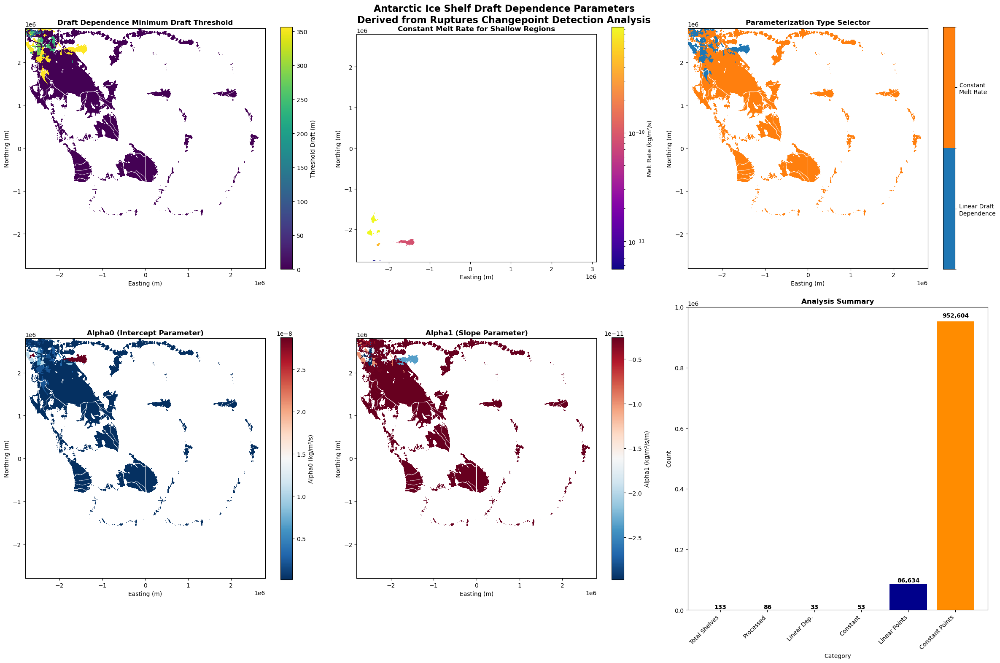


EXTENDED GRID FIELD CREATION COMPLETE!

The following files have been created:
📁 Directory: /Users/smurugan9/research/aislens/AISLENS/data/processed/draft_dependence_changepoint
📄 Individual fields:
   • ruptures_draftDepenBasalMelt_minDraft.nc
   • ruptures_draftDepenBasalMelt_constantMeltValue.nc
   • ruptures_draftDepenBasalMelt_paramType.nc
   • ruptures_draftDepenBasalMeltAlpha0.nc
   • ruptures_draftDepenBasalMeltAlpha1.nc
📄 Combined dataset:
   • ruptures_draftDepenBasalMelt_parameters.nc
📊 Visualization:
   • draft_dependence_fields_extended_overview.png

🎯 USAGE NOTES:
• Use paramType to determine parameterization: 0=linear dependence, 1=constant
• For paramType=0: Use alpha0 + alpha1*draft with minDraft threshold
• For paramType=1: Use constantMeltValue everywhere
• Alpha parameters are 0 for noisy ice shelves (paramType=1)

📊 ALPHA PARAMETER SUMMARY:
🔵 33 ice shelves with linear dependence (non-zero alphas)
🟠 53 ice shelves with constant melt (zero alphas)

Linear ice shelf

In [15]:
# Create visualizations of the draft dependence grid fields
def plot_draft_dependence_fields_extended(min_draft_field, constant_melt_field, param_type_field, 
                                        alpha0_field, alpha1_field, icems=None, save_plot=False, save_dir=None):
    """
    Create comprehensive visualization of the five draft dependence grid fields.
    """
    
    fig, axes = plt.subplots(2, 3, figsize=(24, 16))
    axes = axes.flatten()
    
    # Plot 1: Minimum Draft Threshold
    ax1 = axes[0]
    im1 = min_draft_field.plot(
        ax=ax1, cmap='viridis', add_colorbar=False,
        vmin=0, vmax=np.nanpercentile(min_draft_field.values, 95)
    )
    ax1.set_title('Draft Dependence Minimum Draft Threshold', fontsize=12, fontweight='bold')
    ax1.set_xlabel('Easting (m)')
    ax1.set_ylabel('Northing (m)')
    cbar1 = plt.colorbar(im1, ax=ax1, shrink=0.8, label='Threshold Draft (m)')
    
    if icems is not None:
        icems.boundary.plot(ax=ax1, color='white', linewidth=0.5, alpha=0.7)
    
    # Plot 2: Constant Melt Value
    ax2 = axes[1]
    melt_data = constant_melt_field.values.copy()
    melt_data[melt_data <= 0] = np.nan
    
    im2 = ax2.imshow(
        melt_data, extent=[constant_melt_field.x.min(), constant_melt_field.x.max(),
                          constant_melt_field.y.min(), constant_melt_field.y.max()],
        cmap='plasma', origin='lower', 
        norm=plt.matplotlib.colors.LogNorm(vmin=np.nanpercentile(melt_data, 5),
                                          vmax=np.nanpercentile(melt_data, 95))
    )
    ax2.set_title('Constant Melt Rate for Shallow Regions', fontsize=12, fontweight='bold')
    ax2.set_xlabel('Easting (m)')
    ax2.set_ylabel('Northing (m)')
    cbar2 = plt.colorbar(im2, ax=ax2, shrink=0.8, label='Melt Rate (kg/m²/s)')
    
    if icems is not None:
        icems.boundary.plot(ax=ax2, color='white', linewidth=0.5, alpha=0.7)
    
    # Plot 3: Parameter Type Selector
    ax3 = axes[2]
    from matplotlib.colors import ListedColormap, BoundaryNorm
    colors = ['#1f77b4', '#ff7f0e']
    cmap_discrete = ListedColormap(colors)
    bounds = [-0.5, 0.5, 1.5]
    norm = BoundaryNorm(bounds, cmap_discrete.N)
    
    im3 = param_type_field.plot(
        ax=ax3, cmap=cmap_discrete, norm=norm, add_colorbar=False
    )
    ax3.set_title('Parameterization Type Selector', fontsize=12, fontweight='bold')
    ax3.set_xlabel('Easting (m)')
    ax3.set_ylabel('Northing (m)')
    
    cbar3 = plt.colorbar(im3, ax=ax3, shrink=0.8, ticks=[0, 1])
    cbar3.set_ticklabels(['Linear Draft\nDependence', 'Constant\nMelt Rate'])
    
    if icems is not None:
        icems.boundary.plot(ax=ax3, color='white', linewidth=0.5, alpha=0.7)
    
    # Plot 4: Alpha0 (Intercept)
    ax4 = axes[3]
    alpha0_data = alpha0_field.values.copy()
    alpha0_nonzero = alpha0_data[alpha0_data != 0]
    
    if len(alpha0_nonzero) > 0:
        vmin, vmax = np.nanpercentile(alpha0_nonzero, [5, 95])
        im4 = alpha0_field.plot(ax=ax4, cmap='RdBu_r', add_colorbar=False, vmin=vmin, vmax=vmax)
    else:
        im4 = alpha0_field.plot(ax=ax4, cmap='RdBu_r', add_colorbar=False)
    
    ax4.set_title('Alpha0 (Intercept Parameter)', fontsize=12, fontweight='bold')
    ax4.set_xlabel('Easting (m)')
    ax4.set_ylabel('Northing (m)')
    cbar4 = plt.colorbar(im4, ax=ax4, shrink=0.8, label='Alpha0 (kg/m²/s)')
    
    if icems is not None:
        icems.boundary.plot(ax=ax4, color='white', linewidth=0.5, alpha=0.7)
    
    # Plot 5: Alpha1 (Slope)
    ax5 = axes[4]
    alpha1_data = alpha1_field.values.copy()
    alpha1_nonzero = alpha1_data[alpha1_data != 0]
    
    if len(alpha1_nonzero) > 0:
        vmin, vmax = np.nanpercentile(alpha1_nonzero, [5, 95])
        im5 = alpha1_field.plot(ax=ax5, cmap='RdBu_r', add_colorbar=False, vmin=vmin, vmax=vmax)
    else:
        im5 = alpha1_field.plot(ax=ax5, cmap='RdBu_r', add_colorbar=False)
    
    ax5.set_title('Alpha1 (Slope Parameter)', fontsize=12, fontweight='bold')
    ax5.set_xlabel('Easting (m)')
    ax5.set_ylabel('Northing (m)')
    cbar5 = plt.colorbar(im5, ax=ax5, shrink=0.8, label='Alpha1 (kg/m²/s/m)')
    
    if icems is not None:
        icems.boundary.plot(ax=ax5, color='white', linewidth=0.5, alpha=0.7)
    
    # Plot 6: Summary Statistics
    ax6 = axes[5]
    
    stats_data = {
        'Total Shelves': len(icems) if icems is not None else len(results_comprehensive),
        'Processed': len(results_comprehensive),
        'Linear Dep.': len([r for r in results_comprehensive.values() if r.get('is_meaningful', False)]),
        'Constant': len([r for r in results_comprehensive.values() if not r.get('is_meaningful', False)]),
        'Linear Points': int(np.sum(param_type_field.values == 0)),
        'Constant Points': int(np.sum(param_type_field.values == 1))
    }
    
    categories = list(stats_data.keys())
    values = list(stats_data.values())
    
    bars = ax6.bar(range(len(categories)), values, 
                   color=['gray', 'lightblue', 'blue', 'orange', 'darkblue', 'darkorange'])
    ax6.set_xlabel('Category')
    ax6.set_ylabel('Count')
    ax6.set_title('Analysis Summary', fontsize=12, fontweight='bold')
    ax6.set_xticks(range(len(categories)))
    ax6.set_xticklabels(categories, rotation=45, ha='right')
    
    for bar, value in zip(bars, values):
        height = bar.get_height()
        ax6.text(bar.get_x() + bar.get_width()/2., height + height*0.01,
                f'{value:,}', ha='center', va='bottom', fontweight='bold', fontsize=10)
    
    plt.tight_layout()
    
    fig.suptitle('Antarctic Ice Shelf Draft Dependence Parameters\n' + 
                 'Derived from Ruptures Changepoint Detection Analysis',
                 fontsize=16, fontweight='bold', y=0.98)
    
    if save_plot:
        if save_dir is None:
            save_dir = Path.cwd()
        save_path = Path(save_dir) / 'draft_dependence_fields_extended_overview.png'
        plt.savefig(save_path, dpi=300, bbox_inches='tight', facecolor='white')
        print(f"Plot saved to: {save_path}")
    
    plt.show()

# Create the extended visualization
plot_draft_dependence_fields_extended(
    min_draft_field, constant_melt_field, param_type_field, alpha0_field, alpha1_field,
    icems=icems, save_plot=True, save_dir=save_directory
)

print(f"\n" + "="*80)
print("EXTENDED GRID FIELD CREATION COMPLETE!")
print("="*80)
print(f"\nThe following files have been created:")
print(f"📁 Directory: {save_directory}")
print(f"📄 Individual fields:")
print(f"   • ruptures_draftDepenBasalMelt_minDraft.nc")
print(f"   • ruptures_draftDepenBasalMelt_constantMeltValue.nc") 
print(f"   • ruptures_draftDepenBasalMelt_paramType.nc")
print(f"   • ruptures_draftDepenBasalMeltAlpha0.nc")
print(f"   • ruptures_draftDepenBasalMeltAlpha1.nc")
print(f"📄 Combined dataset:")
print(f"   • ruptures_draftDepenBasalMelt_parameters.nc")
print(f"📊 Visualization:")
print(f"   • draft_dependence_fields_extended_overview.png")

print(f"\n🎯 USAGE NOTES:")
print(f"• Use paramType to determine parameterization: 0=linear dependence, 1=constant")
print(f"• For paramType=0: Use alpha0 + alpha1*draft with minDraft threshold")
print(f"• For paramType=1: Use constantMeltValue everywhere")
print(f"• Alpha parameters are 0 for noisy ice shelves (paramType=1)")

# Final summary of alpha parameters
print(f"\n📊 ALPHA PARAMETER SUMMARY:")
linear_shelves = [(name, result) for name, result in results_comprehensive.items() 
                 if result.get('is_meaningful', False)]
print(f"🔵 {len(linear_shelves)} ice shelves with linear dependence (non-zero alphas)")
print(f"🟠 {len(results_comprehensive) - len(linear_shelves)} ice shelves with constant melt (zero alphas)")

if len(linear_shelves) > 0:
    alpha0_values = [result.get('deep_intercept', 0) for _, result in linear_shelves]
    alpha1_values = [result.get('slope', 0) for _, result in linear_shelves]
    
    print(f"\nLinear ice shelf alpha statistics:")
    print(f"Alpha0 range: {np.min(alpha0_values):.2e} to {np.max(alpha0_values):.2e} kg/m²/s")
    print(f"Alpha1 range: {np.min(alpha1_values):.2e} to {np.max(alpha1_values):.2e} kg/m²/s/m")

In [16]:
combined_params = xr.open_dataset(save_directory / saved_files['combined'])

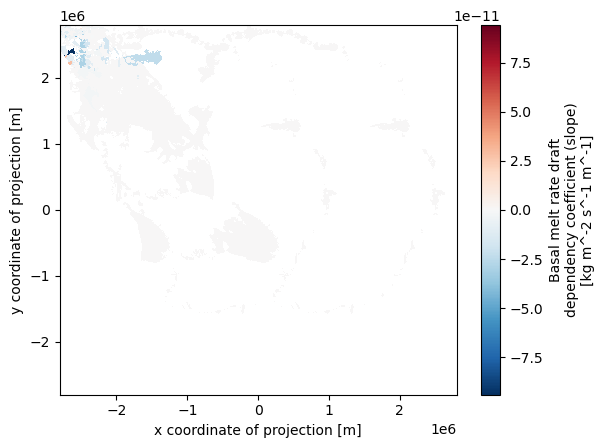

In [19]:
combined_params.draftDepenBasalMeltAlpha1.plot()